<a href="https://colab.research.google.com/github/pranjalchaubey/GAN/blob/master/src/fashion_mnist_gan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import keras
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

Using TensorFlow backend.


In [2]:
(x_train, y_train), (x_test, y_test) = keras.datasets.fashion_mnist.load_data()

4423680/4422102 [==============================] - 1s 0us/step


In [0]:
x_train = x_train/127.5-1

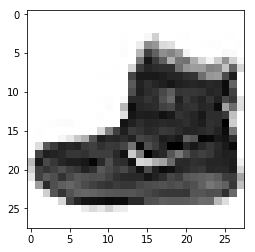

In [4]:
plt.imshow(x_train[0], cmap='Greys')

In [0]:
from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU

In [0]:
x_train = np.expand_dims(x_train, axis=3)

In [7]:
def create_generator():
  model = Sequential()

  model.add(Dense(256, input_dim=100))
  model.add(LeakyReLU(0.2))
  model.add(BatchNormalization(momentum=0.8))
  
  model.add(Dense(512))
  model.add(LeakyReLU(0.2))
  model.add(BatchNormalization(momentum=0.8))

  model.add(Dense(1024))
  model.add(LeakyReLU(0.2))
  model.add(BatchNormalization(momentum=0.8))

  model.add(Dense(np.prod((28, 28, 1)), activation='tanh'))
  model.add(Reshape((28, 28, 1)))

  model.summary()

  noise = Input(shape=(100,))
  img = model(noise)

  return Model(noise, img)

generator = create_generator()
z = Input(shape=(100,))
img = generator(z)





Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 256)               25856     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 256)               0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 256)               1024      
_________________________________________________________________
dense_2 (Dense)              (None, 512)               131584    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
batch_normalization_2 (Batch (None, 512)               2048      
_________________________________________________________________
dense_3 (Dense)              (None, 1024)         

In [8]:
def create_discriminator():
  model = Sequential()

  model.add(Flatten(input_shape=(28, 28, 1)))
  model.add(Dense(512))
  model.add(LeakyReLU(0.2))
  model.add(Dense(256))
  model.add(LeakyReLU(0.2))
  model.add(Dense(1, activation='sigmoid'))
  model.summary()

  img = Input(shape=(28, 28, 1))
  validity = model(img)

  return Model(img, validity)

discriminator = create_discriminator()
discriminator.compile(loss='binary_crossentropy', optimizer=Adam(0.0002, 0.5), metrics=['accuracy'])
discriminator.trainable = False

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 784)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 512)               401920    
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 256)               131328    
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 256)               0         
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 257       
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
________________________________________________

In [0]:
validity = discriminator(img)
combined = Model(z, validity)
combined.compile(loss='binary_crossentropy', optimizer=Adam(0.0002, 0.5))

In [0]:
def sample_images(epoch):
  r, c = 5, 5
  noise = np.random.normal(0, 1, (r*c, 100))
  gen_imgs = generator.predict(noise)

  # Rescale images 0 - 1
  gen_imgs = 0.5*gen_imgs+0.5

  fig, axs = plt.subplots(r, c)
  cnt = 0
  for i in range(r):
    for j in range(c):
      axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
      axs[i, j].axis('off')
      cnt += 1
  #fig.savefig("images/%d.png" % epoch)
  plt.show()
  plt.close()

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


0 [D loss: 0.564821, acc.: 62.50%] [G loss: 0.558323]


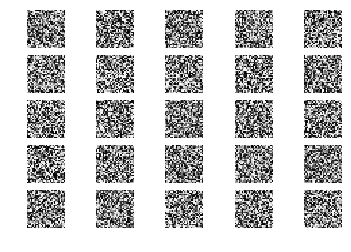

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


1 [D loss: 0.494151, acc.: 64.06%] [G loss: 0.607076]
2 [D loss: 0.465468, acc.: 68.75%] [G loss: 0.836801]
3 [D loss: 0.333043, acc.: 82.81%] [G loss: 0.912544]
4 [D loss: 0.299781, acc.: 89.06%] [G loss: 1.144773]
5 [D loss: 0.255067, acc.: 95.31%] [G loss: 1.283119]
6 [D loss: 0.229336, acc.: 98.44%] [G loss: 1.402201]
7 [D loss: 0.185316, acc.: 98.44%] [G loss: 1.457958]
8 [D loss: 0.150149, acc.: 100.00%] [G loss: 1.612539]
9 [D loss: 0.163324, acc.: 96.88%] [G loss: 1.667646]
10 [D loss: 0.127531, acc.: 100.00%] [G loss: 1.820843]
11 [D loss: 0.110981, acc.: 100.00%] [G loss: 1.861599]
12 [D loss: 0.111732, acc.: 100.00%] [G loss: 1.874659]
13 [D loss: 0.087127, acc.: 100.00%] [G loss: 2.049341]
14 [D loss: 0.081867, acc.: 100.00%] [G loss: 1.997797]
15 [D loss: 0.086881, acc.: 100.00%] [G loss: 2.212497]
16 [D loss: 0.074651, acc.: 100.00%] [G loss: 2.226036]
17 [D loss: 0.080479, acc.: 100.00%] [G loss: 2.238324]
18 [D loss: 0.073892, acc.: 98.44%] [G loss: 2.266804]
19 [D loss

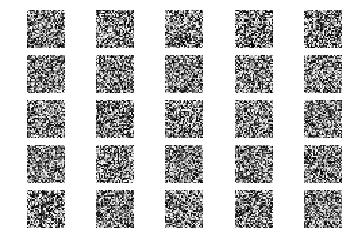

51 [D loss: 0.016798, acc.: 100.00%] [G loss: 3.649841]
52 [D loss: 0.025444, acc.: 100.00%] [G loss: 3.602355]
53 [D loss: 0.018521, acc.: 100.00%] [G loss: 3.594790]
54 [D loss: 0.031658, acc.: 100.00%] [G loss: 3.703136]
55 [D loss: 0.029762, acc.: 100.00%] [G loss: 3.740852]
56 [D loss: 0.026984, acc.: 100.00%] [G loss: 3.812474]
57 [D loss: 0.024981, acc.: 100.00%] [G loss: 3.719376]
58 [D loss: 0.019199, acc.: 100.00%] [G loss: 3.872042]
59 [D loss: 0.022408, acc.: 100.00%] [G loss: 3.889807]
60 [D loss: 0.017271, acc.: 100.00%] [G loss: 3.919085]
61 [D loss: 0.013961, acc.: 100.00%] [G loss: 3.996141]
62 [D loss: 0.019653, acc.: 100.00%] [G loss: 3.793908]
63 [D loss: 0.016417, acc.: 100.00%] [G loss: 3.913825]
64 [D loss: 0.013928, acc.: 100.00%] [G loss: 3.877279]
65 [D loss: 0.017849, acc.: 100.00%] [G loss: 3.974147]
66 [D loss: 0.016903, acc.: 100.00%] [G loss: 3.888127]
67 [D loss: 0.015959, acc.: 100.00%] [G loss: 3.939695]
68 [D loss: 0.015064, acc.: 100.00%] [G loss: 4.

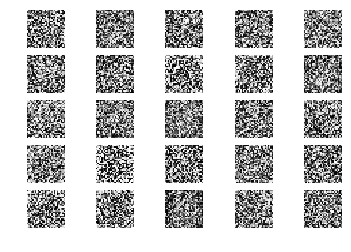

101 [D loss: 0.012142, acc.: 100.00%] [G loss: 4.531570]
102 [D loss: 0.012360, acc.: 100.00%] [G loss: 4.566887]
103 [D loss: 0.018103, acc.: 100.00%] [G loss: 4.574105]
104 [D loss: 0.010753, acc.: 100.00%] [G loss: 4.537742]
105 [D loss: 0.010620, acc.: 100.00%] [G loss: 4.594079]
106 [D loss: 0.009937, acc.: 100.00%] [G loss: 4.572062]
107 [D loss: 0.019943, acc.: 100.00%] [G loss: 4.601518]
108 [D loss: 0.015445, acc.: 100.00%] [G loss: 4.599355]
109 [D loss: 0.015460, acc.: 100.00%] [G loss: 4.663607]
110 [D loss: 0.013523, acc.: 100.00%] [G loss: 4.635043]
111 [D loss: 0.018952, acc.: 100.00%] [G loss: 4.610756]
112 [D loss: 0.021161, acc.: 100.00%] [G loss: 4.647901]
113 [D loss: 0.023165, acc.: 100.00%] [G loss: 4.694596]
114 [D loss: 0.008334, acc.: 100.00%] [G loss: 4.548146]
115 [D loss: 0.010127, acc.: 100.00%] [G loss: 4.790429]
116 [D loss: 0.027108, acc.: 100.00%] [G loss: 4.549528]
117 [D loss: 0.020025, acc.: 100.00%] [G loss: 4.469734]
118 [D loss: 0.014018, acc.: 10

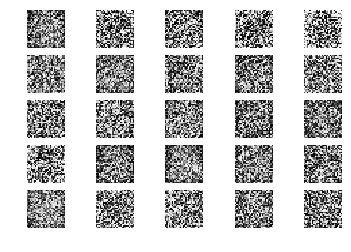

151 [D loss: 0.025607, acc.: 100.00%] [G loss: 5.049034]
152 [D loss: 0.011210, acc.: 100.00%] [G loss: 5.016674]
153 [D loss: 0.085721, acc.: 96.88%] [G loss: 4.669351]
154 [D loss: 0.014905, acc.: 100.00%] [G loss: 4.949556]
155 [D loss: 0.022372, acc.: 100.00%] [G loss: 5.080404]
156 [D loss: 0.045943, acc.: 100.00%] [G loss: 5.286722]
157 [D loss: 0.076122, acc.: 96.88%] [G loss: 5.049163]
158 [D loss: 0.033750, acc.: 100.00%] [G loss: 5.450583]
159 [D loss: 0.048394, acc.: 100.00%] [G loss: 5.439592]
160 [D loss: 0.037050, acc.: 100.00%] [G loss: 5.300088]
161 [D loss: 0.113426, acc.: 95.31%] [G loss: 4.731576]
162 [D loss: 0.075502, acc.: 98.44%] [G loss: 5.473004]
163 [D loss: 0.246412, acc.: 90.62%] [G loss: 5.176948]
164 [D loss: 0.015456, acc.: 100.00%] [G loss: 5.364563]
165 [D loss: 0.085749, acc.: 95.31%] [G loss: 5.259444]
166 [D loss: 0.012034, acc.: 100.00%] [G loss: 5.348845]
167 [D loss: 0.079327, acc.: 98.44%] [G loss: 5.045292]
168 [D loss: 0.086892, acc.: 96.88%] [

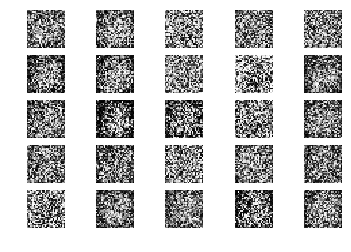

201 [D loss: 0.164571, acc.: 93.75%] [G loss: 4.136775]
202 [D loss: 0.054676, acc.: 98.44%] [G loss: 4.454626]
203 [D loss: 0.115144, acc.: 95.31%] [G loss: 4.767745]
204 [D loss: 0.119953, acc.: 96.88%] [G loss: 4.291688]
205 [D loss: 0.080228, acc.: 95.31%] [G loss: 4.214787]
206 [D loss: 0.074995, acc.: 96.88%] [G loss: 4.466270]
207 [D loss: 0.047726, acc.: 100.00%] [G loss: 4.122352]
208 [D loss: 0.140640, acc.: 93.75%] [G loss: 4.441021]
209 [D loss: 0.316097, acc.: 84.38%] [G loss: 4.483070]
210 [D loss: 0.070302, acc.: 98.44%] [G loss: 5.064719]
211 [D loss: 0.408029, acc.: 87.50%] [G loss: 3.099800]
212 [D loss: 0.240794, acc.: 89.06%] [G loss: 3.920813]
213 [D loss: 0.067231, acc.: 100.00%] [G loss: 4.805525]
214 [D loss: 0.439311, acc.: 85.94%] [G loss: 3.576772]
215 [D loss: 0.104953, acc.: 95.31%] [G loss: 4.121724]
216 [D loss: 0.152517, acc.: 93.75%] [G loss: 4.315751]
217 [D loss: 0.206336, acc.: 92.19%] [G loss: 4.685457]
218 [D loss: 0.071466, acc.: 100.00%] [G loss:

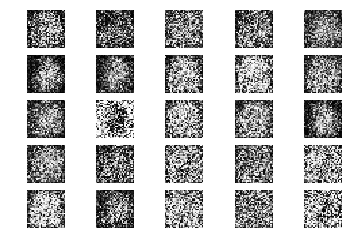

251 [D loss: 0.189006, acc.: 95.31%] [G loss: 3.999627]
252 [D loss: 0.068957, acc.: 98.44%] [G loss: 3.754219]
253 [D loss: 0.142715, acc.: 96.88%] [G loss: 3.861877]
254 [D loss: 0.385327, acc.: 82.81%] [G loss: 3.152304]
255 [D loss: 0.177585, acc.: 93.75%] [G loss: 3.428363]
256 [D loss: 0.126464, acc.: 96.88%] [G loss: 3.991537]
257 [D loss: 0.247191, acc.: 90.62%] [G loss: 4.155899]
258 [D loss: 0.095604, acc.: 98.44%] [G loss: 3.826147]
259 [D loss: 0.412552, acc.: 78.12%] [G loss: 2.839029]
260 [D loss: 0.266717, acc.: 85.94%] [G loss: 4.552652]
261 [D loss: 0.529816, acc.: 73.44%] [G loss: 3.420841]
262 [D loss: 0.221379, acc.: 90.62%] [G loss: 3.988895]
263 [D loss: 0.096643, acc.: 95.31%] [G loss: 3.886682]
264 [D loss: 0.166043, acc.: 93.75%] [G loss: 3.599349]
265 [D loss: 0.195341, acc.: 89.06%] [G loss: 3.738927]
266 [D loss: 0.138509, acc.: 96.88%] [G loss: 3.720744]
267 [D loss: 0.263905, acc.: 85.94%] [G loss: 3.379812]
268 [D loss: 0.345545, acc.: 82.81%] [G loss: 3.

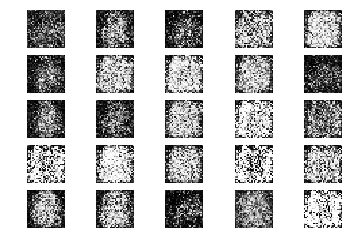

301 [D loss: 0.512963, acc.: 78.12%] [G loss: 3.590486]
302 [D loss: 0.306175, acc.: 81.25%] [G loss: 4.293218]
303 [D loss: 0.399850, acc.: 81.25%] [G loss: 3.924401]
304 [D loss: 0.524554, acc.: 71.88%] [G loss: 3.706821]
305 [D loss: 0.296513, acc.: 84.38%] [G loss: 3.347697]
306 [D loss: 0.207624, acc.: 96.88%] [G loss: 3.169220]
307 [D loss: 0.531073, acc.: 68.75%] [G loss: 3.606019]
308 [D loss: 0.332543, acc.: 89.06%] [G loss: 2.994686]
309 [D loss: 0.230374, acc.: 89.06%] [G loss: 3.793837]
310 [D loss: 0.235013, acc.: 92.19%] [G loss: 3.458074]
311 [D loss: 0.526221, acc.: 84.38%] [G loss: 2.713620]
312 [D loss: 0.232663, acc.: 89.06%] [G loss: 3.647869]
313 [D loss: 0.438571, acc.: 76.56%] [G loss: 2.872329]
314 [D loss: 0.156237, acc.: 95.31%] [G loss: 3.539148]
315 [D loss: 0.587896, acc.: 75.00%] [G loss: 3.249942]
316 [D loss: 0.187684, acc.: 93.75%] [G loss: 3.008495]
317 [D loss: 0.491067, acc.: 78.12%] [G loss: 2.768739]
318 [D loss: 0.157211, acc.: 95.31%] [G loss: 3.

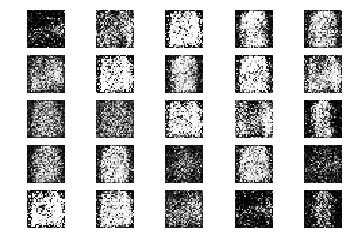

351 [D loss: 0.592327, acc.: 81.25%] [G loss: 2.468807]
352 [D loss: 0.429798, acc.: 87.50%] [G loss: 3.376231]
353 [D loss: 0.393297, acc.: 78.12%] [G loss: 2.679456]
354 [D loss: 0.257731, acc.: 89.06%] [G loss: 3.385875]
355 [D loss: 0.299438, acc.: 87.50%] [G loss: 3.007580]
356 [D loss: 0.338109, acc.: 81.25%] [G loss: 3.573998]
357 [D loss: 0.802444, acc.: 64.06%] [G loss: 2.521540]
358 [D loss: 0.642942, acc.: 62.50%] [G loss: 3.186180]
359 [D loss: 0.526457, acc.: 79.69%] [G loss: 2.892229]
360 [D loss: 0.310397, acc.: 85.94%] [G loss: 2.919463]
361 [D loss: 0.456507, acc.: 82.81%] [G loss: 2.980153]
362 [D loss: 0.357275, acc.: 87.50%] [G loss: 2.338789]
363 [D loss: 0.409240, acc.: 81.25%] [G loss: 2.752284]
364 [D loss: 0.286329, acc.: 79.69%] [G loss: 3.174869]
365 [D loss: 0.624649, acc.: 70.31%] [G loss: 2.450659]
366 [D loss: 0.328639, acc.: 89.06%] [G loss: 3.134944]
367 [D loss: 0.239927, acc.: 95.31%] [G loss: 2.288573]
368 [D loss: 0.335836, acc.: 89.06%] [G loss: 2.

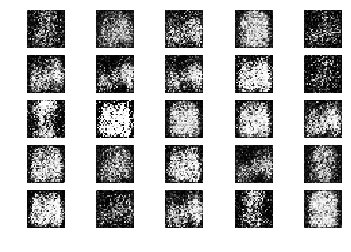

401 [D loss: 0.490027, acc.: 78.12%] [G loss: 2.292041]
402 [D loss: 0.495061, acc.: 81.25%] [G loss: 2.488428]
403 [D loss: 0.334997, acc.: 92.19%] [G loss: 2.300162]
404 [D loss: 0.609442, acc.: 67.19%] [G loss: 1.994166]
405 [D loss: 0.437241, acc.: 81.25%] [G loss: 2.485019]
406 [D loss: 0.606357, acc.: 75.00%] [G loss: 1.937430]
407 [D loss: 0.641521, acc.: 75.00%] [G loss: 2.154305]
408 [D loss: 0.535222, acc.: 75.00%] [G loss: 2.151635]
409 [D loss: 0.411815, acc.: 81.25%] [G loss: 2.572884]
410 [D loss: 0.874749, acc.: 67.19%] [G loss: 2.166992]
411 [D loss: 0.890709, acc.: 51.56%] [G loss: 1.978465]
412 [D loss: 0.769922, acc.: 56.25%] [G loss: 2.240440]
413 [D loss: 0.442167, acc.: 87.50%] [G loss: 2.146940]
414 [D loss: 0.565683, acc.: 71.88%] [G loss: 2.186073]
415 [D loss: 0.597330, acc.: 81.25%] [G loss: 1.845667]
416 [D loss: 0.580203, acc.: 75.00%] [G loss: 2.219282]
417 [D loss: 0.625637, acc.: 73.44%] [G loss: 1.988390]
418 [D loss: 0.452583, acc.: 89.06%] [G loss: 2.

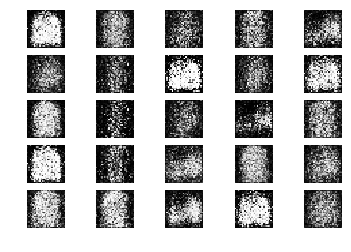

451 [D loss: 0.685318, acc.: 57.81%] [G loss: 1.595073]
452 [D loss: 0.744444, acc.: 62.50%] [G loss: 1.477693]
453 [D loss: 0.924882, acc.: 50.00%] [G loss: 1.124581]
454 [D loss: 0.658264, acc.: 64.06%] [G loss: 1.353555]
455 [D loss: 0.488284, acc.: 76.56%] [G loss: 1.368180]
456 [D loss: 0.691695, acc.: 65.62%] [G loss: 1.512624]
457 [D loss: 0.929076, acc.: 48.44%] [G loss: 1.320195]
458 [D loss: 0.748733, acc.: 51.56%] [G loss: 1.145388]
459 [D loss: 0.659870, acc.: 56.25%] [G loss: 1.232981]
460 [D loss: 0.567618, acc.: 78.12%] [G loss: 1.355441]
461 [D loss: 0.653431, acc.: 73.44%] [G loss: 1.370186]
462 [D loss: 0.608907, acc.: 62.50%] [G loss: 1.086678]
463 [D loss: 0.524519, acc.: 71.88%] [G loss: 1.253154]
464 [D loss: 0.604457, acc.: 75.00%] [G loss: 1.236527]
465 [D loss: 0.674472, acc.: 54.69%] [G loss: 1.209677]
466 [D loss: 0.668315, acc.: 67.19%] [G loss: 1.227552]
467 [D loss: 0.591056, acc.: 73.44%] [G loss: 1.326301]
468 [D loss: 0.639706, acc.: 67.19%] [G loss: 1.

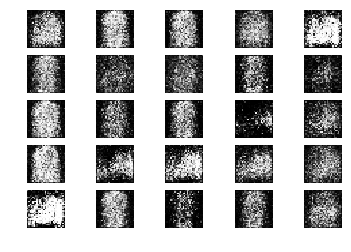

501 [D loss: 0.588191, acc.: 71.88%] [G loss: 1.199929]
502 [D loss: 0.674671, acc.: 60.94%] [G loss: 1.131126]
503 [D loss: 0.528278, acc.: 79.69%] [G loss: 1.272211]
504 [D loss: 0.667533, acc.: 57.81%] [G loss: 1.197340]
505 [D loss: 0.613229, acc.: 67.19%] [G loss: 1.131576]
506 [D loss: 0.605395, acc.: 68.75%] [G loss: 1.315744]
507 [D loss: 0.609698, acc.: 71.88%] [G loss: 1.236651]
508 [D loss: 0.613419, acc.: 70.31%] [G loss: 1.096149]
509 [D loss: 0.499739, acc.: 78.12%] [G loss: 1.218906]
510 [D loss: 0.477115, acc.: 76.56%] [G loss: 1.314572]
511 [D loss: 0.467495, acc.: 71.88%] [G loss: 1.464314]
512 [D loss: 0.679405, acc.: 51.56%] [G loss: 1.280395]
513 [D loss: 0.667010, acc.: 71.88%] [G loss: 1.302109]
514 [D loss: 0.528417, acc.: 78.12%] [G loss: 1.237463]
515 [D loss: 0.602565, acc.: 67.19%] [G loss: 1.112946]
516 [D loss: 0.555571, acc.: 73.44%] [G loss: 1.162802]
517 [D loss: 0.531392, acc.: 82.81%] [G loss: 1.194274]
518 [D loss: 0.478122, acc.: 81.25%] [G loss: 1.

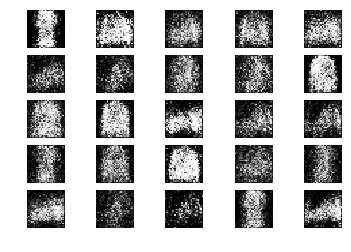

551 [D loss: 0.580279, acc.: 78.12%] [G loss: 1.254695]
552 [D loss: 0.530292, acc.: 76.56%] [G loss: 1.169656]
553 [D loss: 0.707918, acc.: 68.75%] [G loss: 1.113124]
554 [D loss: 0.567425, acc.: 73.44%] [G loss: 1.164028]
555 [D loss: 0.540663, acc.: 70.31%] [G loss: 1.303968]
556 [D loss: 0.701155, acc.: 60.94%] [G loss: 1.190750]
557 [D loss: 0.659784, acc.: 59.38%] [G loss: 1.058821]
558 [D loss: 0.570791, acc.: 70.31%] [G loss: 1.040968]
559 [D loss: 0.567971, acc.: 73.44%] [G loss: 1.210123]
560 [D loss: 0.570445, acc.: 71.88%] [G loss: 1.186161]
561 [D loss: 0.626143, acc.: 62.50%] [G loss: 1.322157]
562 [D loss: 0.558407, acc.: 73.44%] [G loss: 1.182782]
563 [D loss: 0.819951, acc.: 51.56%] [G loss: 0.999963]
564 [D loss: 0.605121, acc.: 65.62%] [G loss: 0.941823]
565 [D loss: 0.525711, acc.: 75.00%] [G loss: 1.054390]
566 [D loss: 0.540153, acc.: 78.12%] [G loss: 1.068352]
567 [D loss: 0.676469, acc.: 64.06%] [G loss: 1.138443]
568 [D loss: 0.709523, acc.: 56.25%] [G loss: 0.

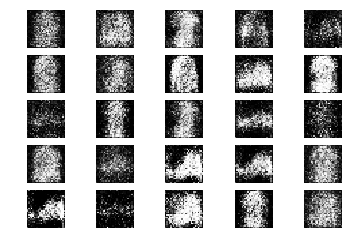

601 [D loss: 0.504170, acc.: 78.12%] [G loss: 1.062206]
602 [D loss: 0.647391, acc.: 68.75%] [G loss: 1.076619]
603 [D loss: 0.605107, acc.: 70.31%] [G loss: 1.182449]
604 [D loss: 0.625317, acc.: 67.19%] [G loss: 1.166692]
605 [D loss: 0.657525, acc.: 62.50%] [G loss: 0.979032]
606 [D loss: 0.664361, acc.: 59.38%] [G loss: 1.034758]
607 [D loss: 0.566511, acc.: 73.44%] [G loss: 1.059178]
608 [D loss: 0.634863, acc.: 62.50%] [G loss: 1.059989]
609 [D loss: 0.701634, acc.: 54.69%] [G loss: 1.148133]
610 [D loss: 0.625459, acc.: 57.81%] [G loss: 1.115758]
611 [D loss: 0.625680, acc.: 67.19%] [G loss: 1.096125]
612 [D loss: 0.667672, acc.: 67.19%] [G loss: 0.996964]
613 [D loss: 0.558259, acc.: 75.00%] [G loss: 1.035325]
614 [D loss: 0.613716, acc.: 67.19%] [G loss: 1.084272]
615 [D loss: 0.561026, acc.: 67.19%] [G loss: 1.041461]
616 [D loss: 0.648182, acc.: 56.25%] [G loss: 1.070508]
617 [D loss: 0.532516, acc.: 73.44%] [G loss: 1.150463]
618 [D loss: 0.483469, acc.: 73.44%] [G loss: 1.

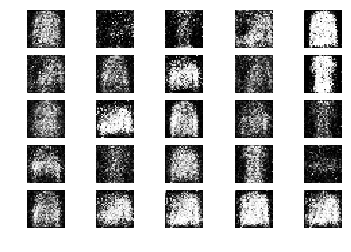

651 [D loss: 0.534993, acc.: 76.56%] [G loss: 1.079626]
652 [D loss: 0.573689, acc.: 70.31%] [G loss: 1.196946]
653 [D loss: 0.654749, acc.: 70.31%] [G loss: 1.063570]
654 [D loss: 0.528585, acc.: 79.69%] [G loss: 1.095025]
655 [D loss: 0.561705, acc.: 76.56%] [G loss: 1.018199]
656 [D loss: 0.586967, acc.: 64.06%] [G loss: 1.092277]
657 [D loss: 0.608079, acc.: 70.31%] [G loss: 1.027734]
658 [D loss: 0.498039, acc.: 82.81%] [G loss: 1.156404]
659 [D loss: 0.558087, acc.: 71.88%] [G loss: 1.154467]
660 [D loss: 0.545222, acc.: 71.88%] [G loss: 1.087241]
661 [D loss: 0.589303, acc.: 68.75%] [G loss: 1.102218]
662 [D loss: 0.612919, acc.: 64.06%] [G loss: 1.047507]
663 [D loss: 0.542804, acc.: 70.31%] [G loss: 1.182130]
664 [D loss: 0.497589, acc.: 81.25%] [G loss: 1.147604]
665 [D loss: 0.612294, acc.: 67.19%] [G loss: 1.057916]
666 [D loss: 0.491291, acc.: 81.25%] [G loss: 1.126047]
667 [D loss: 0.567212, acc.: 75.00%] [G loss: 1.062996]
668 [D loss: 0.569310, acc.: 68.75%] [G loss: 0.

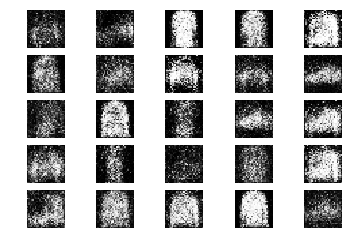

701 [D loss: 0.595289, acc.: 65.62%] [G loss: 0.954365]
702 [D loss: 0.562063, acc.: 71.88%] [G loss: 0.964011]
703 [D loss: 0.531820, acc.: 71.88%] [G loss: 1.078681]
704 [D loss: 0.665938, acc.: 51.56%] [G loss: 1.037313]
705 [D loss: 0.572615, acc.: 67.19%] [G loss: 0.981560]
706 [D loss: 0.675157, acc.: 57.81%] [G loss: 1.074933]
707 [D loss: 0.670972, acc.: 59.38%] [G loss: 1.004674]
708 [D loss: 0.541158, acc.: 81.25%] [G loss: 1.105228]
709 [D loss: 0.544242, acc.: 71.88%] [G loss: 0.934574]
710 [D loss: 0.589596, acc.: 68.75%] [G loss: 0.995724]
711 [D loss: 0.630799, acc.: 62.50%] [G loss: 1.003121]
712 [D loss: 0.624790, acc.: 62.50%] [G loss: 1.059699]
713 [D loss: 0.646018, acc.: 64.06%] [G loss: 1.122592]
714 [D loss: 0.582517, acc.: 70.31%] [G loss: 1.241745]
715 [D loss: 0.741392, acc.: 56.25%] [G loss: 0.992475]
716 [D loss: 0.555085, acc.: 70.31%] [G loss: 0.940172]
717 [D loss: 0.556396, acc.: 71.88%] [G loss: 1.048805]
718 [D loss: 0.604526, acc.: 67.19%] [G loss: 0.

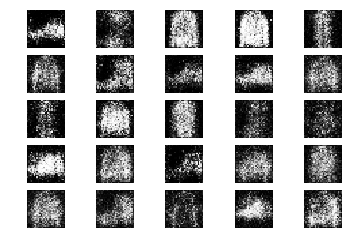

751 [D loss: 0.695341, acc.: 56.25%] [G loss: 0.921889]
752 [D loss: 0.536896, acc.: 78.12%] [G loss: 0.854710]
753 [D loss: 0.558671, acc.: 67.19%] [G loss: 0.917974]
754 [D loss: 0.662090, acc.: 59.38%] [G loss: 1.028494]
755 [D loss: 0.572874, acc.: 65.62%] [G loss: 0.976946]
756 [D loss: 0.519098, acc.: 76.56%] [G loss: 1.020751]
757 [D loss: 0.733753, acc.: 57.81%] [G loss: 1.008167]
758 [D loss: 0.535466, acc.: 78.12%] [G loss: 0.951007]
759 [D loss: 0.551527, acc.: 71.88%] [G loss: 1.139640]
760 [D loss: 0.528267, acc.: 82.81%] [G loss: 1.066319]
761 [D loss: 0.536636, acc.: 78.12%] [G loss: 1.096300]
762 [D loss: 0.480385, acc.: 79.69%] [G loss: 1.018190]
763 [D loss: 0.643861, acc.: 62.50%] [G loss: 1.137541]
764 [D loss: 0.494668, acc.: 75.00%] [G loss: 1.290084]
765 [D loss: 0.544540, acc.: 76.56%] [G loss: 1.250198]
766 [D loss: 0.643688, acc.: 68.75%] [G loss: 1.044852]
767 [D loss: 0.542170, acc.: 73.44%] [G loss: 1.027509]
768 [D loss: 0.566591, acc.: 70.31%] [G loss: 1.

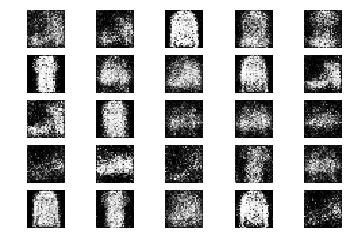

801 [D loss: 0.601414, acc.: 68.75%] [G loss: 1.205914]
802 [D loss: 0.570089, acc.: 75.00%] [G loss: 1.134722]
803 [D loss: 0.552979, acc.: 76.56%] [G loss: 1.118546]
804 [D loss: 0.543319, acc.: 73.44%] [G loss: 1.140204]
805 [D loss: 0.566185, acc.: 75.00%] [G loss: 1.036666]
806 [D loss: 0.545576, acc.: 71.88%] [G loss: 1.142706]
807 [D loss: 0.507504, acc.: 75.00%] [G loss: 1.049495]
808 [D loss: 0.597695, acc.: 65.62%] [G loss: 1.048193]
809 [D loss: 0.620491, acc.: 71.88%] [G loss: 1.178063]
810 [D loss: 0.491339, acc.: 76.56%] [G loss: 1.215984]
811 [D loss: 0.665872, acc.: 59.38%] [G loss: 1.177920]
812 [D loss: 0.678347, acc.: 57.81%] [G loss: 1.262247]
813 [D loss: 0.576524, acc.: 70.31%] [G loss: 0.951822]
814 [D loss: 0.500894, acc.: 78.12%] [G loss: 1.002650]
815 [D loss: 0.598764, acc.: 67.19%] [G loss: 1.052113]
816 [D loss: 0.534442, acc.: 75.00%] [G loss: 1.136298]
817 [D loss: 0.523411, acc.: 71.88%] [G loss: 1.150682]
818 [D loss: 0.596432, acc.: 70.31%] [G loss: 1.

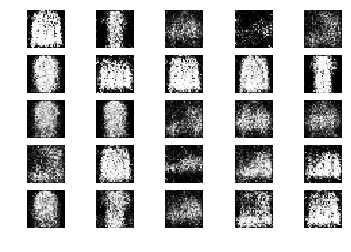

851 [D loss: 0.621756, acc.: 68.75%] [G loss: 0.932483]
852 [D loss: 0.593265, acc.: 73.44%] [G loss: 1.043165]
853 [D loss: 0.563136, acc.: 67.19%] [G loss: 1.053587]
854 [D loss: 0.631558, acc.: 70.31%] [G loss: 1.071377]
855 [D loss: 0.557695, acc.: 68.75%] [G loss: 1.025700]
856 [D loss: 0.623131, acc.: 68.75%] [G loss: 0.960685]
857 [D loss: 0.523791, acc.: 79.69%] [G loss: 1.105312]
858 [D loss: 0.521059, acc.: 75.00%] [G loss: 1.080927]
859 [D loss: 0.626461, acc.: 62.50%] [G loss: 0.894734]
860 [D loss: 0.626372, acc.: 60.94%] [G loss: 0.952920]
861 [D loss: 0.492843, acc.: 82.81%] [G loss: 0.963827]
862 [D loss: 0.608838, acc.: 68.75%] [G loss: 1.141145]
863 [D loss: 0.533694, acc.: 73.44%] [G loss: 0.987835]
864 [D loss: 0.699654, acc.: 57.81%] [G loss: 1.133929]
865 [D loss: 0.516339, acc.: 75.00%] [G loss: 1.179707]
866 [D loss: 0.530067, acc.: 78.12%] [G loss: 1.134516]
867 [D loss: 0.567884, acc.: 70.31%] [G loss: 1.116953]
868 [D loss: 0.539659, acc.: 76.56%] [G loss: 1.

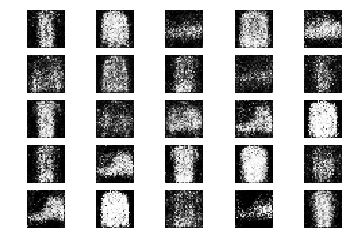

901 [D loss: 0.579782, acc.: 71.88%] [G loss: 1.083484]
902 [D loss: 0.622025, acc.: 62.50%] [G loss: 1.017084]
903 [D loss: 0.628371, acc.: 67.19%] [G loss: 0.977184]
904 [D loss: 0.652544, acc.: 56.25%] [G loss: 1.079725]
905 [D loss: 0.591717, acc.: 68.75%] [G loss: 0.971766]
906 [D loss: 0.646382, acc.: 73.44%] [G loss: 1.138543]
907 [D loss: 0.703668, acc.: 60.94%] [G loss: 0.993533]
908 [D loss: 0.579888, acc.: 73.44%] [G loss: 0.937325]
909 [D loss: 0.582742, acc.: 62.50%] [G loss: 1.077272]
910 [D loss: 0.650645, acc.: 62.50%] [G loss: 1.029889]
911 [D loss: 0.708117, acc.: 56.25%] [G loss: 1.154649]
912 [D loss: 0.636448, acc.: 56.25%] [G loss: 1.094790]
913 [D loss: 0.611310, acc.: 64.06%] [G loss: 1.009612]
914 [D loss: 0.601410, acc.: 64.06%] [G loss: 1.001454]
915 [D loss: 0.653639, acc.: 59.38%] [G loss: 1.098978]
916 [D loss: 0.548644, acc.: 78.12%] [G loss: 1.020791]
917 [D loss: 0.533045, acc.: 76.56%] [G loss: 0.980742]
918 [D loss: 0.587852, acc.: 71.88%] [G loss: 1.

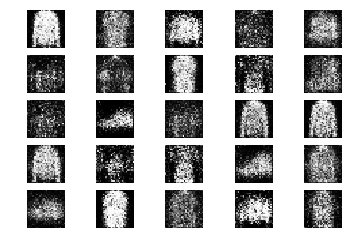

951 [D loss: 0.519681, acc.: 73.44%] [G loss: 1.131809]
952 [D loss: 0.645600, acc.: 59.38%] [G loss: 1.056241]
953 [D loss: 0.630139, acc.: 64.06%] [G loss: 1.071117]
954 [D loss: 0.574566, acc.: 68.75%] [G loss: 1.188162]
955 [D loss: 0.609302, acc.: 57.81%] [G loss: 1.070925]
956 [D loss: 0.642993, acc.: 60.94%] [G loss: 1.006845]
957 [D loss: 0.553145, acc.: 76.56%] [G loss: 1.064012]
958 [D loss: 0.806060, acc.: 45.31%] [G loss: 0.947517]
959 [D loss: 0.574394, acc.: 70.31%] [G loss: 1.027982]
960 [D loss: 0.683670, acc.: 57.81%] [G loss: 1.087149]
961 [D loss: 0.567953, acc.: 71.88%] [G loss: 1.117813]
962 [D loss: 0.584028, acc.: 68.75%] [G loss: 1.049046]
963 [D loss: 0.587200, acc.: 65.62%] [G loss: 1.029353]
964 [D loss: 0.698036, acc.: 53.12%] [G loss: 1.046375]
965 [D loss: 0.610993, acc.: 70.31%] [G loss: 1.041617]
966 [D loss: 0.601906, acc.: 62.50%] [G loss: 1.074947]
967 [D loss: 0.510079, acc.: 79.69%] [G loss: 0.858687]
968 [D loss: 0.693814, acc.: 62.50%] [G loss: 0.

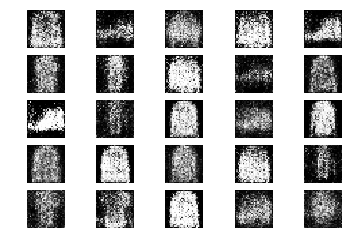

1001 [D loss: 0.542134, acc.: 75.00%] [G loss: 1.036759]
1002 [D loss: 0.562526, acc.: 65.62%] [G loss: 1.049643]
1003 [D loss: 0.593679, acc.: 71.88%] [G loss: 0.884799]
1004 [D loss: 0.528817, acc.: 75.00%] [G loss: 0.955425]
1005 [D loss: 0.597164, acc.: 65.62%] [G loss: 1.063493]
1006 [D loss: 0.593069, acc.: 64.06%] [G loss: 1.216300]
1007 [D loss: 0.494203, acc.: 84.38%] [G loss: 0.997870]
1008 [D loss: 0.641148, acc.: 57.81%] [G loss: 0.957392]
1009 [D loss: 0.588490, acc.: 67.19%] [G loss: 0.930728]
1010 [D loss: 0.547709, acc.: 71.88%] [G loss: 1.014675]
1011 [D loss: 0.476708, acc.: 78.12%] [G loss: 1.028555]
1012 [D loss: 0.604740, acc.: 65.62%] [G loss: 0.983167]
1013 [D loss: 0.595512, acc.: 67.19%] [G loss: 1.057603]
1014 [D loss: 0.543640, acc.: 75.00%] [G loss: 0.984122]
1015 [D loss: 0.596487, acc.: 71.88%] [G loss: 0.995264]
1016 [D loss: 0.635979, acc.: 68.75%] [G loss: 0.985237]
1017 [D loss: 0.613099, acc.: 65.62%] [G loss: 0.970922]
1018 [D loss: 0.636374, acc.: 5

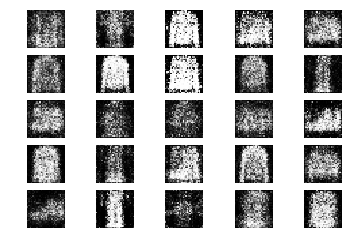

1051 [D loss: 0.624162, acc.: 67.19%] [G loss: 1.037742]
1052 [D loss: 0.614274, acc.: 70.31%] [G loss: 1.025889]
1053 [D loss: 0.570125, acc.: 71.88%] [G loss: 1.021907]
1054 [D loss: 0.604336, acc.: 71.88%] [G loss: 1.038859]
1055 [D loss: 0.629399, acc.: 64.06%] [G loss: 1.033246]
1056 [D loss: 0.651073, acc.: 60.94%] [G loss: 0.987288]
1057 [D loss: 0.540250, acc.: 73.44%] [G loss: 0.971384]
1058 [D loss: 0.588215, acc.: 68.75%] [G loss: 0.999149]
1059 [D loss: 0.606887, acc.: 67.19%] [G loss: 1.072546]
1060 [D loss: 0.670177, acc.: 67.19%] [G loss: 0.907588]
1061 [D loss: 0.568310, acc.: 70.31%] [G loss: 0.948922]
1062 [D loss: 0.657453, acc.: 56.25%] [G loss: 0.948597]
1063 [D loss: 0.534687, acc.: 78.12%] [G loss: 0.941680]
1064 [D loss: 0.595068, acc.: 71.88%] [G loss: 0.794893]
1065 [D loss: 0.552567, acc.: 75.00%] [G loss: 0.953337]
1066 [D loss: 0.541716, acc.: 71.88%] [G loss: 0.977653]
1067 [D loss: 0.654072, acc.: 67.19%] [G loss: 1.039838]
1068 [D loss: 0.628600, acc.: 7

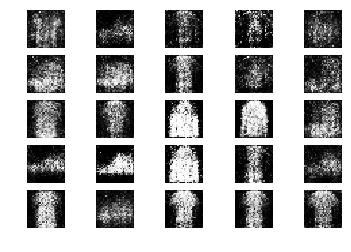

1101 [D loss: 0.658017, acc.: 56.25%] [G loss: 0.994152]
1102 [D loss: 0.574355, acc.: 71.88%] [G loss: 0.921628]
1103 [D loss: 0.623214, acc.: 65.62%] [G loss: 0.985533]
1104 [D loss: 0.689325, acc.: 51.56%] [G loss: 0.996701]
1105 [D loss: 0.539465, acc.: 75.00%] [G loss: 0.948573]
1106 [D loss: 0.662073, acc.: 62.50%] [G loss: 1.011896]
1107 [D loss: 0.631834, acc.: 53.12%] [G loss: 0.998528]
1108 [D loss: 0.573871, acc.: 67.19%] [G loss: 0.965979]
1109 [D loss: 0.639153, acc.: 67.19%] [G loss: 0.926953]
1110 [D loss: 0.610994, acc.: 65.62%] [G loss: 1.003519]
1111 [D loss: 0.615184, acc.: 67.19%] [G loss: 0.968496]
1112 [D loss: 0.659162, acc.: 53.12%] [G loss: 0.961395]
1113 [D loss: 0.640418, acc.: 57.81%] [G loss: 1.016637]
1114 [D loss: 0.658223, acc.: 53.12%] [G loss: 0.966222]
1115 [D loss: 0.590954, acc.: 75.00%] [G loss: 0.994180]
1116 [D loss: 0.637678, acc.: 65.62%] [G loss: 0.980706]
1117 [D loss: 0.572363, acc.: 71.88%] [G loss: 0.982401]
1118 [D loss: 0.520552, acc.: 8

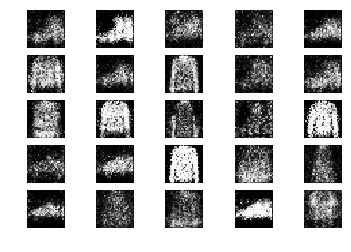

1151 [D loss: 0.638939, acc.: 62.50%] [G loss: 0.921690]
1152 [D loss: 0.613686, acc.: 64.06%] [G loss: 0.908391]
1153 [D loss: 0.601433, acc.: 68.75%] [G loss: 0.844277]
1154 [D loss: 0.560966, acc.: 75.00%] [G loss: 1.012033]
1155 [D loss: 0.551486, acc.: 68.75%] [G loss: 0.976135]
1156 [D loss: 0.689497, acc.: 54.69%] [G loss: 0.933803]
1157 [D loss: 0.653806, acc.: 57.81%] [G loss: 1.027534]
1158 [D loss: 0.588804, acc.: 68.75%] [G loss: 1.071792]
1159 [D loss: 0.619993, acc.: 60.94%] [G loss: 1.032332]
1160 [D loss: 0.620915, acc.: 68.75%] [G loss: 0.954967]
1161 [D loss: 0.630118, acc.: 60.94%] [G loss: 1.032289]
1162 [D loss: 0.639117, acc.: 60.94%] [G loss: 1.040929]
1163 [D loss: 0.645110, acc.: 67.19%] [G loss: 0.898067]
1164 [D loss: 0.606776, acc.: 67.19%] [G loss: 0.873204]
1165 [D loss: 0.696691, acc.: 57.81%] [G loss: 0.989279]
1166 [D loss: 0.626790, acc.: 68.75%] [G loss: 0.916944]
1167 [D loss: 0.598595, acc.: 70.31%] [G loss: 0.903562]
1168 [D loss: 0.589006, acc.: 7

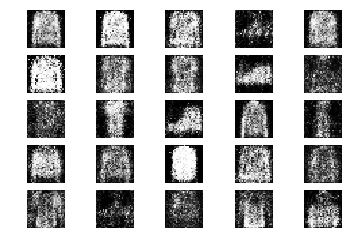

1201 [D loss: 0.655175, acc.: 60.94%] [G loss: 0.873467]
1202 [D loss: 0.586308, acc.: 68.75%] [G loss: 0.904668]
1203 [D loss: 0.623477, acc.: 64.06%] [G loss: 0.861322]
1204 [D loss: 0.637242, acc.: 67.19%] [G loss: 0.991789]
1205 [D loss: 0.568618, acc.: 75.00%] [G loss: 0.973864]
1206 [D loss: 0.661692, acc.: 53.12%] [G loss: 0.984562]
1207 [D loss: 0.549131, acc.: 71.88%] [G loss: 0.918892]
1208 [D loss: 0.621631, acc.: 67.19%] [G loss: 0.935003]
1209 [D loss: 0.647838, acc.: 65.62%] [G loss: 0.860014]
1210 [D loss: 0.571608, acc.: 70.31%] [G loss: 0.907134]
1211 [D loss: 0.636661, acc.: 62.50%] [G loss: 0.881018]
1212 [D loss: 0.568475, acc.: 70.31%] [G loss: 0.929174]
1213 [D loss: 0.611751, acc.: 67.19%] [G loss: 0.949156]
1214 [D loss: 0.638607, acc.: 62.50%] [G loss: 0.977422]
1215 [D loss: 0.579833, acc.: 71.88%] [G loss: 0.982156]
1216 [D loss: 0.590991, acc.: 71.88%] [G loss: 1.012561]
1217 [D loss: 0.614027, acc.: 70.31%] [G loss: 0.925467]
1218 [D loss: 0.583426, acc.: 6

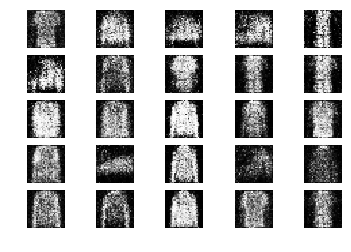

1251 [D loss: 0.593922, acc.: 67.19%] [G loss: 0.968998]
1252 [D loss: 0.562255, acc.: 73.44%] [G loss: 0.992755]
1253 [D loss: 0.582065, acc.: 73.44%] [G loss: 1.074857]
1254 [D loss: 0.686546, acc.: 60.94%] [G loss: 1.110270]
1255 [D loss: 0.685139, acc.: 62.50%] [G loss: 1.046498]
1256 [D loss: 0.590927, acc.: 64.06%] [G loss: 1.112012]
1257 [D loss: 0.651365, acc.: 59.38%] [G loss: 1.022461]
1258 [D loss: 0.644613, acc.: 71.88%] [G loss: 0.969952]
1259 [D loss: 0.602859, acc.: 64.06%] [G loss: 0.908097]
1260 [D loss: 0.586692, acc.: 65.62%] [G loss: 0.934268]
1261 [D loss: 0.599923, acc.: 65.62%] [G loss: 0.851803]
1262 [D loss: 0.669982, acc.: 59.38%] [G loss: 0.846028]
1263 [D loss: 0.650296, acc.: 65.62%] [G loss: 0.929299]
1264 [D loss: 0.563739, acc.: 71.88%] [G loss: 0.826664]
1265 [D loss: 0.606545, acc.: 70.31%] [G loss: 0.895034]
1266 [D loss: 0.606960, acc.: 67.19%] [G loss: 0.891639]
1267 [D loss: 0.593155, acc.: 65.62%] [G loss: 0.882756]
1268 [D loss: 0.662315, acc.: 5

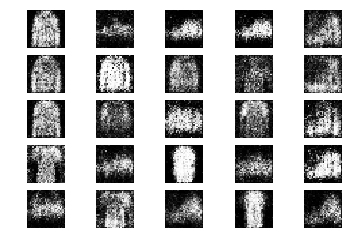

1301 [D loss: 0.614679, acc.: 70.31%] [G loss: 0.998942]
1302 [D loss: 0.598420, acc.: 70.31%] [G loss: 1.015543]
1303 [D loss: 0.588760, acc.: 71.88%] [G loss: 0.870880]
1304 [D loss: 0.635502, acc.: 59.38%] [G loss: 0.796126]
1305 [D loss: 0.599076, acc.: 64.06%] [G loss: 0.929514]
1306 [D loss: 0.609351, acc.: 67.19%] [G loss: 0.924648]
1307 [D loss: 0.619773, acc.: 67.19%] [G loss: 1.040096]
1308 [D loss: 0.622672, acc.: 67.19%] [G loss: 0.954127]
1309 [D loss: 0.654840, acc.: 62.50%] [G loss: 0.903859]
1310 [D loss: 0.619499, acc.: 67.19%] [G loss: 0.857223]
1311 [D loss: 0.606170, acc.: 68.75%] [G loss: 0.872863]
1312 [D loss: 0.519997, acc.: 78.12%] [G loss: 0.904032]
1313 [D loss: 0.623662, acc.: 60.94%] [G loss: 0.903547]
1314 [D loss: 0.686136, acc.: 62.50%] [G loss: 1.016042]
1315 [D loss: 0.620177, acc.: 67.19%] [G loss: 0.952026]
1316 [D loss: 0.680999, acc.: 53.12%] [G loss: 0.980680]
1317 [D loss: 0.585852, acc.: 73.44%] [G loss: 1.051666]
1318 [D loss: 0.625900, acc.: 7

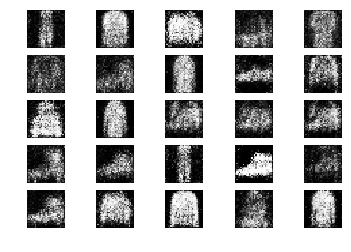

1351 [D loss: 0.580976, acc.: 75.00%] [G loss: 1.059173]
1352 [D loss: 0.597998, acc.: 67.19%] [G loss: 0.921924]
1353 [D loss: 0.575273, acc.: 75.00%] [G loss: 0.888329]
1354 [D loss: 0.552513, acc.: 75.00%] [G loss: 0.934945]
1355 [D loss: 0.595685, acc.: 67.19%] [G loss: 0.867866]
1356 [D loss: 0.632976, acc.: 62.50%] [G loss: 0.887552]
1357 [D loss: 0.639981, acc.: 67.19%] [G loss: 0.854035]
1358 [D loss: 0.581300, acc.: 73.44%] [G loss: 0.945717]
1359 [D loss: 0.582792, acc.: 70.31%] [G loss: 0.939307]
1360 [D loss: 0.629327, acc.: 60.94%] [G loss: 0.873587]
1361 [D loss: 0.701461, acc.: 54.69%] [G loss: 0.936438]
1362 [D loss: 0.614039, acc.: 64.06%] [G loss: 0.911194]
1363 [D loss: 0.641512, acc.: 59.38%] [G loss: 1.036124]
1364 [D loss: 0.618133, acc.: 59.38%] [G loss: 0.914650]
1365 [D loss: 0.592560, acc.: 68.75%] [G loss: 0.966616]
1366 [D loss: 0.626496, acc.: 64.06%] [G loss: 0.968164]
1367 [D loss: 0.587795, acc.: 67.19%] [G loss: 0.900340]
1368 [D loss: 0.592863, acc.: 7

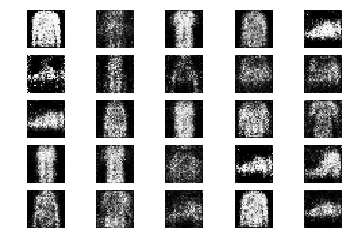

1401 [D loss: 0.586644, acc.: 71.88%] [G loss: 0.946773]
1402 [D loss: 0.619524, acc.: 64.06%] [G loss: 0.861563]
1403 [D loss: 0.566589, acc.: 71.88%] [G loss: 1.025105]
1404 [D loss: 0.615090, acc.: 71.88%] [G loss: 0.948949]
1405 [D loss: 0.636536, acc.: 65.62%] [G loss: 0.929603]
1406 [D loss: 0.575089, acc.: 78.12%] [G loss: 0.836155]
1407 [D loss: 0.616422, acc.: 67.19%] [G loss: 0.911790]
1408 [D loss: 0.638751, acc.: 68.75%] [G loss: 0.985624]
1409 [D loss: 0.637867, acc.: 62.50%] [G loss: 0.962927]
1410 [D loss: 0.660619, acc.: 57.81%] [G loss: 0.992071]
1411 [D loss: 0.611781, acc.: 65.62%] [G loss: 0.988097]
1412 [D loss: 0.608563, acc.: 60.94%] [G loss: 0.870935]
1413 [D loss: 0.598706, acc.: 67.19%] [G loss: 0.870880]
1414 [D loss: 0.646956, acc.: 65.62%] [G loss: 1.027781]
1415 [D loss: 0.590222, acc.: 68.75%] [G loss: 0.942002]
1416 [D loss: 0.573441, acc.: 70.31%] [G loss: 0.975131]
1417 [D loss: 0.558176, acc.: 76.56%] [G loss: 0.989173]
1418 [D loss: 0.633047, acc.: 7

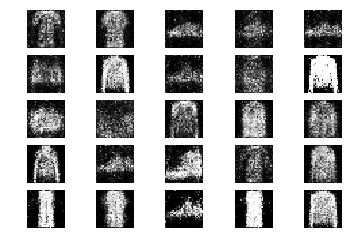

1451 [D loss: 0.611154, acc.: 67.19%] [G loss: 1.015829]
1452 [D loss: 0.599612, acc.: 75.00%] [G loss: 0.972427]
1453 [D loss: 0.628282, acc.: 65.62%] [G loss: 0.921982]
1454 [D loss: 0.609930, acc.: 59.38%] [G loss: 1.019508]
1455 [D loss: 0.584607, acc.: 71.88%] [G loss: 0.911224]
1456 [D loss: 0.683531, acc.: 60.94%] [G loss: 0.975053]
1457 [D loss: 0.641957, acc.: 62.50%] [G loss: 0.955286]
1458 [D loss: 0.684097, acc.: 56.25%] [G loss: 0.960227]
1459 [D loss: 0.612106, acc.: 75.00%] [G loss: 0.888576]
1460 [D loss: 0.602662, acc.: 65.62%] [G loss: 0.874709]
1461 [D loss: 0.652425, acc.: 57.81%] [G loss: 0.882123]
1462 [D loss: 0.612206, acc.: 60.94%] [G loss: 0.942944]
1463 [D loss: 0.624425, acc.: 67.19%] [G loss: 0.854558]
1464 [D loss: 0.616842, acc.: 65.62%] [G loss: 0.920631]
1465 [D loss: 0.634048, acc.: 64.06%] [G loss: 0.938545]
1466 [D loss: 0.581904, acc.: 70.31%] [G loss: 1.040289]
1467 [D loss: 0.651546, acc.: 64.06%] [G loss: 0.885944]
1468 [D loss: 0.608435, acc.: 5

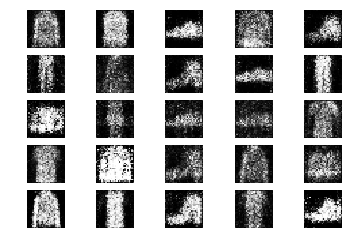

1501 [D loss: 0.599972, acc.: 64.06%] [G loss: 0.930208]
1502 [D loss: 0.642760, acc.: 62.50%] [G loss: 0.910282]
1503 [D loss: 0.621943, acc.: 64.06%] [G loss: 0.871038]
1504 [D loss: 0.592887, acc.: 64.06%] [G loss: 1.010212]
1505 [D loss: 0.604731, acc.: 65.62%] [G loss: 0.982691]
1506 [D loss: 0.589698, acc.: 68.75%] [G loss: 0.960457]
1507 [D loss: 0.609899, acc.: 67.19%] [G loss: 0.850343]
1508 [D loss: 0.627136, acc.: 67.19%] [G loss: 0.862331]
1509 [D loss: 0.672470, acc.: 62.50%] [G loss: 0.993547]
1510 [D loss: 0.629553, acc.: 64.06%] [G loss: 0.951321]
1511 [D loss: 0.601178, acc.: 67.19%] [G loss: 0.913149]
1512 [D loss: 0.640311, acc.: 62.50%] [G loss: 0.941879]
1513 [D loss: 0.603843, acc.: 71.88%] [G loss: 0.897427]
1514 [D loss: 0.663981, acc.: 64.06%] [G loss: 0.832892]
1515 [D loss: 0.597290, acc.: 65.62%] [G loss: 0.980835]
1516 [D loss: 0.566118, acc.: 67.19%] [G loss: 0.954939]
1517 [D loss: 0.696028, acc.: 57.81%] [G loss: 0.859370]
1518 [D loss: 0.595626, acc.: 7

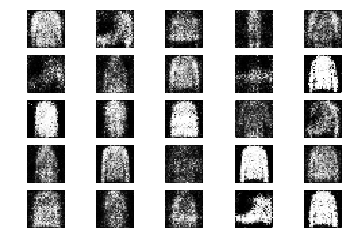

1551 [D loss: 0.617168, acc.: 62.50%] [G loss: 0.992200]
1552 [D loss: 0.646023, acc.: 65.62%] [G loss: 0.932426]
1553 [D loss: 0.597317, acc.: 70.31%] [G loss: 0.865608]
1554 [D loss: 0.623572, acc.: 62.50%] [G loss: 0.861221]
1555 [D loss: 0.617757, acc.: 68.75%] [G loss: 0.929731]
1556 [D loss: 0.646664, acc.: 57.81%] [G loss: 0.899048]
1557 [D loss: 0.571049, acc.: 70.31%] [G loss: 0.932757]
1558 [D loss: 0.587435, acc.: 68.75%] [G loss: 1.033021]
1559 [D loss: 0.616418, acc.: 64.06%] [G loss: 0.931505]
1560 [D loss: 0.634428, acc.: 60.94%] [G loss: 0.948425]
1561 [D loss: 0.571983, acc.: 70.31%] [G loss: 1.011855]
1562 [D loss: 0.613706, acc.: 67.19%] [G loss: 0.960950]
1563 [D loss: 0.615664, acc.: 65.62%] [G loss: 0.981004]
1564 [D loss: 0.688060, acc.: 59.38%] [G loss: 0.895902]
1565 [D loss: 0.610309, acc.: 60.94%] [G loss: 0.950278]
1566 [D loss: 0.612123, acc.: 78.12%] [G loss: 0.983931]
1567 [D loss: 0.569473, acc.: 73.44%] [G loss: 1.024972]
1568 [D loss: 0.620230, acc.: 6

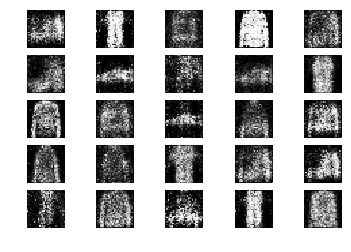

1601 [D loss: 0.627686, acc.: 64.06%] [G loss: 0.908664]
1602 [D loss: 0.593463, acc.: 75.00%] [G loss: 1.039975]
1603 [D loss: 0.512726, acc.: 81.25%] [G loss: 0.925920]
1604 [D loss: 0.602152, acc.: 64.06%] [G loss: 1.032097]
1605 [D loss: 0.668985, acc.: 50.00%] [G loss: 0.887917]
1606 [D loss: 0.596076, acc.: 70.31%] [G loss: 0.802342]
1607 [D loss: 0.612463, acc.: 67.19%] [G loss: 0.935420]
1608 [D loss: 0.578160, acc.: 73.44%] [G loss: 0.945792]
1609 [D loss: 0.539114, acc.: 73.44%] [G loss: 0.891847]
1610 [D loss: 0.627704, acc.: 71.88%] [G loss: 1.038364]
1611 [D loss: 0.561707, acc.: 68.75%] [G loss: 1.041293]
1612 [D loss: 0.637233, acc.: 60.94%] [G loss: 0.988502]
1613 [D loss: 0.603855, acc.: 68.75%] [G loss: 1.045576]
1614 [D loss: 0.600552, acc.: 67.19%] [G loss: 0.949966]
1615 [D loss: 0.673915, acc.: 54.69%] [G loss: 0.949417]
1616 [D loss: 0.619628, acc.: 64.06%] [G loss: 0.860154]
1617 [D loss: 0.692368, acc.: 53.12%] [G loss: 0.904749]
1618 [D loss: 0.579059, acc.: 7

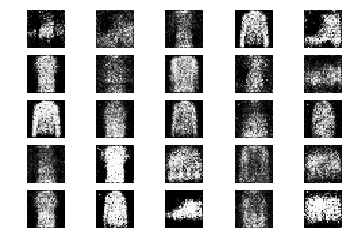

1651 [D loss: 0.602293, acc.: 71.88%] [G loss: 0.815820]
1652 [D loss: 0.672425, acc.: 57.81%] [G loss: 0.864420]
1653 [D loss: 0.623453, acc.: 65.62%] [G loss: 0.919254]
1654 [D loss: 0.613193, acc.: 64.06%] [G loss: 0.979762]
1655 [D loss: 0.602300, acc.: 67.19%] [G loss: 0.904505]
1656 [D loss: 0.662625, acc.: 54.69%] [G loss: 0.936092]
1657 [D loss: 0.587394, acc.: 73.44%] [G loss: 0.900733]
1658 [D loss: 0.658804, acc.: 62.50%] [G loss: 0.886551]
1659 [D loss: 0.619651, acc.: 60.94%] [G loss: 0.958925]
1660 [D loss: 0.546887, acc.: 68.75%] [G loss: 1.074523]
1661 [D loss: 0.586668, acc.: 78.12%] [G loss: 1.009980]
1662 [D loss: 0.619192, acc.: 65.62%] [G loss: 0.929925]
1663 [D loss: 0.576152, acc.: 73.44%] [G loss: 0.947280]
1664 [D loss: 0.611227, acc.: 62.50%] [G loss: 0.936121]
1665 [D loss: 0.641131, acc.: 59.38%] [G loss: 0.845978]
1666 [D loss: 0.590624, acc.: 67.19%] [G loss: 0.887759]
1667 [D loss: 0.607085, acc.: 64.06%] [G loss: 0.920837]
1668 [D loss: 0.687939, acc.: 5

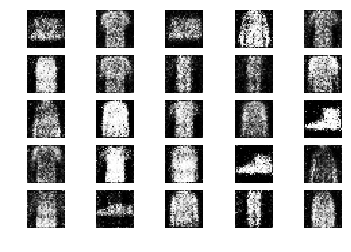

1701 [D loss: 0.523619, acc.: 75.00%] [G loss: 1.061110]
1702 [D loss: 0.553770, acc.: 73.44%] [G loss: 0.973845]
1703 [D loss: 0.626266, acc.: 62.50%] [G loss: 0.974154]
1704 [D loss: 0.679379, acc.: 51.56%] [G loss: 0.829216]
1705 [D loss: 0.502657, acc.: 73.44%] [G loss: 0.944526]
1706 [D loss: 0.635455, acc.: 64.06%] [G loss: 0.948781]
1707 [D loss: 0.598443, acc.: 67.19%] [G loss: 0.956085]
1708 [D loss: 0.608173, acc.: 71.88%] [G loss: 1.077902]
1709 [D loss: 0.599290, acc.: 71.88%] [G loss: 0.977446]
1710 [D loss: 0.638575, acc.: 65.62%] [G loss: 0.855329]
1711 [D loss: 0.597149, acc.: 64.06%] [G loss: 0.872458]
1712 [D loss: 0.583460, acc.: 65.62%] [G loss: 0.944466]
1713 [D loss: 0.542402, acc.: 75.00%] [G loss: 0.831169]
1714 [D loss: 0.581703, acc.: 67.19%] [G loss: 0.889791]
1715 [D loss: 0.575616, acc.: 67.19%] [G loss: 0.900168]
1716 [D loss: 0.598010, acc.: 62.50%] [G loss: 1.025108]
1717 [D loss: 0.662081, acc.: 62.50%] [G loss: 0.993864]
1718 [D loss: 0.639615, acc.: 6

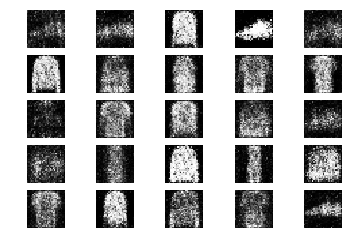

1751 [D loss: 0.607801, acc.: 64.06%] [G loss: 0.986564]
1752 [D loss: 0.634076, acc.: 64.06%] [G loss: 0.903150]
1753 [D loss: 0.634619, acc.: 64.06%] [G loss: 0.896093]
1754 [D loss: 0.639698, acc.: 71.88%] [G loss: 0.910166]
1755 [D loss: 0.614483, acc.: 65.62%] [G loss: 0.943011]
1756 [D loss: 0.561744, acc.: 75.00%] [G loss: 0.827837]
1757 [D loss: 0.623196, acc.: 56.25%] [G loss: 0.941957]
1758 [D loss: 0.617479, acc.: 59.38%] [G loss: 0.843795]
1759 [D loss: 0.559292, acc.: 71.88%] [G loss: 0.928323]
1760 [D loss: 0.593629, acc.: 71.88%] [G loss: 1.018267]
1761 [D loss: 0.697134, acc.: 51.56%] [G loss: 0.999654]
1762 [D loss: 0.562994, acc.: 76.56%] [G loss: 1.138532]
1763 [D loss: 0.643798, acc.: 64.06%] [G loss: 1.090419]
1764 [D loss: 0.663735, acc.: 50.00%] [G loss: 1.002860]
1765 [D loss: 0.567807, acc.: 70.31%] [G loss: 1.016093]
1766 [D loss: 0.601275, acc.: 62.50%] [G loss: 1.120134]
1767 [D loss: 0.612106, acc.: 59.38%] [G loss: 0.916715]
1768 [D loss: 0.586456, acc.: 7

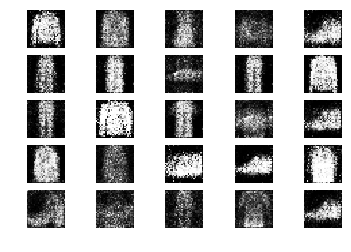

1801 [D loss: 0.638033, acc.: 65.62%] [G loss: 0.882899]
1802 [D loss: 0.609903, acc.: 60.94%] [G loss: 0.928862]
1803 [D loss: 0.574216, acc.: 64.06%] [G loss: 0.965714]
1804 [D loss: 0.585279, acc.: 70.31%] [G loss: 1.185246]
1805 [D loss: 0.568912, acc.: 70.31%] [G loss: 1.094892]
1806 [D loss: 0.645426, acc.: 68.75%] [G loss: 1.128319]
1807 [D loss: 0.686152, acc.: 59.38%] [G loss: 0.958645]
1808 [D loss: 0.571638, acc.: 78.12%] [G loss: 1.018927]
1809 [D loss: 0.619473, acc.: 64.06%] [G loss: 0.957339]
1810 [D loss: 0.594429, acc.: 65.62%] [G loss: 1.026133]
1811 [D loss: 0.590244, acc.: 75.00%] [G loss: 1.022576]
1812 [D loss: 0.579322, acc.: 75.00%] [G loss: 0.890156]
1813 [D loss: 0.610786, acc.: 67.19%] [G loss: 0.939031]
1814 [D loss: 0.650603, acc.: 54.69%] [G loss: 0.978482]
1815 [D loss: 0.606484, acc.: 71.88%] [G loss: 0.927219]
1816 [D loss: 0.505024, acc.: 90.62%] [G loss: 0.954597]
1817 [D loss: 0.580670, acc.: 65.62%] [G loss: 0.890240]
1818 [D loss: 0.534584, acc.: 7

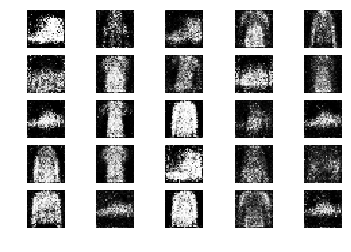

1851 [D loss: 0.612798, acc.: 70.31%] [G loss: 0.970264]
1852 [D loss: 0.622570, acc.: 65.62%] [G loss: 0.953110]
1853 [D loss: 0.631985, acc.: 64.06%] [G loss: 0.895170]
1854 [D loss: 0.585618, acc.: 70.31%] [G loss: 0.926452]
1855 [D loss: 0.645271, acc.: 65.62%] [G loss: 0.896009]
1856 [D loss: 0.575440, acc.: 68.75%] [G loss: 0.908807]
1857 [D loss: 0.708455, acc.: 53.12%] [G loss: 0.917349]
1858 [D loss: 0.600980, acc.: 68.75%] [G loss: 0.841735]
1859 [D loss: 0.639487, acc.: 57.81%] [G loss: 1.001163]
1860 [D loss: 0.572458, acc.: 68.75%] [G loss: 1.013144]
1861 [D loss: 0.565821, acc.: 75.00%] [G loss: 0.845698]
1862 [D loss: 0.508332, acc.: 73.44%] [G loss: 0.949853]
1863 [D loss: 0.565144, acc.: 68.75%] [G loss: 0.899053]
1864 [D loss: 0.484798, acc.: 81.25%] [G loss: 0.857863]
1865 [D loss: 0.613037, acc.: 65.62%] [G loss: 0.875426]
1866 [D loss: 0.580785, acc.: 70.31%] [G loss: 0.921710]
1867 [D loss: 0.609130, acc.: 67.19%] [G loss: 1.086972]
1868 [D loss: 0.539881, acc.: 7

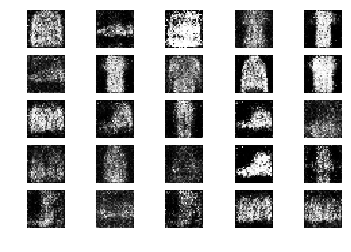

1901 [D loss: 0.617907, acc.: 62.50%] [G loss: 0.916796]
1902 [D loss: 0.537901, acc.: 76.56%] [G loss: 0.996847]
1903 [D loss: 0.537300, acc.: 73.44%] [G loss: 1.011185]
1904 [D loss: 0.552029, acc.: 71.88%] [G loss: 1.072231]
1905 [D loss: 0.579201, acc.: 70.31%] [G loss: 0.948633]
1906 [D loss: 0.641199, acc.: 65.62%] [G loss: 0.981479]
1907 [D loss: 0.548280, acc.: 81.25%] [G loss: 0.992901]
1908 [D loss: 0.514867, acc.: 75.00%] [G loss: 1.088322]
1909 [D loss: 0.600557, acc.: 67.19%] [G loss: 0.953551]
1910 [D loss: 0.579177, acc.: 68.75%] [G loss: 0.969857]
1911 [D loss: 0.575393, acc.: 67.19%] [G loss: 1.060329]
1912 [D loss: 0.617394, acc.: 67.19%] [G loss: 1.028158]
1913 [D loss: 0.548013, acc.: 79.69%] [G loss: 1.016154]
1914 [D loss: 0.705164, acc.: 59.38%] [G loss: 1.027636]
1915 [D loss: 0.617040, acc.: 65.62%] [G loss: 0.979494]
1916 [D loss: 0.589129, acc.: 70.31%] [G loss: 1.010777]
1917 [D loss: 0.574545, acc.: 71.88%] [G loss: 1.064570]
1918 [D loss: 0.659936, acc.: 5

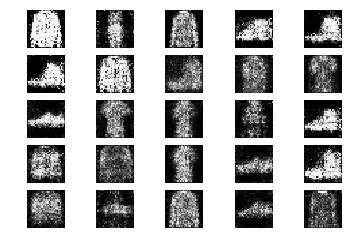

1951 [D loss: 0.648560, acc.: 62.50%] [G loss: 0.953210]
1952 [D loss: 0.593143, acc.: 64.06%] [G loss: 0.895068]
1953 [D loss: 0.634112, acc.: 57.81%] [G loss: 1.143407]
1954 [D loss: 0.610672, acc.: 71.88%] [G loss: 1.106842]
1955 [D loss: 0.579628, acc.: 67.19%] [G loss: 0.946031]
1956 [D loss: 0.578460, acc.: 70.31%] [G loss: 1.012806]
1957 [D loss: 0.568315, acc.: 73.44%] [G loss: 1.043899]
1958 [D loss: 0.721176, acc.: 50.00%] [G loss: 0.918615]
1959 [D loss: 0.691601, acc.: 56.25%] [G loss: 0.891255]
1960 [D loss: 0.560143, acc.: 70.31%] [G loss: 1.074231]
1961 [D loss: 0.578029, acc.: 71.88%] [G loss: 1.031484]
1962 [D loss: 0.600111, acc.: 68.75%] [G loss: 0.931160]
1963 [D loss: 0.646707, acc.: 56.25%] [G loss: 0.971730]
1964 [D loss: 0.602450, acc.: 67.19%] [G loss: 1.046690]
1965 [D loss: 0.576543, acc.: 71.88%] [G loss: 1.026348]
1966 [D loss: 0.640218, acc.: 65.62%] [G loss: 0.954776]
1967 [D loss: 0.581389, acc.: 71.88%] [G loss: 0.938640]
1968 [D loss: 0.659696, acc.: 5

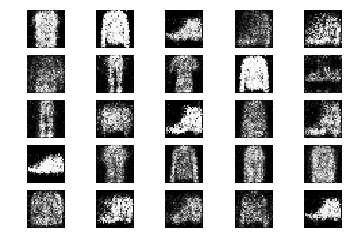

2001 [D loss: 0.534265, acc.: 76.56%] [G loss: 0.941905]
2002 [D loss: 0.653104, acc.: 64.06%] [G loss: 0.840034]
2003 [D loss: 0.548290, acc.: 71.88%] [G loss: 0.927711]
2004 [D loss: 0.663509, acc.: 56.25%] [G loss: 0.852885]
2005 [D loss: 0.559738, acc.: 71.88%] [G loss: 0.922453]
2006 [D loss: 0.679945, acc.: 57.81%] [G loss: 0.958327]
2007 [D loss: 0.662589, acc.: 65.62%] [G loss: 0.966273]
2008 [D loss: 0.590746, acc.: 67.19%] [G loss: 0.890595]
2009 [D loss: 0.668534, acc.: 67.19%] [G loss: 0.892233]
2010 [D loss: 0.677388, acc.: 56.25%] [G loss: 1.017115]
2011 [D loss: 0.640019, acc.: 59.38%] [G loss: 0.925904]
2012 [D loss: 0.571061, acc.: 78.12%] [G loss: 1.098209]
2013 [D loss: 0.621120, acc.: 65.62%] [G loss: 1.037293]
2014 [D loss: 0.597074, acc.: 68.75%] [G loss: 0.999045]
2015 [D loss: 0.628588, acc.: 68.75%] [G loss: 0.890622]
2016 [D loss: 0.613917, acc.: 65.62%] [G loss: 0.830969]
2017 [D loss: 0.663853, acc.: 64.06%] [G loss: 0.939437]
2018 [D loss: 0.530297, acc.: 7

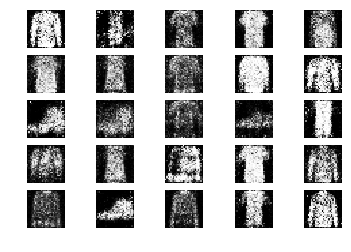

2051 [D loss: 0.520748, acc.: 81.25%] [G loss: 1.177050]
2052 [D loss: 0.687600, acc.: 56.25%] [G loss: 1.177725]
2053 [D loss: 0.674995, acc.: 56.25%] [G loss: 1.172513]
2054 [D loss: 0.688681, acc.: 59.38%] [G loss: 0.988842]
2055 [D loss: 0.543844, acc.: 78.12%] [G loss: 1.012703]
2056 [D loss: 0.574045, acc.: 70.31%] [G loss: 1.141290]
2057 [D loss: 0.534808, acc.: 78.12%] [G loss: 1.004004]
2058 [D loss: 0.609746, acc.: 64.06%] [G loss: 0.989771]
2059 [D loss: 0.550776, acc.: 70.31%] [G loss: 1.047992]
2060 [D loss: 0.566564, acc.: 71.88%] [G loss: 1.043791]
2061 [D loss: 0.547663, acc.: 67.19%] [G loss: 1.000570]
2062 [D loss: 0.677274, acc.: 59.38%] [G loss: 1.047206]
2063 [D loss: 0.603216, acc.: 64.06%] [G loss: 0.944962]
2064 [D loss: 0.567415, acc.: 68.75%] [G loss: 1.072283]
2065 [D loss: 0.594462, acc.: 68.75%] [G loss: 0.909801]
2066 [D loss: 0.705926, acc.: 54.69%] [G loss: 0.939964]
2067 [D loss: 0.656719, acc.: 54.69%] [G loss: 1.096751]
2068 [D loss: 0.604220, acc.: 6

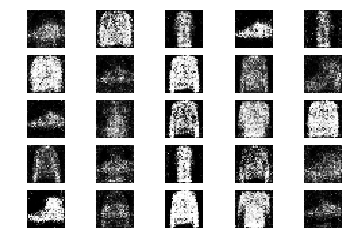

2101 [D loss: 0.569637, acc.: 68.75%] [G loss: 1.009510]
2102 [D loss: 0.629161, acc.: 59.38%] [G loss: 0.985387]
2103 [D loss: 0.576972, acc.: 68.75%] [G loss: 0.984818]
2104 [D loss: 0.647765, acc.: 57.81%] [G loss: 0.898359]
2105 [D loss: 0.536135, acc.: 79.69%] [G loss: 1.039538]
2106 [D loss: 0.555818, acc.: 70.31%] [G loss: 1.171998]
2107 [D loss: 0.523686, acc.: 81.25%] [G loss: 1.086088]
2108 [D loss: 0.584473, acc.: 65.62%] [G loss: 1.151324]
2109 [D loss: 0.641489, acc.: 57.81%] [G loss: 1.049992]
2110 [D loss: 0.573704, acc.: 71.88%] [G loss: 0.913009]
2111 [D loss: 0.667566, acc.: 60.94%] [G loss: 0.928742]
2112 [D loss: 0.584992, acc.: 65.62%] [G loss: 0.850947]
2113 [D loss: 0.553552, acc.: 71.88%] [G loss: 0.905138]
2114 [D loss: 0.633156, acc.: 65.62%] [G loss: 0.889237]
2115 [D loss: 0.607305, acc.: 68.75%] [G loss: 0.995415]
2116 [D loss: 0.513994, acc.: 79.69%] [G loss: 1.004963]
2117 [D loss: 0.640242, acc.: 64.06%] [G loss: 0.917558]
2118 [D loss: 0.603771, acc.: 6

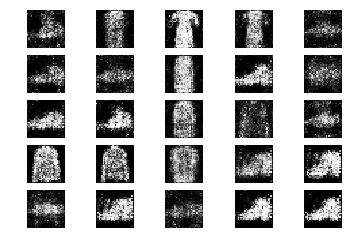

2151 [D loss: 0.623252, acc.: 68.75%] [G loss: 1.010440]
2152 [D loss: 0.667419, acc.: 57.81%] [G loss: 0.993654]
2153 [D loss: 0.593049, acc.: 68.75%] [G loss: 0.907189]
2154 [D loss: 0.590747, acc.: 67.19%] [G loss: 1.006403]
2155 [D loss: 0.595246, acc.: 68.75%] [G loss: 0.997535]
2156 [D loss: 0.551716, acc.: 81.25%] [G loss: 1.018421]
2157 [D loss: 0.624868, acc.: 70.31%] [G loss: 1.087317]
2158 [D loss: 0.589717, acc.: 64.06%] [G loss: 0.993003]
2159 [D loss: 0.583510, acc.: 78.12%] [G loss: 1.014494]
2160 [D loss: 0.545377, acc.: 73.44%] [G loss: 0.919318]
2161 [D loss: 0.637750, acc.: 62.50%] [G loss: 1.004676]
2162 [D loss: 0.628624, acc.: 62.50%] [G loss: 0.953643]
2163 [D loss: 0.747737, acc.: 46.88%] [G loss: 0.937727]
2164 [D loss: 0.585013, acc.: 70.31%] [G loss: 0.977518]
2165 [D loss: 0.608074, acc.: 67.19%] [G loss: 1.019711]
2166 [D loss: 0.586548, acc.: 70.31%] [G loss: 1.128918]
2167 [D loss: 0.591768, acc.: 71.88%] [G loss: 1.108249]
2168 [D loss: 0.546764, acc.: 7

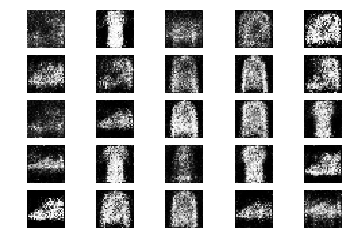

2201 [D loss: 0.615657, acc.: 65.62%] [G loss: 0.996906]
2202 [D loss: 0.642642, acc.: 70.31%] [G loss: 0.962936]
2203 [D loss: 0.556907, acc.: 70.31%] [G loss: 1.092220]
2204 [D loss: 0.549933, acc.: 78.12%] [G loss: 1.023951]
2205 [D loss: 0.620867, acc.: 60.94%] [G loss: 0.962894]
2206 [D loss: 0.627346, acc.: 65.62%] [G loss: 0.857996]
2207 [D loss: 0.606456, acc.: 62.50%] [G loss: 0.924999]
2208 [D loss: 0.673470, acc.: 57.81%] [G loss: 0.886440]
2209 [D loss: 0.583506, acc.: 64.06%] [G loss: 1.068931]
2210 [D loss: 0.591858, acc.: 67.19%] [G loss: 1.075695]
2211 [D loss: 0.658587, acc.: 62.50%] [G loss: 0.947781]
2212 [D loss: 0.581484, acc.: 73.44%] [G loss: 0.923038]
2213 [D loss: 0.573582, acc.: 73.44%] [G loss: 0.831002]
2214 [D loss: 0.604548, acc.: 57.81%] [G loss: 1.005710]
2215 [D loss: 0.674945, acc.: 54.69%] [G loss: 0.903318]
2216 [D loss: 0.581326, acc.: 65.62%] [G loss: 1.033306]
2217 [D loss: 0.618092, acc.: 73.44%] [G loss: 1.152966]
2218 [D loss: 0.475400, acc.: 7

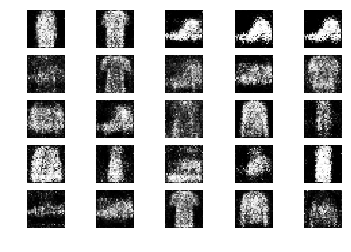

2251 [D loss: 0.612177, acc.: 67.19%] [G loss: 0.982376]
2252 [D loss: 0.621685, acc.: 65.62%] [G loss: 1.001656]
2253 [D loss: 0.811458, acc.: 51.56%] [G loss: 0.901602]
2254 [D loss: 0.539073, acc.: 68.75%] [G loss: 1.058645]
2255 [D loss: 0.635212, acc.: 62.50%] [G loss: 1.116363]
2256 [D loss: 0.627432, acc.: 67.19%] [G loss: 1.045239]
2257 [D loss: 0.591081, acc.: 68.75%] [G loss: 0.936762]
2258 [D loss: 0.598597, acc.: 65.62%] [G loss: 0.950777]
2259 [D loss: 0.600835, acc.: 68.75%] [G loss: 0.916286]
2260 [D loss: 0.617766, acc.: 62.50%] [G loss: 1.040505]
2261 [D loss: 0.647504, acc.: 64.06%] [G loss: 0.989676]
2262 [D loss: 0.616159, acc.: 64.06%] [G loss: 0.941651]
2263 [D loss: 0.608186, acc.: 68.75%] [G loss: 0.936381]
2264 [D loss: 0.624552, acc.: 65.62%] [G loss: 0.907327]
2265 [D loss: 0.620849, acc.: 70.31%] [G loss: 0.922756]
2266 [D loss: 0.588630, acc.: 71.88%] [G loss: 0.971178]
2267 [D loss: 0.623365, acc.: 62.50%] [G loss: 0.963760]
2268 [D loss: 0.620526, acc.: 6

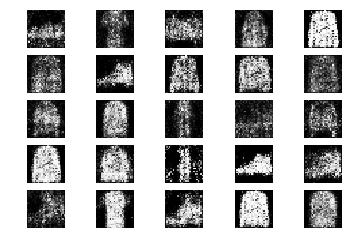

2301 [D loss: 0.594726, acc.: 65.62%] [G loss: 1.114558]
2302 [D loss: 0.616708, acc.: 68.75%] [G loss: 0.983461]
2303 [D loss: 0.607089, acc.: 71.88%] [G loss: 0.944763]
2304 [D loss: 0.702446, acc.: 51.56%] [G loss: 0.894617]
2305 [D loss: 0.578338, acc.: 71.88%] [G loss: 0.892383]
2306 [D loss: 0.705905, acc.: 54.69%] [G loss: 0.998343]
2307 [D loss: 0.655775, acc.: 56.25%] [G loss: 0.958256]
2308 [D loss: 0.556492, acc.: 67.19%] [G loss: 1.056530]
2309 [D loss: 0.596678, acc.: 65.62%] [G loss: 1.098112]
2310 [D loss: 0.558930, acc.: 68.75%] [G loss: 1.094380]
2311 [D loss: 0.647466, acc.: 59.38%] [G loss: 0.936323]
2312 [D loss: 0.633888, acc.: 71.88%] [G loss: 0.972831]
2313 [D loss: 0.629329, acc.: 71.88%] [G loss: 1.079263]
2314 [D loss: 0.557249, acc.: 73.44%] [G loss: 0.909335]
2315 [D loss: 0.546128, acc.: 79.69%] [G loss: 0.931365]
2316 [D loss: 0.612815, acc.: 67.19%] [G loss: 1.000952]
2317 [D loss: 0.593441, acc.: 65.62%] [G loss: 0.863274]
2318 [D loss: 0.637811, acc.: 5

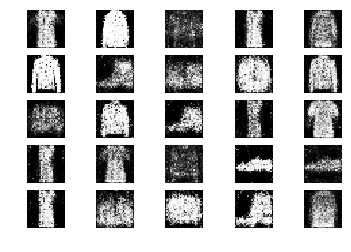

2351 [D loss: 0.611812, acc.: 64.06%] [G loss: 0.964647]
2352 [D loss: 0.529411, acc.: 78.12%] [G loss: 0.984740]
2353 [D loss: 0.631785, acc.: 64.06%] [G loss: 0.938800]
2354 [D loss: 0.621140, acc.: 62.50%] [G loss: 1.023329]
2355 [D loss: 0.609220, acc.: 62.50%] [G loss: 1.121799]
2356 [D loss: 0.616544, acc.: 65.62%] [G loss: 1.067609]
2357 [D loss: 0.587612, acc.: 68.75%] [G loss: 1.054178]
2358 [D loss: 0.586390, acc.: 65.62%] [G loss: 0.953020]
2359 [D loss: 0.591578, acc.: 67.19%] [G loss: 0.936392]
2360 [D loss: 0.596996, acc.: 70.31%] [G loss: 0.904742]
2361 [D loss: 0.642045, acc.: 67.19%] [G loss: 0.935881]
2362 [D loss: 0.600077, acc.: 64.06%] [G loss: 1.023414]
2363 [D loss: 0.626224, acc.: 67.19%] [G loss: 0.954458]
2364 [D loss: 0.610176, acc.: 56.25%] [G loss: 1.130216]
2365 [D loss: 0.578082, acc.: 71.88%] [G loss: 0.983894]
2366 [D loss: 0.489968, acc.: 82.81%] [G loss: 0.872093]
2367 [D loss: 0.648453, acc.: 60.94%] [G loss: 0.946640]
2368 [D loss: 0.519380, acc.: 7

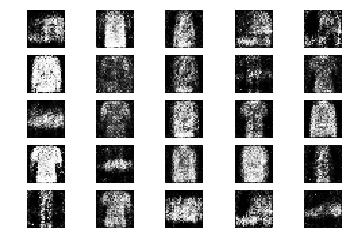

2401 [D loss: 0.584265, acc.: 70.31%] [G loss: 1.026399]
2402 [D loss: 0.676699, acc.: 67.19%] [G loss: 0.954361]
2403 [D loss: 0.674144, acc.: 51.56%] [G loss: 0.829935]
2404 [D loss: 0.608527, acc.: 71.88%] [G loss: 1.024691]
2405 [D loss: 0.757182, acc.: 48.44%] [G loss: 0.965250]
2406 [D loss: 0.592099, acc.: 62.50%] [G loss: 0.830486]
2407 [D loss: 0.562163, acc.: 70.31%] [G loss: 0.899569]
2408 [D loss: 0.553349, acc.: 71.88%] [G loss: 1.033017]
2409 [D loss: 0.617902, acc.: 64.06%] [G loss: 1.016432]
2410 [D loss: 0.679204, acc.: 60.94%] [G loss: 0.916093]
2411 [D loss: 0.629557, acc.: 65.62%] [G loss: 0.924579]
2412 [D loss: 0.614741, acc.: 67.19%] [G loss: 1.007013]
2413 [D loss: 0.654500, acc.: 60.94%] [G loss: 0.990338]
2414 [D loss: 0.610458, acc.: 64.06%] [G loss: 0.999478]
2415 [D loss: 0.634316, acc.: 64.06%] [G loss: 0.959274]
2416 [D loss: 0.605415, acc.: 59.38%] [G loss: 1.007554]
2417 [D loss: 0.598793, acc.: 71.88%] [G loss: 0.940172]
2418 [D loss: 0.574249, acc.: 6

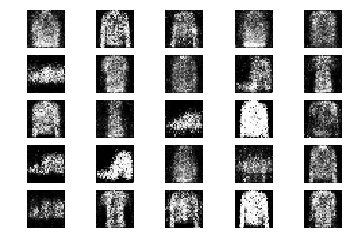

2451 [D loss: 0.668204, acc.: 65.62%] [G loss: 0.977650]
2452 [D loss: 0.617798, acc.: 67.19%] [G loss: 0.912656]
2453 [D loss: 0.675420, acc.: 60.94%] [G loss: 1.073489]
2454 [D loss: 0.630286, acc.: 68.75%] [G loss: 1.034889]
2455 [D loss: 0.525793, acc.: 78.12%] [G loss: 1.028810]
2456 [D loss: 0.626963, acc.: 64.06%] [G loss: 0.944003]
2457 [D loss: 0.632200, acc.: 60.94%] [G loss: 1.014915]
2458 [D loss: 0.619278, acc.: 64.06%] [G loss: 1.045595]
2459 [D loss: 0.552987, acc.: 68.75%] [G loss: 1.004317]
2460 [D loss: 0.629365, acc.: 62.50%] [G loss: 0.980675]
2461 [D loss: 0.632035, acc.: 62.50%] [G loss: 0.952838]
2462 [D loss: 0.563190, acc.: 68.75%] [G loss: 0.970823]
2463 [D loss: 0.580785, acc.: 70.31%] [G loss: 0.987432]
2464 [D loss: 0.587194, acc.: 70.31%] [G loss: 0.973645]
2465 [D loss: 0.568561, acc.: 70.31%] [G loss: 0.911900]
2466 [D loss: 0.643023, acc.: 60.94%] [G loss: 1.002723]
2467 [D loss: 0.564811, acc.: 71.88%] [G loss: 0.964300]
2468 [D loss: 0.632388, acc.: 6

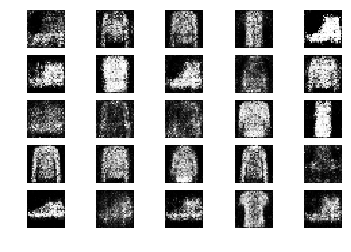

2501 [D loss: 0.591998, acc.: 71.88%] [G loss: 1.007058]
2502 [D loss: 0.596973, acc.: 67.19%] [G loss: 1.002929]
2503 [D loss: 0.593033, acc.: 64.06%] [G loss: 0.984184]
2504 [D loss: 0.579842, acc.: 71.88%] [G loss: 0.944879]
2505 [D loss: 0.598880, acc.: 68.75%] [G loss: 1.013334]
2506 [D loss: 0.569498, acc.: 70.31%] [G loss: 0.930153]
2507 [D loss: 0.526584, acc.: 75.00%] [G loss: 0.995106]
2508 [D loss: 0.665115, acc.: 60.94%] [G loss: 0.917684]
2509 [D loss: 0.711744, acc.: 51.56%] [G loss: 0.992647]
2510 [D loss: 0.602256, acc.: 62.50%] [G loss: 0.967798]
2511 [D loss: 0.695107, acc.: 60.94%] [G loss: 0.999712]
2512 [D loss: 0.559315, acc.: 71.88%] [G loss: 1.103866]
2513 [D loss: 0.591254, acc.: 73.44%] [G loss: 0.984871]
2514 [D loss: 0.587174, acc.: 64.06%] [G loss: 1.025149]
2515 [D loss: 0.594238, acc.: 71.88%] [G loss: 1.000242]
2516 [D loss: 0.549082, acc.: 65.62%] [G loss: 1.015890]
2517 [D loss: 0.625302, acc.: 70.31%] [G loss: 1.046329]
2518 [D loss: 0.619580, acc.: 6

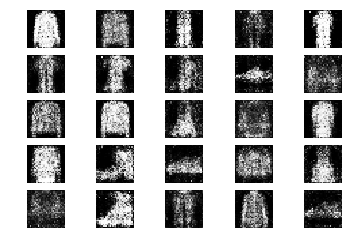

2551 [D loss: 0.599044, acc.: 67.19%] [G loss: 1.087715]
2552 [D loss: 0.588044, acc.: 73.44%] [G loss: 1.064635]
2553 [D loss: 0.550484, acc.: 70.31%] [G loss: 0.937114]
2554 [D loss: 0.619314, acc.: 67.19%] [G loss: 0.957426]
2555 [D loss: 0.552589, acc.: 75.00%] [G loss: 1.015673]
2556 [D loss: 0.626169, acc.: 62.50%] [G loss: 1.052883]
2557 [D loss: 0.533704, acc.: 71.88%] [G loss: 1.060906]
2558 [D loss: 0.701132, acc.: 53.12%] [G loss: 1.084955]
2559 [D loss: 0.633730, acc.: 62.50%] [G loss: 1.046338]
2560 [D loss: 0.646805, acc.: 59.38%] [G loss: 1.026858]
2561 [D loss: 0.592203, acc.: 60.94%] [G loss: 1.062790]
2562 [D loss: 0.582699, acc.: 67.19%] [G loss: 0.919307]
2563 [D loss: 0.577704, acc.: 64.06%] [G loss: 0.916868]
2564 [D loss: 0.587681, acc.: 68.75%] [G loss: 0.926709]
2565 [D loss: 0.605164, acc.: 73.44%] [G loss: 0.918356]
2566 [D loss: 0.592540, acc.: 65.62%] [G loss: 0.919112]
2567 [D loss: 0.652583, acc.: 62.50%] [G loss: 1.072181]
2568 [D loss: 0.544357, acc.: 7

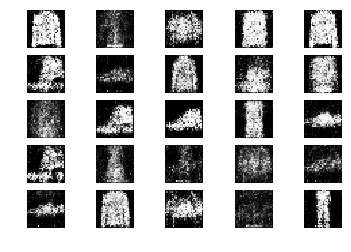

2601 [D loss: 0.588496, acc.: 70.31%] [G loss: 1.021554]
2602 [D loss: 0.678178, acc.: 54.69%] [G loss: 0.997812]
2603 [D loss: 0.588891, acc.: 57.81%] [G loss: 1.024307]
2604 [D loss: 0.673760, acc.: 62.50%] [G loss: 0.994937]
2605 [D loss: 0.598279, acc.: 71.88%] [G loss: 0.934604]
2606 [D loss: 0.597438, acc.: 68.75%] [G loss: 0.945743]
2607 [D loss: 0.567518, acc.: 67.19%] [G loss: 0.955511]
2608 [D loss: 0.673690, acc.: 57.81%] [G loss: 0.942525]
2609 [D loss: 0.632970, acc.: 57.81%] [G loss: 0.946496]
2610 [D loss: 0.611927, acc.: 59.38%] [G loss: 1.067442]
2611 [D loss: 0.589094, acc.: 65.62%] [G loss: 1.098021]
2612 [D loss: 0.596801, acc.: 75.00%] [G loss: 0.907511]
2613 [D loss: 0.598238, acc.: 68.75%] [G loss: 1.100515]
2614 [D loss: 0.597530, acc.: 60.94%] [G loss: 1.144444]
2615 [D loss: 0.557666, acc.: 71.88%] [G loss: 1.087291]
2616 [D loss: 0.705615, acc.: 51.56%] [G loss: 0.951965]
2617 [D loss: 0.605126, acc.: 62.50%] [G loss: 0.974378]
2618 [D loss: 0.647041, acc.: 5

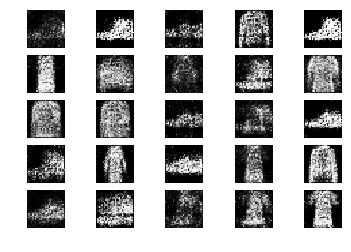

2651 [D loss: 0.616736, acc.: 67.19%] [G loss: 0.962367]
2652 [D loss: 0.605460, acc.: 70.31%] [G loss: 0.977890]
2653 [D loss: 0.652964, acc.: 64.06%] [G loss: 1.048555]
2654 [D loss: 0.589230, acc.: 71.88%] [G loss: 0.959660]
2655 [D loss: 0.628440, acc.: 59.38%] [G loss: 1.009878]
2656 [D loss: 0.592538, acc.: 65.62%] [G loss: 0.962106]
2657 [D loss: 0.655894, acc.: 60.94%] [G loss: 0.962118]
2658 [D loss: 0.628790, acc.: 54.69%] [G loss: 1.008170]
2659 [D loss: 0.624886, acc.: 64.06%] [G loss: 1.006820]
2660 [D loss: 0.663126, acc.: 57.81%] [G loss: 1.053930]
2661 [D loss: 0.649546, acc.: 59.38%] [G loss: 0.927896]
2662 [D loss: 0.638773, acc.: 65.62%] [G loss: 0.963660]
2663 [D loss: 0.658936, acc.: 57.81%] [G loss: 0.993529]
2664 [D loss: 0.674917, acc.: 64.06%] [G loss: 0.980927]
2665 [D loss: 0.548959, acc.: 76.56%] [G loss: 0.949725]
2666 [D loss: 0.563748, acc.: 75.00%] [G loss: 1.032469]
2667 [D loss: 0.609820, acc.: 68.75%] [G loss: 0.941126]
2668 [D loss: 0.614388, acc.: 6

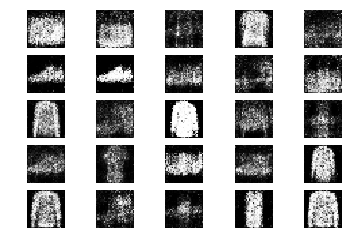

2701 [D loss: 0.551661, acc.: 79.69%] [G loss: 0.886549]
2702 [D loss: 0.672152, acc.: 57.81%] [G loss: 0.966061]
2703 [D loss: 0.662874, acc.: 60.94%] [G loss: 1.001018]
2704 [D loss: 0.669446, acc.: 56.25%] [G loss: 1.041340]
2705 [D loss: 0.596821, acc.: 64.06%] [G loss: 1.045947]
2706 [D loss: 0.623373, acc.: 68.75%] [G loss: 1.044275]
2707 [D loss: 0.630246, acc.: 64.06%] [G loss: 0.978979]
2708 [D loss: 0.702650, acc.: 60.94%] [G loss: 0.774935]
2709 [D loss: 0.620981, acc.: 60.94%] [G loss: 0.989585]
2710 [D loss: 0.653720, acc.: 62.50%] [G loss: 0.951741]
2711 [D loss: 0.609863, acc.: 70.31%] [G loss: 1.044419]
2712 [D loss: 0.720972, acc.: 56.25%] [G loss: 0.935626]
2713 [D loss: 0.551205, acc.: 64.06%] [G loss: 0.899223]
2714 [D loss: 0.623542, acc.: 71.88%] [G loss: 0.933830]
2715 [D loss: 0.654256, acc.: 57.81%] [G loss: 0.899571]
2716 [D loss: 0.575016, acc.: 73.44%] [G loss: 0.998775]
2717 [D loss: 0.670992, acc.: 62.50%] [G loss: 1.063219]
2718 [D loss: 0.597235, acc.: 6

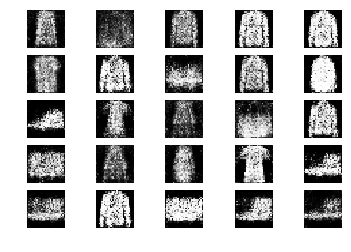

2751 [D loss: 0.577805, acc.: 68.75%] [G loss: 0.983975]
2752 [D loss: 0.643003, acc.: 64.06%] [G loss: 1.105570]
2753 [D loss: 0.625846, acc.: 60.94%] [G loss: 1.073929]
2754 [D loss: 0.619881, acc.: 65.62%] [G loss: 0.986193]
2755 [D loss: 0.698344, acc.: 57.81%] [G loss: 0.909252]
2756 [D loss: 0.694507, acc.: 46.88%] [G loss: 0.920147]
2757 [D loss: 0.619977, acc.: 65.62%] [G loss: 0.912369]
2758 [D loss: 0.603362, acc.: 64.06%] [G loss: 0.867122]
2759 [D loss: 0.587783, acc.: 70.31%] [G loss: 0.941814]
2760 [D loss: 0.648170, acc.: 64.06%] [G loss: 1.151604]
2761 [D loss: 0.676739, acc.: 60.94%] [G loss: 0.943005]
2762 [D loss: 0.633731, acc.: 62.50%] [G loss: 0.941185]
2763 [D loss: 0.558762, acc.: 68.75%] [G loss: 0.975990]
2764 [D loss: 0.622077, acc.: 64.06%] [G loss: 0.929937]
2765 [D loss: 0.631117, acc.: 62.50%] [G loss: 0.906682]
2766 [D loss: 0.713039, acc.: 46.88%] [G loss: 0.903774]
2767 [D loss: 0.528908, acc.: 73.44%] [G loss: 0.962793]
2768 [D loss: 0.602778, acc.: 7

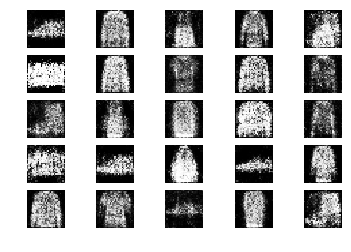

2801 [D loss: 0.606038, acc.: 65.62%] [G loss: 0.947194]
2802 [D loss: 0.558416, acc.: 70.31%] [G loss: 1.006783]
2803 [D loss: 0.601014, acc.: 65.62%] [G loss: 1.089860]
2804 [D loss: 0.665812, acc.: 57.81%] [G loss: 1.146222]
2805 [D loss: 0.558544, acc.: 75.00%] [G loss: 1.040602]
2806 [D loss: 0.574990, acc.: 73.44%] [G loss: 1.008260]
2807 [D loss: 0.607357, acc.: 65.62%] [G loss: 1.071386]
2808 [D loss: 0.600346, acc.: 67.19%] [G loss: 0.944807]
2809 [D loss: 0.659421, acc.: 65.62%] [G loss: 1.003084]
2810 [D loss: 0.694856, acc.: 62.50%] [G loss: 1.070237]
2811 [D loss: 0.617421, acc.: 67.19%] [G loss: 1.023991]
2812 [D loss: 0.683196, acc.: 59.38%] [G loss: 0.979420]
2813 [D loss: 0.623458, acc.: 71.88%] [G loss: 0.928155]
2814 [D loss: 0.619603, acc.: 71.88%] [G loss: 0.962986]
2815 [D loss: 0.605707, acc.: 67.19%] [G loss: 0.921094]
2816 [D loss: 0.599815, acc.: 75.00%] [G loss: 0.917344]
2817 [D loss: 0.634089, acc.: 65.62%] [G loss: 0.954425]
2818 [D loss: 0.646041, acc.: 5

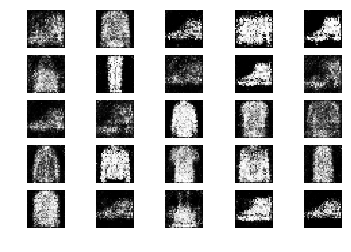

2851 [D loss: 0.554380, acc.: 75.00%] [G loss: 1.054234]
2852 [D loss: 0.680780, acc.: 59.38%] [G loss: 1.081200]
2853 [D loss: 0.640592, acc.: 68.75%] [G loss: 1.073674]
2854 [D loss: 0.662869, acc.: 56.25%] [G loss: 0.900480]
2855 [D loss: 0.540066, acc.: 71.88%] [G loss: 1.060889]
2856 [D loss: 0.690976, acc.: 60.94%] [G loss: 0.915848]
2857 [D loss: 0.580995, acc.: 73.44%] [G loss: 0.980647]
2858 [D loss: 0.603101, acc.: 71.88%] [G loss: 0.928916]
2859 [D loss: 0.634236, acc.: 62.50%] [G loss: 0.961446]
2860 [D loss: 0.590314, acc.: 68.75%] [G loss: 0.912329]
2861 [D loss: 0.663788, acc.: 59.38%] [G loss: 0.923496]
2862 [D loss: 0.603858, acc.: 73.44%] [G loss: 0.962826]
2863 [D loss: 0.652417, acc.: 56.25%] [G loss: 0.937530]
2864 [D loss: 0.622735, acc.: 67.19%] [G loss: 1.060734]
2865 [D loss: 0.639898, acc.: 67.19%] [G loss: 0.963059]
2866 [D loss: 0.584157, acc.: 71.88%] [G loss: 1.047804]
2867 [D loss: 0.665372, acc.: 57.81%] [G loss: 1.047426]
2868 [D loss: 0.723979, acc.: 6

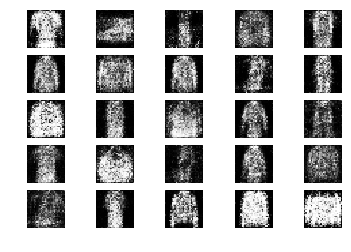

2901 [D loss: 0.668570, acc.: 64.06%] [G loss: 0.975197]
2902 [D loss: 0.573359, acc.: 71.88%] [G loss: 1.126548]
2903 [D loss: 0.643917, acc.: 57.81%] [G loss: 1.037540]
2904 [D loss: 0.572251, acc.: 73.44%] [G loss: 1.012235]
2905 [D loss: 0.655112, acc.: 62.50%] [G loss: 0.870574]
2906 [D loss: 0.699581, acc.: 54.69%] [G loss: 0.977773]
2907 [D loss: 0.627591, acc.: 65.62%] [G loss: 0.924513]
2908 [D loss: 0.622855, acc.: 62.50%] [G loss: 0.970598]
2909 [D loss: 0.630997, acc.: 64.06%] [G loss: 0.956502]
2910 [D loss: 0.582508, acc.: 70.31%] [G loss: 1.018144]
2911 [D loss: 0.572505, acc.: 70.31%] [G loss: 1.003712]
2912 [D loss: 0.583859, acc.: 68.75%] [G loss: 0.868294]
2913 [D loss: 0.613949, acc.: 60.94%] [G loss: 0.924233]
2914 [D loss: 0.582910, acc.: 71.88%] [G loss: 0.986695]
2915 [D loss: 0.618503, acc.: 67.19%] [G loss: 1.086561]
2916 [D loss: 0.603266, acc.: 64.06%] [G loss: 0.912162]
2917 [D loss: 0.568746, acc.: 73.44%] [G loss: 0.893867]
2918 [D loss: 0.549754, acc.: 6

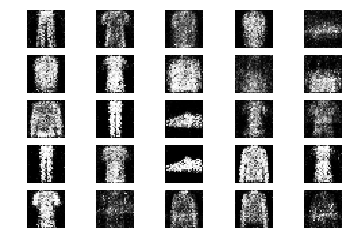

2951 [D loss: 0.627391, acc.: 62.50%] [G loss: 0.943614]
2952 [D loss: 0.629571, acc.: 65.62%] [G loss: 0.972986]
2953 [D loss: 0.577808, acc.: 70.31%] [G loss: 1.033456]
2954 [D loss: 0.607869, acc.: 62.50%] [G loss: 0.904874]
2955 [D loss: 0.612216, acc.: 60.94%] [G loss: 0.983718]
2956 [D loss: 0.605169, acc.: 65.62%] [G loss: 0.923422]
2957 [D loss: 0.550439, acc.: 75.00%] [G loss: 0.914220]
2958 [D loss: 0.615325, acc.: 67.19%] [G loss: 0.978377]
2959 [D loss: 0.618657, acc.: 62.50%] [G loss: 1.024640]
2960 [D loss: 0.576163, acc.: 79.69%] [G loss: 0.919257]
2961 [D loss: 0.591493, acc.: 73.44%] [G loss: 0.975543]
2962 [D loss: 0.696787, acc.: 48.44%] [G loss: 1.003075]
2963 [D loss: 0.667481, acc.: 57.81%] [G loss: 0.956209]
2964 [D loss: 0.599447, acc.: 71.88%] [G loss: 1.038647]
2965 [D loss: 0.605014, acc.: 70.31%] [G loss: 1.095761]
2966 [D loss: 0.677547, acc.: 56.25%] [G loss: 0.993852]
2967 [D loss: 0.656551, acc.: 59.38%] [G loss: 0.920699]
2968 [D loss: 0.585005, acc.: 6

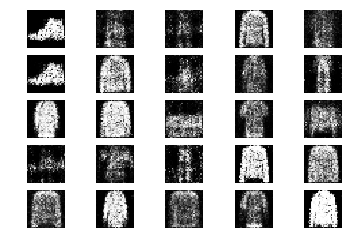

3001 [D loss: 0.612463, acc.: 60.94%] [G loss: 1.079303]
3002 [D loss: 0.642063, acc.: 65.62%] [G loss: 0.958126]
3003 [D loss: 0.682011, acc.: 59.38%] [G loss: 0.955366]
3004 [D loss: 0.605158, acc.: 62.50%] [G loss: 1.119325]
3005 [D loss: 0.683361, acc.: 64.06%] [G loss: 1.061140]
3006 [D loss: 0.641834, acc.: 65.62%] [G loss: 1.000285]
3007 [D loss: 0.585626, acc.: 68.75%] [G loss: 0.984671]
3008 [D loss: 0.623348, acc.: 67.19%] [G loss: 0.888875]
3009 [D loss: 0.609222, acc.: 60.94%] [G loss: 0.980233]
3010 [D loss: 0.651373, acc.: 54.69%] [G loss: 0.922228]
3011 [D loss: 0.602076, acc.: 65.62%] [G loss: 0.971697]
3012 [D loss: 0.638855, acc.: 60.94%] [G loss: 0.898572]
3013 [D loss: 0.685384, acc.: 53.12%] [G loss: 0.995828]
3014 [D loss: 0.573924, acc.: 73.44%] [G loss: 1.037062]
3015 [D loss: 0.624720, acc.: 68.75%] [G loss: 0.934564]
3016 [D loss: 0.572048, acc.: 71.88%] [G loss: 0.950448]
3017 [D loss: 0.672718, acc.: 57.81%] [G loss: 0.962931]
3018 [D loss: 0.614955, acc.: 6

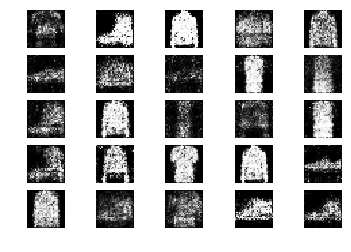

3051 [D loss: 0.605706, acc.: 64.06%] [G loss: 0.951493]
3052 [D loss: 0.631562, acc.: 57.81%] [G loss: 0.917014]
3053 [D loss: 0.602103, acc.: 67.19%] [G loss: 0.911633]
3054 [D loss: 0.650425, acc.: 65.62%] [G loss: 0.975138]
3055 [D loss: 0.612009, acc.: 67.19%] [G loss: 0.822127]
3056 [D loss: 0.662604, acc.: 54.69%] [G loss: 0.934772]
3057 [D loss: 0.589373, acc.: 70.31%] [G loss: 1.063001]
3058 [D loss: 0.703224, acc.: 64.06%] [G loss: 0.970804]
3059 [D loss: 0.577310, acc.: 73.44%] [G loss: 1.035121]
3060 [D loss: 0.671688, acc.: 53.12%] [G loss: 1.028017]
3061 [D loss: 0.691007, acc.: 56.25%] [G loss: 0.961125]
3062 [D loss: 0.619692, acc.: 59.38%] [G loss: 0.923528]
3063 [D loss: 0.600803, acc.: 65.62%] [G loss: 0.894925]
3064 [D loss: 0.540869, acc.: 78.12%] [G loss: 0.954880]
3065 [D loss: 0.631806, acc.: 62.50%] [G loss: 0.962273]
3066 [D loss: 0.635228, acc.: 65.62%] [G loss: 1.012998]
3067 [D loss: 0.648120, acc.: 62.50%] [G loss: 1.021377]
3068 [D loss: 0.627427, acc.: 6

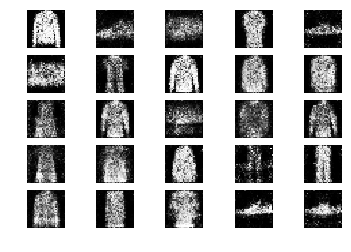

3101 [D loss: 0.658817, acc.: 67.19%] [G loss: 1.003231]
3102 [D loss: 0.645235, acc.: 57.81%] [G loss: 0.948099]
3103 [D loss: 0.564075, acc.: 75.00%] [G loss: 0.978438]
3104 [D loss: 0.702111, acc.: 56.25%] [G loss: 0.851537]
3105 [D loss: 0.626869, acc.: 71.88%] [G loss: 0.892408]
3106 [D loss: 0.604605, acc.: 67.19%] [G loss: 0.998984]
3107 [D loss: 0.582842, acc.: 70.31%] [G loss: 0.916662]
3108 [D loss: 0.757243, acc.: 46.88%] [G loss: 0.948482]
3109 [D loss: 0.610422, acc.: 68.75%] [G loss: 0.978271]
3110 [D loss: 0.645099, acc.: 64.06%] [G loss: 0.984401]
3111 [D loss: 0.615856, acc.: 70.31%] [G loss: 0.989895]
3112 [D loss: 0.687841, acc.: 54.69%] [G loss: 0.986612]
3113 [D loss: 0.631586, acc.: 67.19%] [G loss: 1.039844]
3114 [D loss: 0.616885, acc.: 62.50%] [G loss: 0.974614]
3115 [D loss: 0.630845, acc.: 65.62%] [G loss: 1.026575]
3116 [D loss: 0.679123, acc.: 57.81%] [G loss: 1.072664]
3117 [D loss: 0.648013, acc.: 57.81%] [G loss: 1.072130]
3118 [D loss: 0.614525, acc.: 7

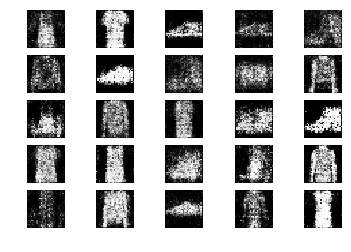

3151 [D loss: 0.559874, acc.: 75.00%] [G loss: 0.949073]
3152 [D loss: 0.591310, acc.: 73.44%] [G loss: 1.012979]
3153 [D loss: 0.654836, acc.: 60.94%] [G loss: 0.952105]
3154 [D loss: 0.624394, acc.: 65.62%] [G loss: 1.048149]
3155 [D loss: 0.632132, acc.: 64.06%] [G loss: 1.100804]
3156 [D loss: 0.618186, acc.: 67.19%] [G loss: 1.010126]
3157 [D loss: 0.687311, acc.: 59.38%] [G loss: 0.835406]
3158 [D loss: 0.615368, acc.: 64.06%] [G loss: 0.846989]
3159 [D loss: 0.643446, acc.: 60.94%] [G loss: 0.826355]
3160 [D loss: 0.620366, acc.: 68.75%] [G loss: 0.868601]
3161 [D loss: 0.534224, acc.: 81.25%] [G loss: 0.954375]
3162 [D loss: 0.535860, acc.: 71.88%] [G loss: 0.875489]
3163 [D loss: 0.599283, acc.: 71.88%] [G loss: 0.952794]
3164 [D loss: 0.714127, acc.: 60.94%] [G loss: 0.883577]
3165 [D loss: 0.648912, acc.: 62.50%] [G loss: 0.937025]
3166 [D loss: 0.579774, acc.: 70.31%] [G loss: 0.867150]
3167 [D loss: 0.649725, acc.: 62.50%] [G loss: 0.900381]
3168 [D loss: 0.575905, acc.: 6

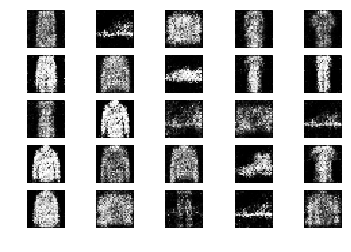

3201 [D loss: 0.656774, acc.: 59.38%] [G loss: 0.935158]
3202 [D loss: 0.567815, acc.: 73.44%] [G loss: 0.911235]
3203 [D loss: 0.655685, acc.: 59.38%] [G loss: 1.047210]
3204 [D loss: 0.601721, acc.: 60.94%] [G loss: 0.910249]
3205 [D loss: 0.559408, acc.: 71.88%] [G loss: 0.929374]
3206 [D loss: 0.619271, acc.: 62.50%] [G loss: 0.891925]
3207 [D loss: 0.617719, acc.: 64.06%] [G loss: 0.973230]
3208 [D loss: 0.566748, acc.: 73.44%] [G loss: 0.995185]
3209 [D loss: 0.665615, acc.: 57.81%] [G loss: 0.944115]
3210 [D loss: 0.665860, acc.: 60.94%] [G loss: 0.962613]
3211 [D loss: 0.642887, acc.: 65.62%] [G loss: 1.001009]
3212 [D loss: 0.632805, acc.: 70.31%] [G loss: 0.938046]
3213 [D loss: 0.587175, acc.: 67.19%] [G loss: 1.011301]
3214 [D loss: 0.746619, acc.: 53.12%] [G loss: 1.129378]
3215 [D loss: 0.586912, acc.: 67.19%] [G loss: 1.088173]
3216 [D loss: 0.627353, acc.: 68.75%] [G loss: 0.944857]
3217 [D loss: 0.582743, acc.: 67.19%] [G loss: 0.941136]
3218 [D loss: 0.633692, acc.: 6

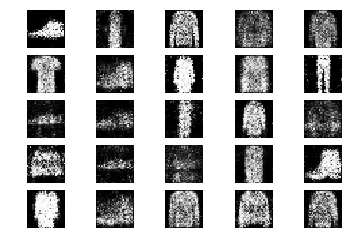

3251 [D loss: 0.685213, acc.: 57.81%] [G loss: 0.897731]
3252 [D loss: 0.580302, acc.: 73.44%] [G loss: 0.975705]
3253 [D loss: 0.571608, acc.: 70.31%] [G loss: 1.022265]
3254 [D loss: 0.721934, acc.: 51.56%] [G loss: 0.911088]
3255 [D loss: 0.684682, acc.: 59.38%] [G loss: 0.947315]
3256 [D loss: 0.663654, acc.: 60.94%] [G loss: 0.888662]
3257 [D loss: 0.642716, acc.: 64.06%] [G loss: 0.902406]
3258 [D loss: 0.651263, acc.: 60.94%] [G loss: 0.986003]
3259 [D loss: 0.669550, acc.: 53.12%] [G loss: 0.926064]
3260 [D loss: 0.582457, acc.: 70.31%] [G loss: 0.900397]
3261 [D loss: 0.588467, acc.: 68.75%] [G loss: 0.835726]
3262 [D loss: 0.610504, acc.: 65.62%] [G loss: 0.871383]
3263 [D loss: 0.582983, acc.: 65.62%] [G loss: 0.920748]
3264 [D loss: 0.575235, acc.: 73.44%] [G loss: 0.846660]
3265 [D loss: 0.630191, acc.: 64.06%] [G loss: 0.917298]
3266 [D loss: 0.634396, acc.: 65.62%] [G loss: 0.943422]
3267 [D loss: 0.699605, acc.: 50.00%] [G loss: 0.885025]
3268 [D loss: 0.633869, acc.: 6

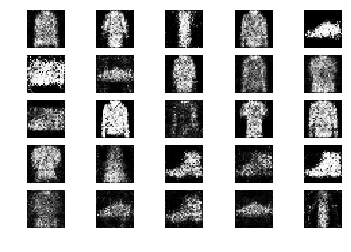

3301 [D loss: 0.616924, acc.: 65.62%] [G loss: 1.065547]
3302 [D loss: 0.635720, acc.: 64.06%] [G loss: 0.869321]
3303 [D loss: 0.654071, acc.: 64.06%] [G loss: 0.904491]
3304 [D loss: 0.667356, acc.: 54.69%] [G loss: 0.948948]
3305 [D loss: 0.575711, acc.: 71.88%] [G loss: 0.949573]
3306 [D loss: 0.635193, acc.: 65.62%] [G loss: 1.007710]
3307 [D loss: 0.643452, acc.: 54.69%] [G loss: 0.995851]
3308 [D loss: 0.594247, acc.: 75.00%] [G loss: 1.015249]
3309 [D loss: 0.672530, acc.: 57.81%] [G loss: 1.012850]
3310 [D loss: 0.675356, acc.: 60.94%] [G loss: 0.925806]
3311 [D loss: 0.663350, acc.: 68.75%] [G loss: 0.899404]
3312 [D loss: 0.531744, acc.: 79.69%] [G loss: 0.969176]
3313 [D loss: 0.605295, acc.: 62.50%] [G loss: 0.897928]
3314 [D loss: 0.609007, acc.: 67.19%] [G loss: 0.974553]
3315 [D loss: 0.636749, acc.: 64.06%] [G loss: 0.944452]
3316 [D loss: 0.606184, acc.: 64.06%] [G loss: 0.979305]
3317 [D loss: 0.611664, acc.: 60.94%] [G loss: 1.025782]
3318 [D loss: 0.572402, acc.: 6

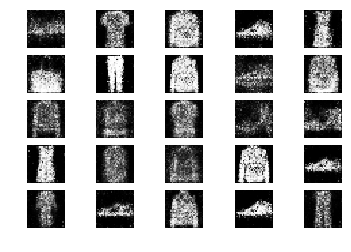

3351 [D loss: 0.585682, acc.: 73.44%] [G loss: 0.953972]
3352 [D loss: 0.670609, acc.: 56.25%] [G loss: 0.858282]
3353 [D loss: 0.579902, acc.: 75.00%] [G loss: 0.978716]
3354 [D loss: 0.610281, acc.: 73.44%] [G loss: 1.013592]
3355 [D loss: 0.575810, acc.: 73.44%] [G loss: 0.912551]
3356 [D loss: 0.623817, acc.: 64.06%] [G loss: 0.922675]
3357 [D loss: 0.595555, acc.: 70.31%] [G loss: 0.916456]
3358 [D loss: 0.634449, acc.: 62.50%] [G loss: 0.962911]
3359 [D loss: 0.659024, acc.: 56.25%] [G loss: 1.015932]
3360 [D loss: 0.586162, acc.: 62.50%] [G loss: 1.044595]
3361 [D loss: 0.619820, acc.: 64.06%] [G loss: 1.036798]
3362 [D loss: 0.605508, acc.: 68.75%] [G loss: 0.956810]
3363 [D loss: 0.629016, acc.: 53.12%] [G loss: 0.902802]
3364 [D loss: 0.633732, acc.: 56.25%] [G loss: 0.893124]
3365 [D loss: 0.652604, acc.: 65.62%] [G loss: 0.936601]
3366 [D loss: 0.568395, acc.: 73.44%] [G loss: 0.879396]
3367 [D loss: 0.637563, acc.: 60.94%] [G loss: 0.874025]
3368 [D loss: 0.576578, acc.: 6

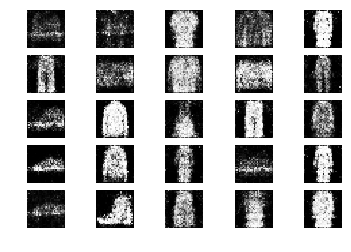

3401 [D loss: 0.587169, acc.: 71.88%] [G loss: 0.962356]
3402 [D loss: 0.704904, acc.: 57.81%] [G loss: 0.922521]
3403 [D loss: 0.604538, acc.: 67.19%] [G loss: 1.022879]
3404 [D loss: 0.618356, acc.: 68.75%] [G loss: 1.029435]
3405 [D loss: 0.696614, acc.: 59.38%] [G loss: 0.973662]
3406 [D loss: 0.727767, acc.: 51.56%] [G loss: 1.019014]
3407 [D loss: 0.588267, acc.: 67.19%] [G loss: 0.957531]
3408 [D loss: 0.593629, acc.: 73.44%] [G loss: 0.884931]
3409 [D loss: 0.582356, acc.: 79.69%] [G loss: 0.997784]
3410 [D loss: 0.598337, acc.: 65.62%] [G loss: 1.070261]
3411 [D loss: 0.591010, acc.: 70.31%] [G loss: 0.942224]
3412 [D loss: 0.581464, acc.: 75.00%] [G loss: 0.932000]
3413 [D loss: 0.607022, acc.: 62.50%] [G loss: 0.949701]
3414 [D loss: 0.632976, acc.: 64.06%] [G loss: 0.984814]
3415 [D loss: 0.537657, acc.: 81.25%] [G loss: 1.034815]
3416 [D loss: 0.627043, acc.: 67.19%] [G loss: 0.974554]
3417 [D loss: 0.654787, acc.: 65.62%] [G loss: 0.918793]
3418 [D loss: 0.631486, acc.: 6

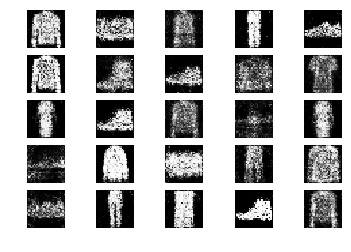

3451 [D loss: 0.663353, acc.: 59.38%] [G loss: 1.017171]
3452 [D loss: 0.646284, acc.: 57.81%] [G loss: 0.907861]
3453 [D loss: 0.640515, acc.: 67.19%] [G loss: 0.979473]
3454 [D loss: 0.640612, acc.: 53.12%] [G loss: 0.973706]
3455 [D loss: 0.638592, acc.: 62.50%] [G loss: 0.958170]
3456 [D loss: 0.642095, acc.: 54.69%] [G loss: 0.942312]
3457 [D loss: 0.569031, acc.: 70.31%] [G loss: 1.045406]
3458 [D loss: 0.668573, acc.: 56.25%] [G loss: 1.020834]
3459 [D loss: 0.602402, acc.: 62.50%] [G loss: 0.860663]
3460 [D loss: 0.672789, acc.: 62.50%] [G loss: 0.900725]
3461 [D loss: 0.606893, acc.: 64.06%] [G loss: 0.955181]
3462 [D loss: 0.595798, acc.: 73.44%] [G loss: 0.898893]
3463 [D loss: 0.640656, acc.: 56.25%] [G loss: 0.987062]
3464 [D loss: 0.605016, acc.: 67.19%] [G loss: 0.855540]
3465 [D loss: 0.575131, acc.: 71.88%] [G loss: 1.028658]
3466 [D loss: 0.703407, acc.: 53.12%] [G loss: 0.943605]
3467 [D loss: 0.627230, acc.: 71.88%] [G loss: 0.954493]
3468 [D loss: 0.611794, acc.: 6

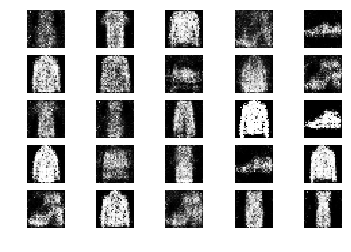

3501 [D loss: 0.632046, acc.: 71.88%] [G loss: 1.033142]
3502 [D loss: 0.608447, acc.: 67.19%] [G loss: 0.967172]
3503 [D loss: 0.699464, acc.: 57.81%] [G loss: 0.962958]
3504 [D loss: 0.594750, acc.: 71.88%] [G loss: 0.809647]
3505 [D loss: 0.618665, acc.: 64.06%] [G loss: 0.945494]
3506 [D loss: 0.643623, acc.: 57.81%] [G loss: 0.961693]
3507 [D loss: 0.680357, acc.: 59.38%] [G loss: 0.912855]
3508 [D loss: 0.621282, acc.: 59.38%] [G loss: 0.909290]
3509 [D loss: 0.653710, acc.: 59.38%] [G loss: 0.981458]
3510 [D loss: 0.567924, acc.: 78.12%] [G loss: 0.825862]
3511 [D loss: 0.646951, acc.: 65.62%] [G loss: 0.911999]
3512 [D loss: 0.713573, acc.: 54.69%] [G loss: 0.938006]
3513 [D loss: 0.612514, acc.: 70.31%] [G loss: 1.045916]
3514 [D loss: 0.598799, acc.: 68.75%] [G loss: 0.978556]
3515 [D loss: 0.618667, acc.: 64.06%] [G loss: 0.994300]
3516 [D loss: 0.569986, acc.: 73.44%] [G loss: 0.870246]
3517 [D loss: 0.654965, acc.: 54.69%] [G loss: 0.907306]
3518 [D loss: 0.657456, acc.: 5

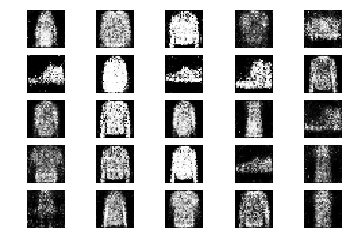

3551 [D loss: 0.611989, acc.: 67.19%] [G loss: 0.901785]
3552 [D loss: 0.624318, acc.: 62.50%] [G loss: 0.821669]
3553 [D loss: 0.654906, acc.: 59.38%] [G loss: 1.050490]
3554 [D loss: 0.597650, acc.: 71.88%] [G loss: 1.011996]
3555 [D loss: 0.674783, acc.: 65.62%] [G loss: 1.016663]
3556 [D loss: 0.712283, acc.: 56.25%] [G loss: 0.871745]
3557 [D loss: 0.622572, acc.: 59.38%] [G loss: 0.963900]
3558 [D loss: 0.582582, acc.: 76.56%] [G loss: 0.946388]
3559 [D loss: 0.682518, acc.: 57.81%] [G loss: 0.952178]
3560 [D loss: 0.696769, acc.: 56.25%] [G loss: 0.911366]
3561 [D loss: 0.588373, acc.: 65.62%] [G loss: 0.904209]
3562 [D loss: 0.672795, acc.: 59.38%] [G loss: 0.941386]
3563 [D loss: 0.558702, acc.: 76.56%] [G loss: 0.924711]
3564 [D loss: 0.615645, acc.: 70.31%] [G loss: 0.968397]
3565 [D loss: 0.700554, acc.: 53.12%] [G loss: 0.944595]
3566 [D loss: 0.631294, acc.: 64.06%] [G loss: 0.877644]
3567 [D loss: 0.644648, acc.: 64.06%] [G loss: 0.930286]
3568 [D loss: 0.632262, acc.: 6

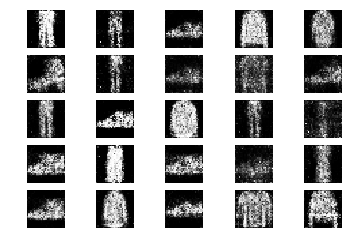

3601 [D loss: 0.598386, acc.: 59.38%] [G loss: 1.019349]
3602 [D loss: 0.670548, acc.: 57.81%] [G loss: 0.822177]
3603 [D loss: 0.622392, acc.: 65.62%] [G loss: 0.993963]
3604 [D loss: 0.697924, acc.: 51.56%] [G loss: 0.948872]
3605 [D loss: 0.596493, acc.: 71.88%] [G loss: 0.934835]
3606 [D loss: 0.608743, acc.: 64.06%] [G loss: 0.897617]
3607 [D loss: 0.630107, acc.: 64.06%] [G loss: 1.027835]
3608 [D loss: 0.632718, acc.: 68.75%] [G loss: 0.916825]
3609 [D loss: 0.557406, acc.: 68.75%] [G loss: 0.934801]
3610 [D loss: 0.674087, acc.: 54.69%] [G loss: 0.924617]
3611 [D loss: 0.600991, acc.: 68.75%] [G loss: 1.004673]
3612 [D loss: 0.604030, acc.: 71.88%] [G loss: 0.933490]
3613 [D loss: 0.591329, acc.: 68.75%] [G loss: 1.065234]
3614 [D loss: 0.688994, acc.: 57.81%] [G loss: 0.934940]
3615 [D loss: 0.639417, acc.: 65.62%] [G loss: 1.044142]
3616 [D loss: 0.623719, acc.: 67.19%] [G loss: 0.924022]
3617 [D loss: 0.703365, acc.: 50.00%] [G loss: 0.997590]
3618 [D loss: 0.619128, acc.: 5

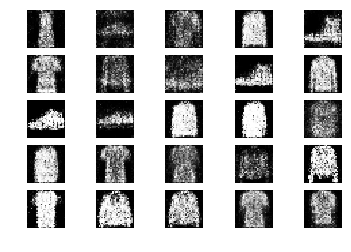

3651 [D loss: 0.640660, acc.: 54.69%] [G loss: 0.891174]
3652 [D loss: 0.678418, acc.: 64.06%] [G loss: 0.847486]
3653 [D loss: 0.591375, acc.: 65.62%] [G loss: 0.900402]
3654 [D loss: 0.682561, acc.: 53.12%] [G loss: 0.915745]
3655 [D loss: 0.607912, acc.: 67.19%] [G loss: 0.984280]
3656 [D loss: 0.666041, acc.: 60.94%] [G loss: 0.955678]
3657 [D loss: 0.667158, acc.: 57.81%] [G loss: 0.907249]
3658 [D loss: 0.591994, acc.: 71.88%] [G loss: 1.037921]
3659 [D loss: 0.644377, acc.: 62.50%] [G loss: 0.945423]
3660 [D loss: 0.644551, acc.: 60.94%] [G loss: 0.880116]
3661 [D loss: 0.615876, acc.: 62.50%] [G loss: 0.997373]
3662 [D loss: 0.578046, acc.: 68.75%] [G loss: 1.006697]
3663 [D loss: 0.646311, acc.: 62.50%] [G loss: 0.983875]
3664 [D loss: 0.674721, acc.: 53.12%] [G loss: 0.930727]
3665 [D loss: 0.657852, acc.: 60.94%] [G loss: 0.970662]
3666 [D loss: 0.613126, acc.: 62.50%] [G loss: 0.903008]
3667 [D loss: 0.635426, acc.: 57.81%] [G loss: 0.890679]
3668 [D loss: 0.633908, acc.: 6

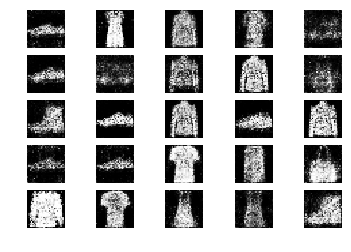

3701 [D loss: 0.684723, acc.: 59.38%] [G loss: 0.973365]
3702 [D loss: 0.626097, acc.: 64.06%] [G loss: 0.895253]
3703 [D loss: 0.636486, acc.: 64.06%] [G loss: 1.025635]
3704 [D loss: 0.706392, acc.: 51.56%] [G loss: 0.899182]
3705 [D loss: 0.620408, acc.: 64.06%] [G loss: 0.974145]
3706 [D loss: 0.632536, acc.: 64.06%] [G loss: 0.960539]
3707 [D loss: 0.647073, acc.: 60.94%] [G loss: 0.926649]
3708 [D loss: 0.653225, acc.: 57.81%] [G loss: 0.871276]
3709 [D loss: 0.587025, acc.: 65.62%] [G loss: 0.896404]
3710 [D loss: 0.612222, acc.: 67.19%] [G loss: 0.856676]
3711 [D loss: 0.675269, acc.: 64.06%] [G loss: 0.923155]
3712 [D loss: 0.587565, acc.: 70.31%] [G loss: 0.979245]
3713 [D loss: 0.657349, acc.: 62.50%] [G loss: 0.956791]
3714 [D loss: 0.705178, acc.: 56.25%] [G loss: 1.020303]
3715 [D loss: 0.608781, acc.: 67.19%] [G loss: 0.911226]
3716 [D loss: 0.632907, acc.: 57.81%] [G loss: 0.994090]
3717 [D loss: 0.596426, acc.: 64.06%] [G loss: 0.992829]
3718 [D loss: 0.627035, acc.: 6

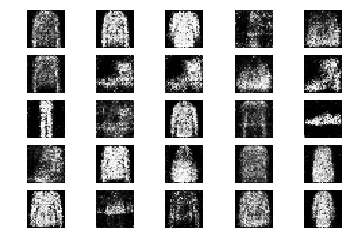

3751 [D loss: 0.628560, acc.: 67.19%] [G loss: 0.995127]
3752 [D loss: 0.608781, acc.: 60.94%] [G loss: 0.939515]
3753 [D loss: 0.711003, acc.: 56.25%] [G loss: 0.929951]
3754 [D loss: 0.681343, acc.: 57.81%] [G loss: 0.939506]
3755 [D loss: 0.664046, acc.: 60.94%] [G loss: 1.004231]
3756 [D loss: 0.603844, acc.: 68.75%] [G loss: 0.947549]
3757 [D loss: 0.639345, acc.: 64.06%] [G loss: 0.979294]
3758 [D loss: 0.585289, acc.: 76.56%] [G loss: 1.031396]
3759 [D loss: 0.640557, acc.: 67.19%] [G loss: 0.921929]
3760 [D loss: 0.714395, acc.: 53.12%] [G loss: 0.928634]
3761 [D loss: 0.606279, acc.: 73.44%] [G loss: 0.941675]
3762 [D loss: 0.584241, acc.: 81.25%] [G loss: 0.942568]
3763 [D loss: 0.614565, acc.: 60.94%] [G loss: 0.860881]
3764 [D loss: 0.595138, acc.: 75.00%] [G loss: 0.876661]
3765 [D loss: 0.632123, acc.: 64.06%] [G loss: 0.964330]
3766 [D loss: 0.652952, acc.: 64.06%] [G loss: 0.936830]
3767 [D loss: 0.663242, acc.: 57.81%] [G loss: 0.828397]
3768 [D loss: 0.557075, acc.: 7

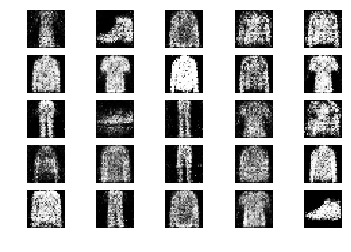

3801 [D loss: 0.689642, acc.: 54.69%] [G loss: 0.859356]
3802 [D loss: 0.597468, acc.: 68.75%] [G loss: 0.861317]
3803 [D loss: 0.691778, acc.: 57.81%] [G loss: 0.924662]
3804 [D loss: 0.668472, acc.: 64.06%] [G loss: 0.930497]
3805 [D loss: 0.625443, acc.: 64.06%] [G loss: 0.918316]
3806 [D loss: 0.686147, acc.: 56.25%] [G loss: 0.984612]
3807 [D loss: 0.600576, acc.: 70.31%] [G loss: 0.965408]
3808 [D loss: 0.623204, acc.: 68.75%] [G loss: 0.900329]
3809 [D loss: 0.653553, acc.: 56.25%] [G loss: 0.898348]
3810 [D loss: 0.549233, acc.: 76.56%] [G loss: 0.944162]
3811 [D loss: 0.635552, acc.: 65.62%] [G loss: 0.966020]
3812 [D loss: 0.590414, acc.: 67.19%] [G loss: 1.027404]
3813 [D loss: 0.645355, acc.: 57.81%] [G loss: 0.981919]
3814 [D loss: 0.643479, acc.: 62.50%] [G loss: 0.937562]
3815 [D loss: 0.716354, acc.: 54.69%] [G loss: 0.934797]
3816 [D loss: 0.703317, acc.: 59.38%] [G loss: 0.915549]
3817 [D loss: 0.659221, acc.: 64.06%] [G loss: 1.008098]
3818 [D loss: 0.614958, acc.: 6

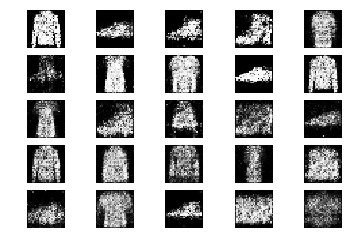

3851 [D loss: 0.701842, acc.: 57.81%] [G loss: 0.890286]
3852 [D loss: 0.591485, acc.: 67.19%] [G loss: 0.902922]
3853 [D loss: 0.617901, acc.: 68.75%] [G loss: 0.929126]
3854 [D loss: 0.628702, acc.: 65.62%] [G loss: 0.906302]
3855 [D loss: 0.624353, acc.: 62.50%] [G loss: 0.863282]
3856 [D loss: 0.595714, acc.: 68.75%] [G loss: 0.962472]
3857 [D loss: 0.650416, acc.: 67.19%] [G loss: 0.936041]
3858 [D loss: 0.643570, acc.: 60.94%] [G loss: 0.886227]
3859 [D loss: 0.602339, acc.: 67.19%] [G loss: 0.956764]
3860 [D loss: 0.632286, acc.: 64.06%] [G loss: 0.908512]
3861 [D loss: 0.627378, acc.: 67.19%] [G loss: 1.036418]
3862 [D loss: 0.652981, acc.: 65.62%] [G loss: 0.976915]
3863 [D loss: 0.661453, acc.: 59.38%] [G loss: 1.008741]
3864 [D loss: 0.652889, acc.: 62.50%] [G loss: 0.921197]
3865 [D loss: 0.678196, acc.: 56.25%] [G loss: 0.967371]
3866 [D loss: 0.611498, acc.: 60.94%] [G loss: 0.836091]
3867 [D loss: 0.611957, acc.: 62.50%] [G loss: 0.852880]
3868 [D loss: 0.606857, acc.: 7

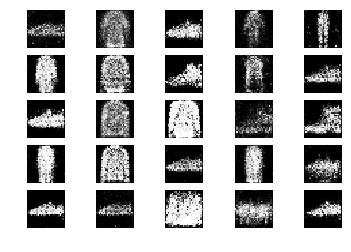

3901 [D loss: 0.607965, acc.: 65.62%] [G loss: 0.919558]
3902 [D loss: 0.613196, acc.: 73.44%] [G loss: 0.906374]
3903 [D loss: 0.634012, acc.: 65.62%] [G loss: 0.793405]
3904 [D loss: 0.696669, acc.: 51.56%] [G loss: 0.913719]
3905 [D loss: 0.665869, acc.: 57.81%] [G loss: 0.970094]
3906 [D loss: 0.573272, acc.: 70.31%] [G loss: 0.966464]
3907 [D loss: 0.645215, acc.: 64.06%] [G loss: 0.901527]
3908 [D loss: 0.715546, acc.: 56.25%] [G loss: 0.921891]
3909 [D loss: 0.611017, acc.: 67.19%] [G loss: 0.954958]
3910 [D loss: 0.631953, acc.: 62.50%] [G loss: 0.940463]
3911 [D loss: 0.626502, acc.: 67.19%] [G loss: 1.047538]
3912 [D loss: 0.602367, acc.: 65.62%] [G loss: 1.023132]
3913 [D loss: 0.693756, acc.: 56.25%] [G loss: 0.966702]
3914 [D loss: 0.704180, acc.: 54.69%] [G loss: 0.912614]
3915 [D loss: 0.573448, acc.: 76.56%] [G loss: 0.986827]
3916 [D loss: 0.620052, acc.: 62.50%] [G loss: 1.071847]
3917 [D loss: 0.630334, acc.: 57.81%] [G loss: 0.914581]
3918 [D loss: 0.732006, acc.: 5

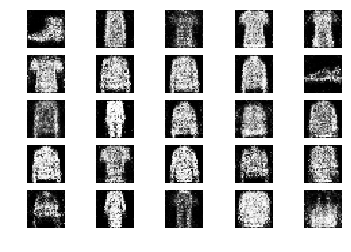

3951 [D loss: 0.696862, acc.: 53.12%] [G loss: 0.946070]
3952 [D loss: 0.613527, acc.: 64.06%] [G loss: 0.983650]
3953 [D loss: 0.688493, acc.: 64.06%] [G loss: 0.876189]
3954 [D loss: 0.670927, acc.: 51.56%] [G loss: 0.921131]
3955 [D loss: 0.671788, acc.: 54.69%] [G loss: 0.853402]
3956 [D loss: 0.658169, acc.: 54.69%] [G loss: 1.016826]
3957 [D loss: 0.626290, acc.: 65.62%] [G loss: 0.980868]
3958 [D loss: 0.622147, acc.: 60.94%] [G loss: 0.953011]
3959 [D loss: 0.553989, acc.: 73.44%] [G loss: 0.932043]
3960 [D loss: 0.677332, acc.: 59.38%] [G loss: 0.965251]
3961 [D loss: 0.617756, acc.: 67.19%] [G loss: 1.003733]
3962 [D loss: 0.591233, acc.: 71.88%] [G loss: 0.899615]
3963 [D loss: 0.535368, acc.: 76.56%] [G loss: 0.994402]
3964 [D loss: 0.659207, acc.: 60.94%] [G loss: 0.907342]
3965 [D loss: 0.658893, acc.: 65.62%] [G loss: 0.879969]
3966 [D loss: 0.604105, acc.: 64.06%] [G loss: 0.948619]
3967 [D loss: 0.605249, acc.: 65.62%] [G loss: 0.882040]
3968 [D loss: 0.623433, acc.: 6

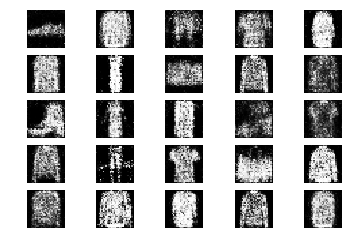

4001 [D loss: 0.646216, acc.: 64.06%] [G loss: 0.909287]
4002 [D loss: 0.658923, acc.: 65.62%] [G loss: 0.966931]
4003 [D loss: 0.629478, acc.: 71.88%] [G loss: 1.036168]
4004 [D loss: 0.639480, acc.: 67.19%] [G loss: 0.870613]
4005 [D loss: 0.638026, acc.: 67.19%] [G loss: 0.971048]
4006 [D loss: 0.557064, acc.: 78.12%] [G loss: 0.974099]
4007 [D loss: 0.607797, acc.: 67.19%] [G loss: 0.889605]
4008 [D loss: 0.620819, acc.: 65.62%] [G loss: 1.005962]
4009 [D loss: 0.597462, acc.: 70.31%] [G loss: 1.038950]
4010 [D loss: 0.664812, acc.: 59.38%] [G loss: 0.956956]
4011 [D loss: 0.613371, acc.: 67.19%] [G loss: 1.100991]
4012 [D loss: 0.538818, acc.: 81.25%] [G loss: 0.992330]
4013 [D loss: 0.604966, acc.: 67.19%] [G loss: 1.033398]
4014 [D loss: 0.505364, acc.: 76.56%] [G loss: 1.039800]
4015 [D loss: 0.662833, acc.: 56.25%] [G loss: 0.953027]
4016 [D loss: 0.654914, acc.: 54.69%] [G loss: 0.954030]
4017 [D loss: 0.604052, acc.: 64.06%] [G loss: 0.830543]
4018 [D loss: 0.667474, acc.: 5

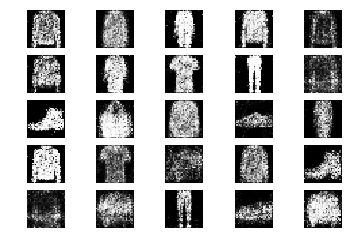

4051 [D loss: 0.581173, acc.: 71.88%] [G loss: 0.896997]
4052 [D loss: 0.595417, acc.: 70.31%] [G loss: 0.985820]
4053 [D loss: 0.671326, acc.: 59.38%] [G loss: 1.035565]
4054 [D loss: 0.648633, acc.: 64.06%] [G loss: 0.858203]
4055 [D loss: 0.635053, acc.: 62.50%] [G loss: 0.953058]
4056 [D loss: 0.655877, acc.: 59.38%] [G loss: 0.871501]
4057 [D loss: 0.677193, acc.: 57.81%] [G loss: 0.931886]
4058 [D loss: 0.654058, acc.: 65.62%] [G loss: 0.863223]
4059 [D loss: 0.637092, acc.: 60.94%] [G loss: 0.973943]
4060 [D loss: 0.606232, acc.: 70.31%] [G loss: 0.974346]
4061 [D loss: 0.628208, acc.: 57.81%] [G loss: 0.969909]
4062 [D loss: 0.592422, acc.: 65.62%] [G loss: 0.967370]
4063 [D loss: 0.739699, acc.: 56.25%] [G loss: 0.977425]
4064 [D loss: 0.719509, acc.: 56.25%] [G loss: 0.913651]
4065 [D loss: 0.735692, acc.: 56.25%] [G loss: 0.958717]
4066 [D loss: 0.614137, acc.: 64.06%] [G loss: 1.000455]
4067 [D loss: 0.675958, acc.: 53.12%] [G loss: 0.923314]
4068 [D loss: 0.657189, acc.: 6

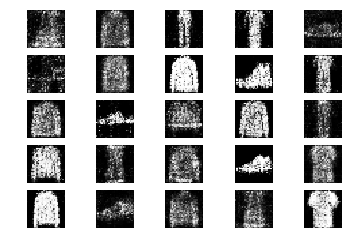

4101 [D loss: 0.686887, acc.: 53.12%] [G loss: 0.994922]
4102 [D loss: 0.666631, acc.: 60.94%] [G loss: 0.979518]
4103 [D loss: 0.564725, acc.: 73.44%] [G loss: 0.965398]
4104 [D loss: 0.666036, acc.: 65.62%] [G loss: 0.959407]
4105 [D loss: 0.657167, acc.: 56.25%] [G loss: 0.890235]
4106 [D loss: 0.571277, acc.: 73.44%] [G loss: 1.005070]
4107 [D loss: 0.666568, acc.: 57.81%] [G loss: 0.952685]
4108 [D loss: 0.636359, acc.: 64.06%] [G loss: 1.016035]
4109 [D loss: 0.665293, acc.: 51.56%] [G loss: 0.945817]
4110 [D loss: 0.622059, acc.: 64.06%] [G loss: 0.969706]
4111 [D loss: 0.585275, acc.: 73.44%] [G loss: 0.991723]
4112 [D loss: 0.613532, acc.: 71.88%] [G loss: 0.955896]
4113 [D loss: 0.681056, acc.: 48.44%] [G loss: 0.841278]
4114 [D loss: 0.593187, acc.: 71.88%] [G loss: 0.841126]
4115 [D loss: 0.597345, acc.: 70.31%] [G loss: 0.944821]
4116 [D loss: 0.644447, acc.: 64.06%] [G loss: 0.948192]
4117 [D loss: 0.613598, acc.: 64.06%] [G loss: 0.979462]
4118 [D loss: 0.709127, acc.: 5

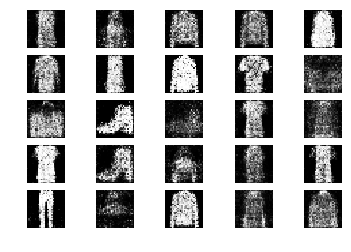

4151 [D loss: 0.635985, acc.: 67.19%] [G loss: 0.915494]
4152 [D loss: 0.652378, acc.: 62.50%] [G loss: 0.986068]
4153 [D loss: 0.646112, acc.: 70.31%] [G loss: 1.106242]
4154 [D loss: 0.634981, acc.: 59.38%] [G loss: 0.962676]
4155 [D loss: 0.722640, acc.: 50.00%] [G loss: 0.876212]
4156 [D loss: 0.527479, acc.: 84.38%] [G loss: 0.955215]
4157 [D loss: 0.648160, acc.: 62.50%] [G loss: 0.879756]
4158 [D loss: 0.601520, acc.: 68.75%] [G loss: 0.944977]
4159 [D loss: 0.660234, acc.: 60.94%] [G loss: 0.982440]
4160 [D loss: 0.631001, acc.: 57.81%] [G loss: 1.029662]
4161 [D loss: 0.511371, acc.: 79.69%] [G loss: 0.931391]
4162 [D loss: 0.776872, acc.: 50.00%] [G loss: 0.906546]
4163 [D loss: 0.679781, acc.: 62.50%] [G loss: 0.854768]
4164 [D loss: 0.621962, acc.: 68.75%] [G loss: 0.843302]
4165 [D loss: 0.720371, acc.: 53.12%] [G loss: 0.953125]
4166 [D loss: 0.668962, acc.: 60.94%] [G loss: 0.937998]
4167 [D loss: 0.616591, acc.: 65.62%] [G loss: 0.890778]
4168 [D loss: 0.593860, acc.: 6

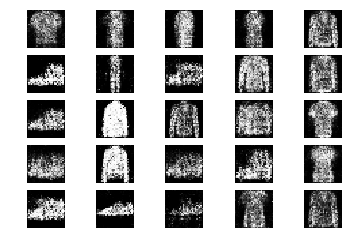

4201 [D loss: 0.651490, acc.: 60.94%] [G loss: 0.913453]
4202 [D loss: 0.647231, acc.: 68.75%] [G loss: 0.922568]
4203 [D loss: 0.719096, acc.: 56.25%] [G loss: 0.919727]
4204 [D loss: 0.653354, acc.: 60.94%] [G loss: 0.966307]
4205 [D loss: 0.616356, acc.: 64.06%] [G loss: 1.025499]
4206 [D loss: 0.611957, acc.: 62.50%] [G loss: 0.956231]
4207 [D loss: 0.613903, acc.: 64.06%] [G loss: 1.031947]
4208 [D loss: 0.659510, acc.: 60.94%] [G loss: 0.983876]
4209 [D loss: 0.602895, acc.: 60.94%] [G loss: 0.863281]
4210 [D loss: 0.581997, acc.: 70.31%] [G loss: 0.909091]
4211 [D loss: 0.652959, acc.: 62.50%] [G loss: 0.935312]
4212 [D loss: 0.706028, acc.: 48.44%] [G loss: 0.893868]
4213 [D loss: 0.654014, acc.: 59.38%] [G loss: 0.960289]
4214 [D loss: 0.691126, acc.: 54.69%] [G loss: 0.979445]
4215 [D loss: 0.588589, acc.: 67.19%] [G loss: 1.019567]
4216 [D loss: 0.579636, acc.: 71.88%] [G loss: 0.918495]
4217 [D loss: 0.660800, acc.: 59.38%] [G loss: 0.978726]
4218 [D loss: 0.669144, acc.: 5

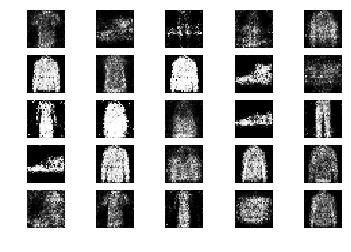

4251 [D loss: 0.629097, acc.: 64.06%] [G loss: 1.038449]
4252 [D loss: 0.639081, acc.: 65.62%] [G loss: 0.960852]
4253 [D loss: 0.666680, acc.: 57.81%] [G loss: 0.974060]
4254 [D loss: 0.613802, acc.: 64.06%] [G loss: 0.927748]
4255 [D loss: 0.637537, acc.: 64.06%] [G loss: 0.870290]
4256 [D loss: 0.656895, acc.: 64.06%] [G loss: 0.982911]
4257 [D loss: 0.649536, acc.: 60.94%] [G loss: 0.847576]
4258 [D loss: 0.691087, acc.: 62.50%] [G loss: 0.899009]
4259 [D loss: 0.653311, acc.: 62.50%] [G loss: 1.030530]
4260 [D loss: 0.652924, acc.: 64.06%] [G loss: 0.975486]
4261 [D loss: 0.652304, acc.: 59.38%] [G loss: 0.893942]
4262 [D loss: 0.754581, acc.: 53.12%] [G loss: 0.833752]
4263 [D loss: 0.655617, acc.: 54.69%] [G loss: 0.940475]
4264 [D loss: 0.640980, acc.: 62.50%] [G loss: 0.853168]
4265 [D loss: 0.579713, acc.: 71.88%] [G loss: 0.917753]
4266 [D loss: 0.601853, acc.: 75.00%] [G loss: 0.986184]
4267 [D loss: 0.640269, acc.: 60.94%] [G loss: 0.972066]
4268 [D loss: 0.630466, acc.: 6

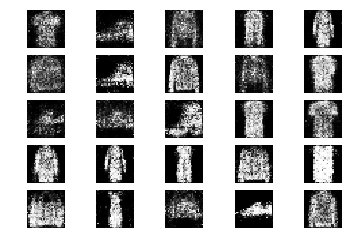

4301 [D loss: 0.697978, acc.: 57.81%] [G loss: 0.986038]
4302 [D loss: 0.679326, acc.: 56.25%] [G loss: 0.977706]
4303 [D loss: 0.631976, acc.: 65.62%] [G loss: 0.966185]
4304 [D loss: 0.573988, acc.: 73.44%] [G loss: 0.965111]
4305 [D loss: 0.725043, acc.: 51.56%] [G loss: 0.965577]
4306 [D loss: 0.663127, acc.: 60.94%] [G loss: 0.984525]
4307 [D loss: 0.613529, acc.: 62.50%] [G loss: 0.884688]
4308 [D loss: 0.588196, acc.: 73.44%] [G loss: 1.041299]
4309 [D loss: 0.640253, acc.: 60.94%] [G loss: 0.992747]
4310 [D loss: 0.676168, acc.: 51.56%] [G loss: 0.994433]
4311 [D loss: 0.615299, acc.: 71.88%] [G loss: 0.965946]
4312 [D loss: 0.680131, acc.: 54.69%] [G loss: 0.994908]
4313 [D loss: 0.691506, acc.: 54.69%] [G loss: 0.911229]
4314 [D loss: 0.611373, acc.: 75.00%] [G loss: 0.939420]
4315 [D loss: 0.595758, acc.: 76.56%] [G loss: 0.940449]
4316 [D loss: 0.587999, acc.: 71.88%] [G loss: 0.981870]
4317 [D loss: 0.706189, acc.: 54.69%] [G loss: 1.042733]
4318 [D loss: 0.632752, acc.: 6

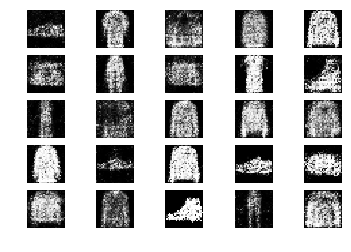

4351 [D loss: 0.655847, acc.: 59.38%] [G loss: 1.016855]
4352 [D loss: 0.646722, acc.: 64.06%] [G loss: 0.942026]
4353 [D loss: 0.606311, acc.: 73.44%] [G loss: 0.987434]
4354 [D loss: 0.636838, acc.: 67.19%] [G loss: 0.965497]
4355 [D loss: 0.667336, acc.: 53.12%] [G loss: 0.925422]
4356 [D loss: 0.644117, acc.: 62.50%] [G loss: 0.881591]
4357 [D loss: 0.623026, acc.: 62.50%] [G loss: 0.993669]
4358 [D loss: 0.611445, acc.: 65.62%] [G loss: 0.887104]
4359 [D loss: 0.672432, acc.: 56.25%] [G loss: 0.831160]
4360 [D loss: 0.626901, acc.: 60.94%] [G loss: 1.018618]
4361 [D loss: 0.652924, acc.: 57.81%] [G loss: 1.079214]
4362 [D loss: 0.580158, acc.: 64.06%] [G loss: 0.902820]
4363 [D loss: 0.688353, acc.: 50.00%] [G loss: 0.999153]
4364 [D loss: 0.702533, acc.: 59.38%] [G loss: 0.992317]
4365 [D loss: 0.677240, acc.: 59.38%] [G loss: 0.937333]
4366 [D loss: 0.738565, acc.: 51.56%] [G loss: 0.866380]
4367 [D loss: 0.624667, acc.: 62.50%] [G loss: 0.939048]
4368 [D loss: 0.660430, acc.: 6

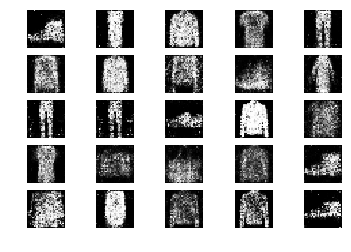

4401 [D loss: 0.653437, acc.: 64.06%] [G loss: 0.859882]
4402 [D loss: 0.633405, acc.: 64.06%] [G loss: 0.794969]
4403 [D loss: 0.643406, acc.: 62.50%] [G loss: 0.942209]
4404 [D loss: 0.637268, acc.: 62.50%] [G loss: 0.899593]
4405 [D loss: 0.635427, acc.: 62.50%] [G loss: 0.903720]
4406 [D loss: 0.668748, acc.: 56.25%] [G loss: 0.938796]
4407 [D loss: 0.627693, acc.: 65.62%] [G loss: 0.959704]
4408 [D loss: 0.616523, acc.: 64.06%] [G loss: 0.987538]
4409 [D loss: 0.616840, acc.: 59.38%] [G loss: 0.935410]
4410 [D loss: 0.608683, acc.: 71.88%] [G loss: 0.952179]
4411 [D loss: 0.611022, acc.: 68.75%] [G loss: 0.893475]
4412 [D loss: 0.725615, acc.: 56.25%] [G loss: 0.939773]
4413 [D loss: 0.655417, acc.: 62.50%] [G loss: 0.878139]
4414 [D loss: 0.634706, acc.: 68.75%] [G loss: 0.848511]
4415 [D loss: 0.606910, acc.: 64.06%] [G loss: 0.951320]
4416 [D loss: 0.653119, acc.: 54.69%] [G loss: 0.879313]
4417 [D loss: 0.608275, acc.: 70.31%] [G loss: 0.916203]
4418 [D loss: 0.652673, acc.: 5

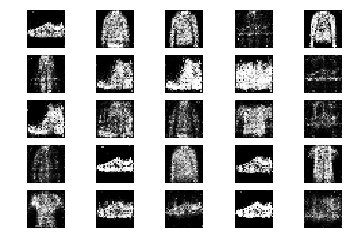

4451 [D loss: 0.646924, acc.: 65.62%] [G loss: 0.956140]
4452 [D loss: 0.651995, acc.: 65.62%] [G loss: 0.981196]
4453 [D loss: 0.624687, acc.: 60.94%] [G loss: 0.879980]
4454 [D loss: 0.603041, acc.: 64.06%] [G loss: 0.807654]
4455 [D loss: 0.659874, acc.: 54.69%] [G loss: 0.905107]
4456 [D loss: 0.624554, acc.: 64.06%] [G loss: 0.964586]
4457 [D loss: 0.640266, acc.: 67.19%] [G loss: 0.885311]
4458 [D loss: 0.569741, acc.: 70.31%] [G loss: 0.910409]
4459 [D loss: 0.610144, acc.: 70.31%] [G loss: 0.905768]
4460 [D loss: 0.601348, acc.: 67.19%] [G loss: 1.004676]
4461 [D loss: 0.716528, acc.: 54.69%] [G loss: 0.799839]
4462 [D loss: 0.673963, acc.: 60.94%] [G loss: 0.854340]
4463 [D loss: 0.634133, acc.: 67.19%] [G loss: 0.796027]
4464 [D loss: 0.670223, acc.: 64.06%] [G loss: 0.912438]
4465 [D loss: 0.586974, acc.: 65.62%] [G loss: 0.996955]
4466 [D loss: 0.669687, acc.: 64.06%] [G loss: 0.951970]
4467 [D loss: 0.725081, acc.: 50.00%] [G loss: 0.887225]
4468 [D loss: 0.650520, acc.: 6

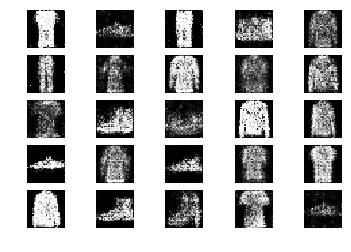

4501 [D loss: 0.612098, acc.: 59.38%] [G loss: 0.948424]
4502 [D loss: 0.655253, acc.: 67.19%] [G loss: 0.886711]
4503 [D loss: 0.700631, acc.: 48.44%] [G loss: 0.974633]
4504 [D loss: 0.633432, acc.: 71.88%] [G loss: 0.902793]
4505 [D loss: 0.610801, acc.: 62.50%] [G loss: 1.070834]
4506 [D loss: 0.622437, acc.: 62.50%] [G loss: 1.035676]
4507 [D loss: 0.736226, acc.: 51.56%] [G loss: 0.902901]
4508 [D loss: 0.597896, acc.: 65.62%] [G loss: 0.946048]
4509 [D loss: 0.614688, acc.: 70.31%] [G loss: 0.914548]
4510 [D loss: 0.612846, acc.: 65.62%] [G loss: 1.010269]
4511 [D loss: 0.621401, acc.: 59.38%] [G loss: 1.027334]
4512 [D loss: 0.696358, acc.: 53.12%] [G loss: 0.986039]
4513 [D loss: 0.627016, acc.: 73.44%] [G loss: 0.937860]
4514 [D loss: 0.676907, acc.: 60.94%] [G loss: 1.071372]
4515 [D loss: 0.596454, acc.: 68.75%] [G loss: 0.942015]
4516 [D loss: 0.601058, acc.: 64.06%] [G loss: 0.904373]
4517 [D loss: 0.693499, acc.: 56.25%] [G loss: 0.856339]
4518 [D loss: 0.655725, acc.: 5

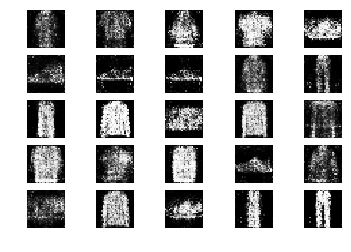

4551 [D loss: 0.572334, acc.: 70.31%] [G loss: 0.912665]
4552 [D loss: 0.628730, acc.: 62.50%] [G loss: 0.849770]
4553 [D loss: 0.622650, acc.: 60.94%] [G loss: 0.949419]
4554 [D loss: 0.694437, acc.: 62.50%] [G loss: 0.894983]
4555 [D loss: 0.640499, acc.: 70.31%] [G loss: 0.917417]
4556 [D loss: 0.710098, acc.: 56.25%] [G loss: 0.974060]
4557 [D loss: 0.589377, acc.: 73.44%] [G loss: 0.961043]
4558 [D loss: 0.669703, acc.: 56.25%] [G loss: 0.956296]
4559 [D loss: 0.626202, acc.: 67.19%] [G loss: 0.887381]
4560 [D loss: 0.655872, acc.: 64.06%] [G loss: 0.906238]
4561 [D loss: 0.648875, acc.: 56.25%] [G loss: 0.847120]
4562 [D loss: 0.691364, acc.: 62.50%] [G loss: 0.963148]
4563 [D loss: 0.569310, acc.: 79.69%] [G loss: 0.930643]
4564 [D loss: 0.635581, acc.: 56.25%] [G loss: 0.982681]
4565 [D loss: 0.564026, acc.: 76.56%] [G loss: 0.971453]
4566 [D loss: 0.719486, acc.: 64.06%] [G loss: 0.872431]
4567 [D loss: 0.725440, acc.: 53.12%] [G loss: 0.865357]
4568 [D loss: 0.616481, acc.: 6

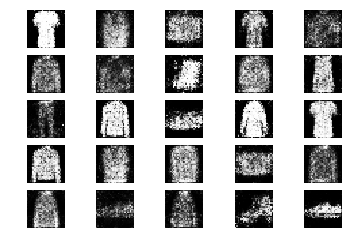

4601 [D loss: 0.617059, acc.: 68.75%] [G loss: 0.928059]
4602 [D loss: 0.679589, acc.: 56.25%] [G loss: 0.865626]
4603 [D loss: 0.655496, acc.: 56.25%] [G loss: 0.968099]
4604 [D loss: 0.597669, acc.: 65.62%] [G loss: 0.886899]
4605 [D loss: 0.698036, acc.: 57.81%] [G loss: 0.947480]
4606 [D loss: 0.619769, acc.: 64.06%] [G loss: 0.918972]
4607 [D loss: 0.672571, acc.: 60.94%] [G loss: 1.010045]
4608 [D loss: 0.611964, acc.: 71.88%] [G loss: 0.912143]
4609 [D loss: 0.630689, acc.: 60.94%] [G loss: 1.017318]
4610 [D loss: 0.613614, acc.: 62.50%] [G loss: 0.940979]
4611 [D loss: 0.685388, acc.: 57.81%] [G loss: 1.037270]
4612 [D loss: 0.657284, acc.: 57.81%] [G loss: 0.894055]
4613 [D loss: 0.702324, acc.: 48.44%] [G loss: 0.932650]
4614 [D loss: 0.658641, acc.: 54.69%] [G loss: 0.959599]
4615 [D loss: 0.690631, acc.: 60.94%] [G loss: 0.954793]
4616 [D loss: 0.715463, acc.: 56.25%] [G loss: 0.861873]
4617 [D loss: 0.641869, acc.: 59.38%] [G loss: 0.926996]
4618 [D loss: 0.616623, acc.: 6

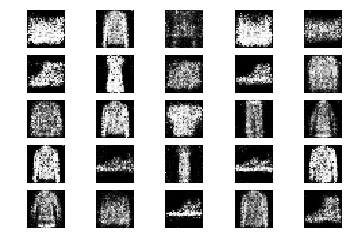

4651 [D loss: 0.641180, acc.: 59.38%] [G loss: 0.970790]
4652 [D loss: 0.650422, acc.: 60.94%] [G loss: 1.019123]
4653 [D loss: 0.618260, acc.: 67.19%] [G loss: 0.994719]
4654 [D loss: 0.629023, acc.: 62.50%] [G loss: 0.869612]
4655 [D loss: 0.647268, acc.: 59.38%] [G loss: 0.890282]
4656 [D loss: 0.662001, acc.: 70.31%] [G loss: 0.865561]
4657 [D loss: 0.624498, acc.: 59.38%] [G loss: 0.878290]
4658 [D loss: 0.688932, acc.: 48.44%] [G loss: 0.852311]
4659 [D loss: 0.671315, acc.: 56.25%] [G loss: 0.933146]
4660 [D loss: 0.662760, acc.: 59.38%] [G loss: 0.886946]
4661 [D loss: 0.652146, acc.: 62.50%] [G loss: 0.900773]
4662 [D loss: 0.666106, acc.: 62.50%] [G loss: 0.879605]
4663 [D loss: 0.658015, acc.: 59.38%] [G loss: 0.838889]
4664 [D loss: 0.682590, acc.: 59.38%] [G loss: 0.885619]
4665 [D loss: 0.598601, acc.: 68.75%] [G loss: 0.876419]
4666 [D loss: 0.622093, acc.: 64.06%] [G loss: 0.880937]
4667 [D loss: 0.655047, acc.: 67.19%] [G loss: 1.081002]
4668 [D loss: 0.612682, acc.: 7

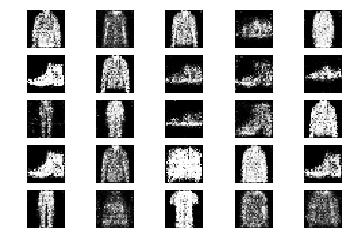

4701 [D loss: 0.640873, acc.: 70.31%] [G loss: 0.970545]
4702 [D loss: 0.690407, acc.: 53.12%] [G loss: 0.917717]
4703 [D loss: 0.604245, acc.: 70.31%] [G loss: 0.920802]
4704 [D loss: 0.665472, acc.: 60.94%] [G loss: 0.913146]
4705 [D loss: 0.660099, acc.: 60.94%] [G loss: 0.945089]
4706 [D loss: 0.625699, acc.: 60.94%] [G loss: 0.946008]
4707 [D loss: 0.597905, acc.: 68.75%] [G loss: 0.874711]
4708 [D loss: 0.685249, acc.: 54.69%] [G loss: 0.963110]
4709 [D loss: 0.678777, acc.: 53.12%] [G loss: 1.041343]
4710 [D loss: 0.619915, acc.: 65.62%] [G loss: 1.026151]
4711 [D loss: 0.672956, acc.: 60.94%] [G loss: 1.083045]
4712 [D loss: 0.683832, acc.: 64.06%] [G loss: 0.980845]
4713 [D loss: 0.631069, acc.: 67.19%] [G loss: 0.936648]
4714 [D loss: 0.629666, acc.: 68.75%] [G loss: 0.965039]
4715 [D loss: 0.580277, acc.: 71.88%] [G loss: 1.040068]
4716 [D loss: 0.699359, acc.: 54.69%] [G loss: 0.953787]
4717 [D loss: 0.635076, acc.: 62.50%] [G loss: 0.926443]
4718 [D loss: 0.664011, acc.: 6

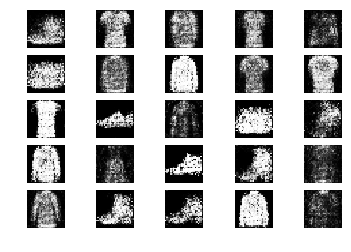

4751 [D loss: 0.672254, acc.: 65.62%] [G loss: 0.974019]
4752 [D loss: 0.650328, acc.: 59.38%] [G loss: 0.989454]
4753 [D loss: 0.619440, acc.: 65.62%] [G loss: 1.091681]
4754 [D loss: 0.662073, acc.: 54.69%] [G loss: 1.004410]
4755 [D loss: 0.667964, acc.: 62.50%] [G loss: 0.935218]
4756 [D loss: 0.644687, acc.: 70.31%] [G loss: 0.915084]
4757 [D loss: 0.644603, acc.: 64.06%] [G loss: 1.031470]
4758 [D loss: 0.643256, acc.: 65.62%] [G loss: 0.950280]
4759 [D loss: 0.616951, acc.: 71.88%] [G loss: 0.985263]
4760 [D loss: 0.633266, acc.: 59.38%] [G loss: 0.941715]
4761 [D loss: 0.598309, acc.: 70.31%] [G loss: 0.843278]
4762 [D loss: 0.608107, acc.: 68.75%] [G loss: 0.949479]
4763 [D loss: 0.623834, acc.: 65.62%] [G loss: 0.958562]
4764 [D loss: 0.646232, acc.: 54.69%] [G loss: 0.835979]
4765 [D loss: 0.647876, acc.: 62.50%] [G loss: 0.919994]
4766 [D loss: 0.633412, acc.: 62.50%] [G loss: 0.977592]
4767 [D loss: 0.578928, acc.: 73.44%] [G loss: 0.997928]
4768 [D loss: 0.694525, acc.: 5

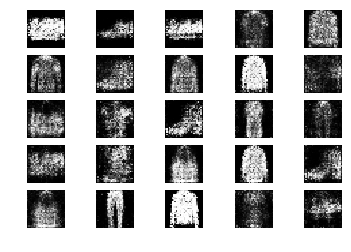

4801 [D loss: 0.707180, acc.: 59.38%] [G loss: 0.971083]
4802 [D loss: 0.716646, acc.: 48.44%] [G loss: 0.907489]
4803 [D loss: 0.602768, acc.: 70.31%] [G loss: 0.963537]
4804 [D loss: 0.720908, acc.: 51.56%] [G loss: 0.926977]
4805 [D loss: 0.664450, acc.: 59.38%] [G loss: 0.931907]
4806 [D loss: 0.686731, acc.: 60.94%] [G loss: 0.969036]
4807 [D loss: 0.622195, acc.: 68.75%] [G loss: 0.944005]
4808 [D loss: 0.658272, acc.: 51.56%] [G loss: 0.989238]
4809 [D loss: 0.681786, acc.: 57.81%] [G loss: 0.849753]
4810 [D loss: 0.691147, acc.: 60.94%] [G loss: 0.995224]
4811 [D loss: 0.690681, acc.: 53.12%] [G loss: 0.993589]
4812 [D loss: 0.651757, acc.: 60.94%] [G loss: 0.974006]
4813 [D loss: 0.656475, acc.: 57.81%] [G loss: 0.888153]
4814 [D loss: 0.615538, acc.: 59.38%] [G loss: 1.023876]
4815 [D loss: 0.612724, acc.: 67.19%] [G loss: 0.903685]
4816 [D loss: 0.663303, acc.: 67.19%] [G loss: 0.819906]
4817 [D loss: 0.645071, acc.: 65.62%] [G loss: 0.918582]
4818 [D loss: 0.652227, acc.: 5

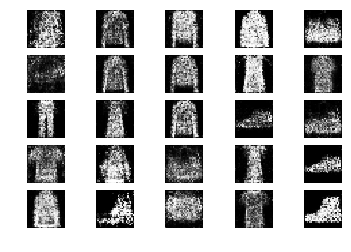

4851 [D loss: 0.658330, acc.: 60.94%] [G loss: 1.018798]
4852 [D loss: 0.625301, acc.: 71.88%] [G loss: 0.956182]
4853 [D loss: 0.628517, acc.: 64.06%] [G loss: 1.003774]
4854 [D loss: 0.623462, acc.: 64.06%] [G loss: 0.903209]
4855 [D loss: 0.620801, acc.: 65.62%] [G loss: 0.827862]
4856 [D loss: 0.608061, acc.: 64.06%] [G loss: 0.943460]
4857 [D loss: 0.621254, acc.: 64.06%] [G loss: 0.886895]
4858 [D loss: 0.650011, acc.: 62.50%] [G loss: 0.967816]
4859 [D loss: 0.613635, acc.: 67.19%] [G loss: 0.850738]
4860 [D loss: 0.668861, acc.: 60.94%] [G loss: 0.870206]
4861 [D loss: 0.673274, acc.: 57.81%] [G loss: 0.876843]
4862 [D loss: 0.588409, acc.: 73.44%] [G loss: 0.809571]
4863 [D loss: 0.635843, acc.: 64.06%] [G loss: 0.791612]
4864 [D loss: 0.694934, acc.: 50.00%] [G loss: 0.911222]
4865 [D loss: 0.604154, acc.: 68.75%] [G loss: 0.877628]
4866 [D loss: 0.637261, acc.: 67.19%] [G loss: 0.992810]
4867 [D loss: 0.557296, acc.: 71.88%] [G loss: 0.937079]
4868 [D loss: 0.650905, acc.: 6

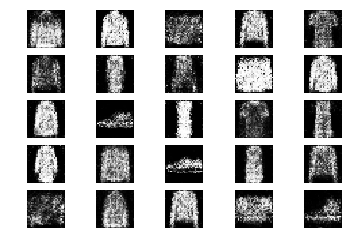

4901 [D loss: 0.669868, acc.: 60.94%] [G loss: 0.966625]
4902 [D loss: 0.636979, acc.: 60.94%] [G loss: 0.867061]
4903 [D loss: 0.609443, acc.: 65.62%] [G loss: 0.949072]
4904 [D loss: 0.768430, acc.: 50.00%] [G loss: 0.848729]
4905 [D loss: 0.578806, acc.: 71.88%] [G loss: 0.968057]
4906 [D loss: 0.647352, acc.: 65.62%] [G loss: 1.015200]
4907 [D loss: 0.690788, acc.: 59.38%] [G loss: 0.924364]
4908 [D loss: 0.618991, acc.: 67.19%] [G loss: 0.875118]
4909 [D loss: 0.674759, acc.: 60.94%] [G loss: 0.946666]
4910 [D loss: 0.555004, acc.: 78.12%] [G loss: 0.933271]
4911 [D loss: 0.653043, acc.: 65.62%] [G loss: 0.988319]
4912 [D loss: 0.653926, acc.: 62.50%] [G loss: 0.877642]
4913 [D loss: 0.652092, acc.: 62.50%] [G loss: 0.853838]
4914 [D loss: 0.641294, acc.: 65.62%] [G loss: 0.909234]
4915 [D loss: 0.639362, acc.: 65.62%] [G loss: 0.862717]
4916 [D loss: 0.621700, acc.: 60.94%] [G loss: 0.840843]
4917 [D loss: 0.552917, acc.: 76.56%] [G loss: 0.992490]
4918 [D loss: 0.674300, acc.: 6

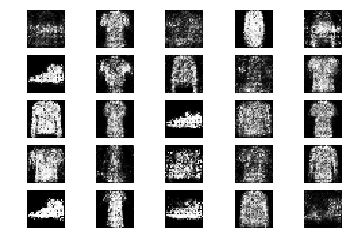

4951 [D loss: 0.615839, acc.: 75.00%] [G loss: 0.972236]
4952 [D loss: 0.629989, acc.: 64.06%] [G loss: 1.015451]
4953 [D loss: 0.650454, acc.: 62.50%] [G loss: 0.940837]
4954 [D loss: 0.705442, acc.: 53.12%] [G loss: 0.886454]
4955 [D loss: 0.682089, acc.: 57.81%] [G loss: 0.892819]
4956 [D loss: 0.620191, acc.: 67.19%] [G loss: 0.844875]
4957 [D loss: 0.664652, acc.: 60.94%] [G loss: 0.891817]
4958 [D loss: 0.624538, acc.: 71.88%] [G loss: 0.965639]
4959 [D loss: 0.692975, acc.: 56.25%] [G loss: 0.899278]
4960 [D loss: 0.661284, acc.: 57.81%] [G loss: 0.926945]
4961 [D loss: 0.670234, acc.: 57.81%] [G loss: 0.882347]
4962 [D loss: 0.611699, acc.: 71.88%] [G loss: 0.958977]
4963 [D loss: 0.616654, acc.: 65.62%] [G loss: 0.964361]
4964 [D loss: 0.652452, acc.: 60.94%] [G loss: 0.933296]
4965 [D loss: 0.686939, acc.: 57.81%] [G loss: 1.020731]
4966 [D loss: 0.682469, acc.: 53.12%] [G loss: 1.023545]
4967 [D loss: 0.653897, acc.: 54.69%] [G loss: 0.957740]
4968 [D loss: 0.572282, acc.: 6

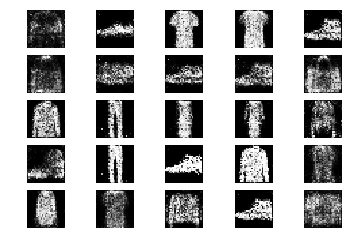

5001 [D loss: 0.726605, acc.: 53.12%] [G loss: 0.988702]
5002 [D loss: 0.684012, acc.: 59.38%] [G loss: 1.011417]
5003 [D loss: 0.715499, acc.: 50.00%] [G loss: 0.945537]
5004 [D loss: 0.698706, acc.: 54.69%] [G loss: 0.900518]
5005 [D loss: 0.646388, acc.: 60.94%] [G loss: 1.024893]
5006 [D loss: 0.545728, acc.: 76.56%] [G loss: 0.933609]
5007 [D loss: 0.618525, acc.: 68.75%] [G loss: 1.098188]
5008 [D loss: 0.600077, acc.: 64.06%] [G loss: 0.960023]
5009 [D loss: 0.625119, acc.: 67.19%] [G loss: 0.906387]
5010 [D loss: 0.574008, acc.: 70.31%] [G loss: 1.077859]
5011 [D loss: 0.647939, acc.: 64.06%] [G loss: 1.007849]
5012 [D loss: 0.679138, acc.: 54.69%] [G loss: 0.942053]
5013 [D loss: 0.621252, acc.: 68.75%] [G loss: 0.910747]
5014 [D loss: 0.675150, acc.: 59.38%] [G loss: 0.927208]
5015 [D loss: 0.584752, acc.: 76.56%] [G loss: 0.890149]
5016 [D loss: 0.622039, acc.: 62.50%] [G loss: 0.955646]
5017 [D loss: 0.654434, acc.: 68.75%] [G loss: 1.006750]
5018 [D loss: 0.752697, acc.: 5

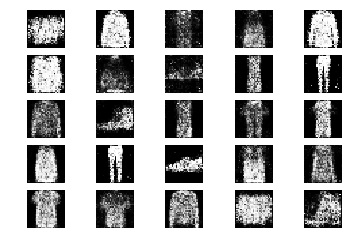

5051 [D loss: 0.638349, acc.: 67.19%] [G loss: 0.926435]
5052 [D loss: 0.595253, acc.: 68.75%] [G loss: 0.967928]
5053 [D loss: 0.611845, acc.: 65.62%] [G loss: 0.900659]
5054 [D loss: 0.631084, acc.: 64.06%] [G loss: 0.981155]
5055 [D loss: 0.641616, acc.: 59.38%] [G loss: 0.998828]
5056 [D loss: 0.658052, acc.: 60.94%] [G loss: 0.951594]
5057 [D loss: 0.595855, acc.: 68.75%] [G loss: 0.907793]
5058 [D loss: 0.721029, acc.: 53.12%] [G loss: 1.003854]
5059 [D loss: 0.661780, acc.: 62.50%] [G loss: 1.005805]
5060 [D loss: 0.666704, acc.: 62.50%] [G loss: 0.971568]
5061 [D loss: 0.734149, acc.: 57.81%] [G loss: 0.921389]
5062 [D loss: 0.599256, acc.: 67.19%] [G loss: 0.928920]
5063 [D loss: 0.724850, acc.: 50.00%] [G loss: 0.958198]
5064 [D loss: 0.622232, acc.: 71.88%] [G loss: 0.867133]
5065 [D loss: 0.643644, acc.: 68.75%] [G loss: 0.983861]
5066 [D loss: 0.742468, acc.: 50.00%] [G loss: 0.947007]
5067 [D loss: 0.677901, acc.: 59.38%] [G loss: 0.897226]
5068 [D loss: 0.593108, acc.: 6

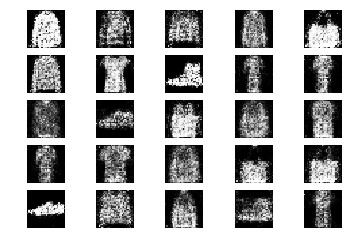

5101 [D loss: 0.636822, acc.: 60.94%] [G loss: 0.944630]
5102 [D loss: 0.636398, acc.: 67.19%] [G loss: 0.896925]
5103 [D loss: 0.674253, acc.: 56.25%] [G loss: 0.858459]
5104 [D loss: 0.730821, acc.: 56.25%] [G loss: 0.917951]
5105 [D loss: 0.697099, acc.: 54.69%] [G loss: 1.019763]
5106 [D loss: 0.684080, acc.: 60.94%] [G loss: 0.948353]
5107 [D loss: 0.661219, acc.: 67.19%] [G loss: 0.991604]
5108 [D loss: 0.605350, acc.: 73.44%] [G loss: 0.970528]
5109 [D loss: 0.718372, acc.: 59.38%] [G loss: 1.039297]
5110 [D loss: 0.605991, acc.: 67.19%] [G loss: 0.983965]
5111 [D loss: 0.614275, acc.: 65.62%] [G loss: 0.892919]
5112 [D loss: 0.644685, acc.: 59.38%] [G loss: 0.976341]
5113 [D loss: 0.648367, acc.: 59.38%] [G loss: 0.998440]
5114 [D loss: 0.710490, acc.: 53.12%] [G loss: 0.996646]
5115 [D loss: 0.636434, acc.: 57.81%] [G loss: 0.966627]
5116 [D loss: 0.697890, acc.: 54.69%] [G loss: 0.946015]
5117 [D loss: 0.695180, acc.: 54.69%] [G loss: 0.925684]
5118 [D loss: 0.640478, acc.: 5

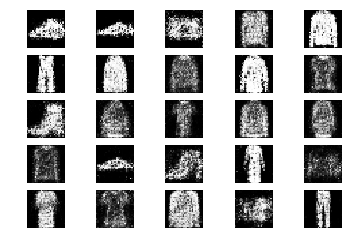

5151 [D loss: 0.720391, acc.: 51.56%] [G loss: 0.908670]
5152 [D loss: 0.678715, acc.: 65.62%] [G loss: 0.903092]
5153 [D loss: 0.608853, acc.: 60.94%] [G loss: 0.997752]
5154 [D loss: 0.709147, acc.: 57.81%] [G loss: 0.831866]
5155 [D loss: 0.692427, acc.: 51.56%] [G loss: 0.881875]
5156 [D loss: 0.680264, acc.: 56.25%] [G loss: 0.877582]
5157 [D loss: 0.674702, acc.: 59.38%] [G loss: 0.971838]
5158 [D loss: 0.628789, acc.: 65.62%] [G loss: 0.927273]
5159 [D loss: 0.643324, acc.: 64.06%] [G loss: 0.969807]
5160 [D loss: 0.692075, acc.: 51.56%] [G loss: 0.988116]
5161 [D loss: 0.663556, acc.: 56.25%] [G loss: 0.855579]
5162 [D loss: 0.680846, acc.: 60.94%] [G loss: 0.893903]
5163 [D loss: 0.642252, acc.: 67.19%] [G loss: 0.985322]
5164 [D loss: 0.585470, acc.: 71.88%] [G loss: 0.892889]
5165 [D loss: 0.651346, acc.: 57.81%] [G loss: 1.025078]
5166 [D loss: 0.629237, acc.: 67.19%] [G loss: 0.931837]
5167 [D loss: 0.653364, acc.: 60.94%] [G loss: 0.991396]
5168 [D loss: 0.695099, acc.: 5

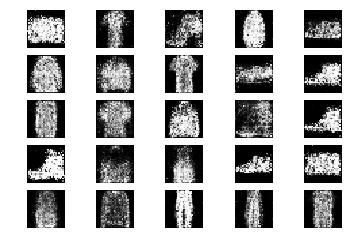

5201 [D loss: 0.609280, acc.: 70.31%] [G loss: 1.007051]
5202 [D loss: 0.654625, acc.: 56.25%] [G loss: 1.000195]
5203 [D loss: 0.691548, acc.: 53.12%] [G loss: 0.983912]
5204 [D loss: 0.686632, acc.: 59.38%] [G loss: 0.995359]
5205 [D loss: 0.665452, acc.: 59.38%] [G loss: 0.949342]
5206 [D loss: 0.651814, acc.: 62.50%] [G loss: 0.837955]
5207 [D loss: 0.651621, acc.: 64.06%] [G loss: 0.884659]
5208 [D loss: 0.662184, acc.: 60.94%] [G loss: 1.009290]
5209 [D loss: 0.621450, acc.: 71.88%] [G loss: 0.988169]
5210 [D loss: 0.646274, acc.: 62.50%] [G loss: 0.930923]
5211 [D loss: 0.591237, acc.: 73.44%] [G loss: 0.989502]
5212 [D loss: 0.622033, acc.: 68.75%] [G loss: 0.968958]
5213 [D loss: 0.623987, acc.: 65.62%] [G loss: 0.967169]
5214 [D loss: 0.672347, acc.: 64.06%] [G loss: 0.952624]
5215 [D loss: 0.668192, acc.: 54.69%] [G loss: 0.878110]
5216 [D loss: 0.612051, acc.: 67.19%] [G loss: 0.938337]
5217 [D loss: 0.662647, acc.: 54.69%] [G loss: 0.951302]
5218 [D loss: 0.589995, acc.: 6

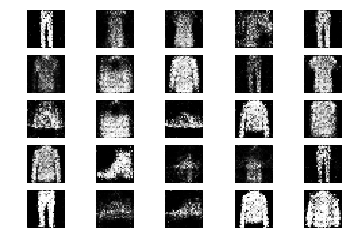

5251 [D loss: 0.629709, acc.: 70.31%] [G loss: 0.974844]
5252 [D loss: 0.653363, acc.: 65.62%] [G loss: 1.022024]
5253 [D loss: 0.663009, acc.: 60.94%] [G loss: 0.941666]
5254 [D loss: 0.616724, acc.: 67.19%] [G loss: 0.916729]
5255 [D loss: 0.652754, acc.: 64.06%] [G loss: 0.873331]
5256 [D loss: 0.629849, acc.: 65.62%] [G loss: 1.027339]
5257 [D loss: 0.571523, acc.: 75.00%] [G loss: 0.942661]
5258 [D loss: 0.645777, acc.: 60.94%] [G loss: 0.950092]
5259 [D loss: 0.704331, acc.: 56.25%] [G loss: 0.930439]
5260 [D loss: 0.632380, acc.: 60.94%] [G loss: 0.969188]
5261 [D loss: 0.625416, acc.: 62.50%] [G loss: 0.945466]
5262 [D loss: 0.644748, acc.: 60.94%] [G loss: 0.940766]
5263 [D loss: 0.585638, acc.: 70.31%] [G loss: 0.968151]
5264 [D loss: 0.674778, acc.: 54.69%] [G loss: 0.990459]
5265 [D loss: 0.612658, acc.: 67.19%] [G loss: 0.929198]
5266 [D loss: 0.685266, acc.: 68.75%] [G loss: 0.893739]
5267 [D loss: 0.722854, acc.: 48.44%] [G loss: 0.851745]
5268 [D loss: 0.601999, acc.: 6

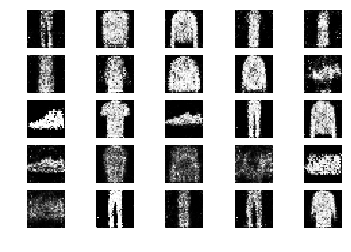

5301 [D loss: 0.694503, acc.: 56.25%] [G loss: 0.956055]
5302 [D loss: 0.645662, acc.: 62.50%] [G loss: 0.854747]
5303 [D loss: 0.658288, acc.: 56.25%] [G loss: 0.859449]
5304 [D loss: 0.699673, acc.: 59.38%] [G loss: 0.985090]
5305 [D loss: 0.638843, acc.: 60.94%] [G loss: 0.860903]
5306 [D loss: 0.736233, acc.: 48.44%] [G loss: 0.964802]
5307 [D loss: 0.623330, acc.: 68.75%] [G loss: 0.954207]
5308 [D loss: 0.668044, acc.: 60.94%] [G loss: 0.890859]
5309 [D loss: 0.635394, acc.: 64.06%] [G loss: 0.961353]
5310 [D loss: 0.661976, acc.: 64.06%] [G loss: 1.006502]
5311 [D loss: 0.668438, acc.: 57.81%] [G loss: 0.965673]
5312 [D loss: 0.616647, acc.: 70.31%] [G loss: 0.986693]
5313 [D loss: 0.721584, acc.: 54.69%] [G loss: 0.871997]
5314 [D loss: 0.734044, acc.: 48.44%] [G loss: 0.895928]
5315 [D loss: 0.659593, acc.: 56.25%] [G loss: 0.874474]
5316 [D loss: 0.595629, acc.: 65.62%] [G loss: 0.957155]
5317 [D loss: 0.600420, acc.: 67.19%] [G loss: 0.912452]
5318 [D loss: 0.673733, acc.: 5

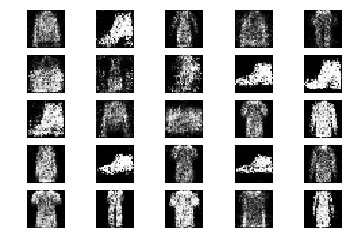

5351 [D loss: 0.600583, acc.: 70.31%] [G loss: 0.909540]
5352 [D loss: 0.578265, acc.: 71.88%] [G loss: 1.001830]
5353 [D loss: 0.684922, acc.: 56.25%] [G loss: 1.007307]
5354 [D loss: 0.651429, acc.: 56.25%] [G loss: 0.928039]
5355 [D loss: 0.635448, acc.: 59.38%] [G loss: 0.981649]
5356 [D loss: 0.626220, acc.: 71.88%] [G loss: 0.922286]
5357 [D loss: 0.649723, acc.: 62.50%] [G loss: 0.912254]
5358 [D loss: 0.734011, acc.: 50.00%] [G loss: 0.932089]
5359 [D loss: 0.668630, acc.: 60.94%] [G loss: 0.929898]
5360 [D loss: 0.574082, acc.: 70.31%] [G loss: 0.974966]
5361 [D loss: 0.669816, acc.: 57.81%] [G loss: 0.943644]
5362 [D loss: 0.658699, acc.: 67.19%] [G loss: 0.966837]
5363 [D loss: 0.631249, acc.: 68.75%] [G loss: 0.974807]
5364 [D loss: 0.620616, acc.: 59.38%] [G loss: 1.018207]
5365 [D loss: 0.578076, acc.: 70.31%] [G loss: 0.960556]
5366 [D loss: 0.672895, acc.: 57.81%] [G loss: 1.040068]
5367 [D loss: 0.684744, acc.: 53.12%] [G loss: 0.931280]
5368 [D loss: 0.685640, acc.: 5

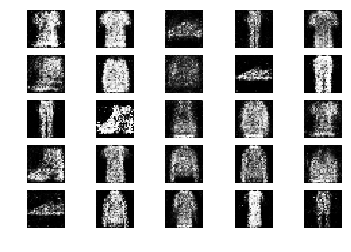

5401 [D loss: 0.659909, acc.: 56.25%] [G loss: 0.864222]
5402 [D loss: 0.647345, acc.: 64.06%] [G loss: 0.857652]
5403 [D loss: 0.614289, acc.: 68.75%] [G loss: 0.901051]
5404 [D loss: 0.665488, acc.: 65.62%] [G loss: 0.793914]
5405 [D loss: 0.670727, acc.: 54.69%] [G loss: 0.850929]
5406 [D loss: 0.716993, acc.: 46.88%] [G loss: 0.927550]
5407 [D loss: 0.662820, acc.: 60.94%] [G loss: 0.989089]
5408 [D loss: 0.601304, acc.: 65.62%] [G loss: 0.935814]
5409 [D loss: 0.648991, acc.: 62.50%] [G loss: 0.968465]
5410 [D loss: 0.662909, acc.: 64.06%] [G loss: 0.914977]
5411 [D loss: 0.660073, acc.: 54.69%] [G loss: 0.885850]
5412 [D loss: 0.629180, acc.: 68.75%] [G loss: 0.837293]
5413 [D loss: 0.647465, acc.: 54.69%] [G loss: 0.880926]
5414 [D loss: 0.623713, acc.: 68.75%] [G loss: 0.836681]
5415 [D loss: 0.662580, acc.: 60.94%] [G loss: 0.886548]
5416 [D loss: 0.570387, acc.: 73.44%] [G loss: 1.005725]
5417 [D loss: 0.642558, acc.: 57.81%] [G loss: 0.989831]
5418 [D loss: 0.617111, acc.: 6

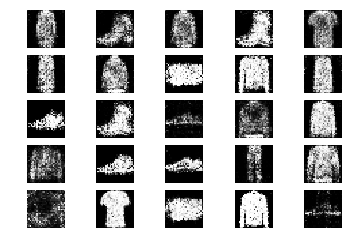

5451 [D loss: 0.636881, acc.: 57.81%] [G loss: 1.025719]
5452 [D loss: 0.671836, acc.: 59.38%] [G loss: 0.906161]
5453 [D loss: 0.656911, acc.: 56.25%] [G loss: 0.992653]
5454 [D loss: 0.652326, acc.: 57.81%] [G loss: 0.964948]
5455 [D loss: 0.616315, acc.: 68.75%] [G loss: 0.961854]
5456 [D loss: 0.676388, acc.: 64.06%] [G loss: 0.910911]
5457 [D loss: 0.599887, acc.: 68.75%] [G loss: 0.917719]
5458 [D loss: 0.611423, acc.: 68.75%] [G loss: 0.976441]
5459 [D loss: 0.593288, acc.: 76.56%] [G loss: 0.955025]
5460 [D loss: 0.667099, acc.: 65.62%] [G loss: 1.000681]
5461 [D loss: 0.635811, acc.: 59.38%] [G loss: 1.043410]
5462 [D loss: 0.652025, acc.: 59.38%] [G loss: 1.009509]
5463 [D loss: 0.607017, acc.: 64.06%] [G loss: 1.001961]
5464 [D loss: 0.672558, acc.: 64.06%] [G loss: 0.933119]
5465 [D loss: 0.629334, acc.: 65.62%] [G loss: 0.896407]
5466 [D loss: 0.620406, acc.: 67.19%] [G loss: 0.863093]
5467 [D loss: 0.675338, acc.: 57.81%] [G loss: 0.858875]
5468 [D loss: 0.618186, acc.: 6

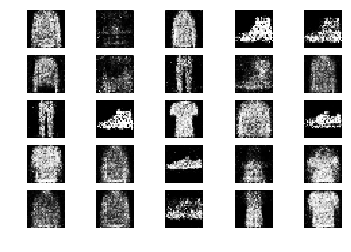

5501 [D loss: 0.636719, acc.: 57.81%] [G loss: 1.044389]
5502 [D loss: 0.658741, acc.: 60.94%] [G loss: 0.892250]
5503 [D loss: 0.680802, acc.: 53.12%] [G loss: 0.982266]
5504 [D loss: 0.620053, acc.: 67.19%] [G loss: 0.889983]
5505 [D loss: 0.660936, acc.: 59.38%] [G loss: 0.981685]
5506 [D loss: 0.629995, acc.: 68.75%] [G loss: 1.002524]
5507 [D loss: 0.613423, acc.: 65.62%] [G loss: 0.969083]
5508 [D loss: 0.647767, acc.: 60.94%] [G loss: 0.917980]
5509 [D loss: 0.640638, acc.: 60.94%] [G loss: 0.967139]
5510 [D loss: 0.585502, acc.: 71.88%] [G loss: 0.897066]
5511 [D loss: 0.617006, acc.: 70.31%] [G loss: 1.019467]
5512 [D loss: 0.600688, acc.: 65.62%] [G loss: 0.987392]
5513 [D loss: 0.602208, acc.: 68.75%] [G loss: 0.957459]
5514 [D loss: 0.647600, acc.: 68.75%] [G loss: 0.826989]
5515 [D loss: 0.710917, acc.: 46.88%] [G loss: 0.930606]
5516 [D loss: 0.628681, acc.: 67.19%] [G loss: 0.902310]
5517 [D loss: 0.670713, acc.: 64.06%] [G loss: 0.954089]
5518 [D loss: 0.578264, acc.: 6

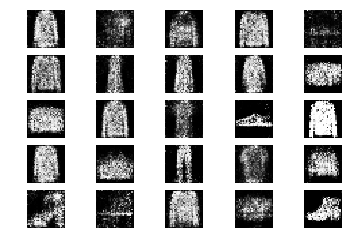

5551 [D loss: 0.594716, acc.: 67.19%] [G loss: 0.921247]
5552 [D loss: 0.684726, acc.: 56.25%] [G loss: 0.952179]
5553 [D loss: 0.700522, acc.: 53.12%] [G loss: 1.005496]
5554 [D loss: 0.657105, acc.: 57.81%] [G loss: 0.966333]
5555 [D loss: 0.712344, acc.: 46.88%] [G loss: 0.998295]
5556 [D loss: 0.621750, acc.: 70.31%] [G loss: 1.011754]
5557 [D loss: 0.634151, acc.: 70.31%] [G loss: 1.019412]
5558 [D loss: 0.686387, acc.: 56.25%] [G loss: 1.055833]
5559 [D loss: 0.610289, acc.: 78.12%] [G loss: 1.018126]
5560 [D loss: 0.651057, acc.: 68.75%] [G loss: 0.985743]
5561 [D loss: 0.659947, acc.: 57.81%] [G loss: 0.856173]
5562 [D loss: 0.645205, acc.: 60.94%] [G loss: 0.961964]
5563 [D loss: 0.626138, acc.: 60.94%] [G loss: 0.826494]
5564 [D loss: 0.599838, acc.: 65.62%] [G loss: 0.825433]
5565 [D loss: 0.593607, acc.: 65.62%] [G loss: 0.949864]
5566 [D loss: 0.677751, acc.: 59.38%] [G loss: 0.897075]
5567 [D loss: 0.654580, acc.: 60.94%] [G loss: 0.961490]
5568 [D loss: 0.624371, acc.: 7

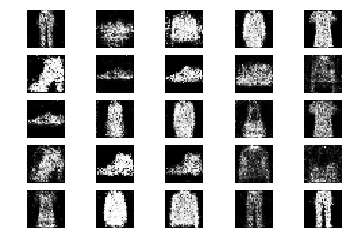

5601 [D loss: 0.625487, acc.: 67.19%] [G loss: 0.784750]
5602 [D loss: 0.634339, acc.: 64.06%] [G loss: 0.873635]
5603 [D loss: 0.616107, acc.: 65.62%] [G loss: 0.983624]
5604 [D loss: 0.623659, acc.: 70.31%] [G loss: 0.917580]
5605 [D loss: 0.660145, acc.: 59.38%] [G loss: 0.882305]
5606 [D loss: 0.611655, acc.: 70.31%] [G loss: 0.980519]
5607 [D loss: 0.651492, acc.: 64.06%] [G loss: 0.982035]
5608 [D loss: 0.618873, acc.: 71.88%] [G loss: 0.998404]
5609 [D loss: 0.667452, acc.: 56.25%] [G loss: 0.946684]
5610 [D loss: 0.724426, acc.: 53.12%] [G loss: 0.802959]
5611 [D loss: 0.639234, acc.: 67.19%] [G loss: 0.808735]
5612 [D loss: 0.714361, acc.: 53.12%] [G loss: 0.902217]
5613 [D loss: 0.620986, acc.: 60.94%] [G loss: 0.892286]
5614 [D loss: 0.651452, acc.: 59.38%] [G loss: 0.923566]
5615 [D loss: 0.651584, acc.: 57.81%] [G loss: 0.918351]
5616 [D loss: 0.655455, acc.: 60.94%] [G loss: 0.928676]
5617 [D loss: 0.566316, acc.: 73.44%] [G loss: 0.981668]
5618 [D loss: 0.614000, acc.: 6

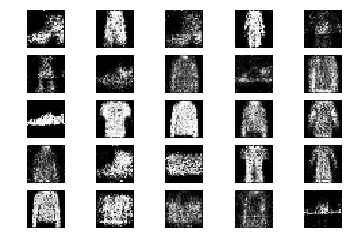

5651 [D loss: 0.659727, acc.: 59.38%] [G loss: 0.940963]
5652 [D loss: 0.681524, acc.: 57.81%] [G loss: 0.961000]
5653 [D loss: 0.636323, acc.: 62.50%] [G loss: 0.968612]
5654 [D loss: 0.623072, acc.: 75.00%] [G loss: 0.964604]
5655 [D loss: 0.675905, acc.: 57.81%] [G loss: 1.022884]
5656 [D loss: 0.677006, acc.: 59.38%] [G loss: 1.009905]
5657 [D loss: 0.588075, acc.: 73.44%] [G loss: 0.999554]
5658 [D loss: 0.681229, acc.: 56.25%] [G loss: 0.924864]
5659 [D loss: 0.564373, acc.: 76.56%] [G loss: 0.913302]
5660 [D loss: 0.628914, acc.: 64.06%] [G loss: 0.910167]
5661 [D loss: 0.642220, acc.: 62.50%] [G loss: 0.917325]
5662 [D loss: 0.624180, acc.: 62.50%] [G loss: 0.877944]
5663 [D loss: 0.739127, acc.: 50.00%] [G loss: 0.902730]
5664 [D loss: 0.621882, acc.: 65.62%] [G loss: 0.925667]
5665 [D loss: 0.619380, acc.: 60.94%] [G loss: 0.989120]
5666 [D loss: 0.665445, acc.: 64.06%] [G loss: 0.938713]
5667 [D loss: 0.565275, acc.: 73.44%] [G loss: 0.917559]
5668 [D loss: 0.695799, acc.: 5

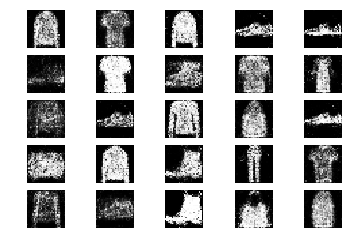

5701 [D loss: 0.578319, acc.: 73.44%] [G loss: 0.950552]
5702 [D loss: 0.682548, acc.: 56.25%] [G loss: 0.875403]
5703 [D loss: 0.641581, acc.: 57.81%] [G loss: 0.840227]
5704 [D loss: 0.699472, acc.: 56.25%] [G loss: 0.932099]
5705 [D loss: 0.682814, acc.: 57.81%] [G loss: 0.961414]
5706 [D loss: 0.629212, acc.: 65.62%] [G loss: 0.900812]
5707 [D loss: 0.625900, acc.: 70.31%] [G loss: 0.925607]
5708 [D loss: 0.609346, acc.: 68.75%] [G loss: 0.901172]
5709 [D loss: 0.612463, acc.: 64.06%] [G loss: 0.948910]
5710 [D loss: 0.664765, acc.: 57.81%] [G loss: 1.002525]
5711 [D loss: 0.632580, acc.: 59.38%] [G loss: 0.941950]
5712 [D loss: 0.633388, acc.: 67.19%] [G loss: 0.916888]
5713 [D loss: 0.677884, acc.: 60.94%] [G loss: 0.880437]
5714 [D loss: 0.625669, acc.: 62.50%] [G loss: 0.936352]
5715 [D loss: 0.635986, acc.: 62.50%] [G loss: 0.942765]
5716 [D loss: 0.655129, acc.: 67.19%] [G loss: 0.986182]
5717 [D loss: 0.667308, acc.: 51.56%] [G loss: 0.882784]
5718 [D loss: 0.625457, acc.: 6

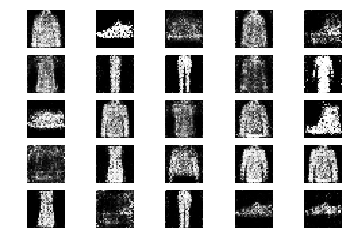

5751 [D loss: 0.621413, acc.: 67.19%] [G loss: 0.890664]
5752 [D loss: 0.629854, acc.: 59.38%] [G loss: 0.936532]
5753 [D loss: 0.686046, acc.: 59.38%] [G loss: 0.916978]
5754 [D loss: 0.648547, acc.: 62.50%] [G loss: 1.026537]
5755 [D loss: 0.641583, acc.: 65.62%] [G loss: 0.927355]
5756 [D loss: 0.618177, acc.: 64.06%] [G loss: 0.974529]
5757 [D loss: 0.570089, acc.: 75.00%] [G loss: 0.983181]
5758 [D loss: 0.628071, acc.: 59.38%] [G loss: 0.925045]
5759 [D loss: 0.651839, acc.: 62.50%] [G loss: 0.907687]
5760 [D loss: 0.676749, acc.: 57.81%] [G loss: 0.843635]
5761 [D loss: 0.686801, acc.: 57.81%] [G loss: 0.921968]
5762 [D loss: 0.598259, acc.: 73.44%] [G loss: 0.961246]
5763 [D loss: 0.664752, acc.: 64.06%] [G loss: 0.950499]
5764 [D loss: 0.596926, acc.: 75.00%] [G loss: 0.970907]
5765 [D loss: 0.648566, acc.: 60.94%] [G loss: 0.949855]
5766 [D loss: 0.638994, acc.: 67.19%] [G loss: 1.002070]
5767 [D loss: 0.632713, acc.: 65.62%] [G loss: 0.917313]
5768 [D loss: 0.660214, acc.: 6

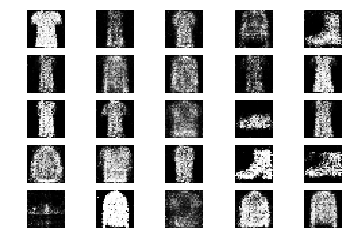

5801 [D loss: 0.671556, acc.: 59.38%] [G loss: 0.909992]
5802 [D loss: 0.638502, acc.: 62.50%] [G loss: 0.988587]
5803 [D loss: 0.644358, acc.: 64.06%] [G loss: 0.896595]
5804 [D loss: 0.609716, acc.: 67.19%] [G loss: 0.871916]
5805 [D loss: 0.669670, acc.: 62.50%] [G loss: 0.865322]
5806 [D loss: 0.716184, acc.: 50.00%] [G loss: 1.052190]
5807 [D loss: 0.584703, acc.: 67.19%] [G loss: 1.101130]
5808 [D loss: 0.695832, acc.: 57.81%] [G loss: 0.965968]
5809 [D loss: 0.679947, acc.: 62.50%] [G loss: 0.951694]
5810 [D loss: 0.667847, acc.: 59.38%] [G loss: 0.984372]
5811 [D loss: 0.697996, acc.: 54.69%] [G loss: 0.897802]
5812 [D loss: 0.605932, acc.: 59.38%] [G loss: 0.947665]
5813 [D loss: 0.614134, acc.: 68.75%] [G loss: 0.962516]
5814 [D loss: 0.701137, acc.: 53.12%] [G loss: 0.911747]
5815 [D loss: 0.656377, acc.: 59.38%] [G loss: 0.997271]
5816 [D loss: 0.559210, acc.: 71.88%] [G loss: 0.861020]
5817 [D loss: 0.662649, acc.: 59.38%] [G loss: 0.893480]
5818 [D loss: 0.646780, acc.: 6

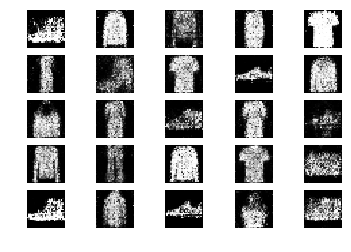

5851 [D loss: 0.596623, acc.: 71.88%] [G loss: 0.992691]
5852 [D loss: 0.653471, acc.: 59.38%] [G loss: 0.897590]
5853 [D loss: 0.713370, acc.: 57.81%] [G loss: 0.967799]
5854 [D loss: 0.693178, acc.: 51.56%] [G loss: 1.027582]
5855 [D loss: 0.630160, acc.: 64.06%] [G loss: 0.905234]
5856 [D loss: 0.722469, acc.: 46.88%] [G loss: 0.898133]
5857 [D loss: 0.680745, acc.: 59.38%] [G loss: 0.946152]
5858 [D loss: 0.600365, acc.: 68.75%] [G loss: 0.975178]
5859 [D loss: 0.623120, acc.: 60.94%] [G loss: 0.936825]
5860 [D loss: 0.642963, acc.: 60.94%] [G loss: 0.937099]
5861 [D loss: 0.632515, acc.: 65.62%] [G loss: 0.930093]
5862 [D loss: 0.663588, acc.: 53.12%] [G loss: 1.036600]
5863 [D loss: 0.688128, acc.: 54.69%] [G loss: 0.976158]
5864 [D loss: 0.667526, acc.: 59.38%] [G loss: 1.042863]
5865 [D loss: 0.650405, acc.: 68.75%] [G loss: 0.856129]
5866 [D loss: 0.609551, acc.: 68.75%] [G loss: 0.943570]
5867 [D loss: 0.694603, acc.: 65.62%] [G loss: 0.873481]
5868 [D loss: 0.608178, acc.: 6

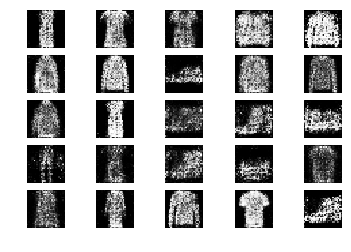

5901 [D loss: 0.624850, acc.: 64.06%] [G loss: 0.942881]
5902 [D loss: 0.630039, acc.: 65.62%] [G loss: 0.966411]
5903 [D loss: 0.660193, acc.: 57.81%] [G loss: 1.015982]
5904 [D loss: 0.599501, acc.: 60.94%] [G loss: 1.043161]
5905 [D loss: 0.642991, acc.: 62.50%] [G loss: 1.218642]
5906 [D loss: 0.650913, acc.: 64.06%] [G loss: 1.032296]
5907 [D loss: 0.666301, acc.: 60.94%] [G loss: 0.911893]
5908 [D loss: 0.593037, acc.: 71.88%] [G loss: 0.882129]
5909 [D loss: 0.584976, acc.: 76.56%] [G loss: 0.930581]
5910 [D loss: 0.664765, acc.: 64.06%] [G loss: 0.943702]
5911 [D loss: 0.647696, acc.: 59.38%] [G loss: 1.012146]
5912 [D loss: 0.639088, acc.: 65.62%] [G loss: 0.832173]
5913 [D loss: 0.635938, acc.: 60.94%] [G loss: 0.912813]
5914 [D loss: 0.595486, acc.: 65.62%] [G loss: 0.908412]
5915 [D loss: 0.641205, acc.: 59.38%] [G loss: 0.912118]
5916 [D loss: 0.598226, acc.: 62.50%] [G loss: 0.973128]
5917 [D loss: 0.609061, acc.: 68.75%] [G loss: 1.062948]
5918 [D loss: 0.521133, acc.: 8

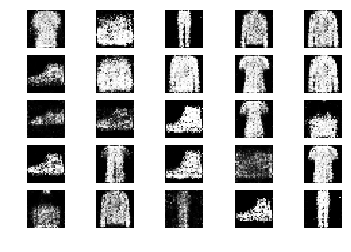

5951 [D loss: 0.611988, acc.: 59.38%] [G loss: 0.940759]
5952 [D loss: 0.616571, acc.: 65.62%] [G loss: 0.852932]
5953 [D loss: 0.608624, acc.: 68.75%] [G loss: 0.924982]
5954 [D loss: 0.613271, acc.: 67.19%] [G loss: 1.050706]
5955 [D loss: 0.691335, acc.: 65.62%] [G loss: 0.910211]
5956 [D loss: 0.673391, acc.: 64.06%] [G loss: 0.973239]
5957 [D loss: 0.613427, acc.: 60.94%] [G loss: 1.008329]
5958 [D loss: 0.540188, acc.: 79.69%] [G loss: 0.943302]
5959 [D loss: 0.641480, acc.: 62.50%] [G loss: 1.024914]
5960 [D loss: 0.651338, acc.: 67.19%] [G loss: 0.831382]
5961 [D loss: 0.722571, acc.: 53.12%] [G loss: 0.897631]
5962 [D loss: 0.614745, acc.: 71.88%] [G loss: 0.828779]
5963 [D loss: 0.672696, acc.: 57.81%] [G loss: 0.930047]
5964 [D loss: 0.633936, acc.: 64.06%] [G loss: 0.902387]
5965 [D loss: 0.627875, acc.: 62.50%] [G loss: 0.962552]
5966 [D loss: 0.740279, acc.: 50.00%] [G loss: 0.900191]
5967 [D loss: 0.675139, acc.: 60.94%] [G loss: 0.933123]
5968 [D loss: 0.630029, acc.: 6

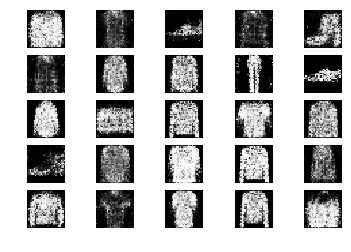

6001 [D loss: 0.585073, acc.: 71.88%] [G loss: 0.930135]
6002 [D loss: 0.665729, acc.: 59.38%] [G loss: 0.913113]
6003 [D loss: 0.691242, acc.: 50.00%] [G loss: 0.931758]
6004 [D loss: 0.581183, acc.: 73.44%] [G loss: 1.002236]
6005 [D loss: 0.750193, acc.: 45.31%] [G loss: 1.020199]
6006 [D loss: 0.662880, acc.: 57.81%] [G loss: 0.945863]
6007 [D loss: 0.617468, acc.: 70.31%] [G loss: 0.959786]
6008 [D loss: 0.623790, acc.: 64.06%] [G loss: 0.969190]
6009 [D loss: 0.637879, acc.: 65.62%] [G loss: 0.942387]
6010 [D loss: 0.631697, acc.: 56.25%] [G loss: 0.988272]
6011 [D loss: 0.612240, acc.: 67.19%] [G loss: 1.016619]
6012 [D loss: 0.620550, acc.: 67.19%] [G loss: 0.951445]
6013 [D loss: 0.658619, acc.: 59.38%] [G loss: 0.838693]
6014 [D loss: 0.712164, acc.: 56.25%] [G loss: 0.906839]
6015 [D loss: 0.683077, acc.: 51.56%] [G loss: 0.970570]
6016 [D loss: 0.622224, acc.: 65.62%] [G loss: 0.913455]
6017 [D loss: 0.643631, acc.: 64.06%] [G loss: 0.896202]
6018 [D loss: 0.695455, acc.: 5

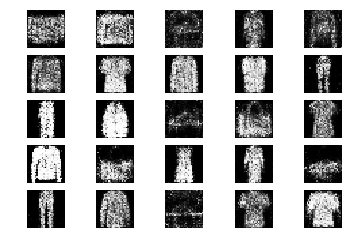

6051 [D loss: 0.662182, acc.: 57.81%] [G loss: 0.935970]
6052 [D loss: 0.675834, acc.: 57.81%] [G loss: 1.057701]
6053 [D loss: 0.628808, acc.: 56.25%] [G loss: 1.001695]
6054 [D loss: 0.591327, acc.: 70.31%] [G loss: 0.931605]
6055 [D loss: 0.615114, acc.: 65.62%] [G loss: 0.961510]
6056 [D loss: 0.567090, acc.: 75.00%] [G loss: 0.995491]
6057 [D loss: 0.618252, acc.: 67.19%] [G loss: 0.946082]
6058 [D loss: 0.603115, acc.: 71.88%] [G loss: 0.988395]
6059 [D loss: 0.730350, acc.: 51.56%] [G loss: 0.905141]
6060 [D loss: 0.645370, acc.: 59.38%] [G loss: 0.934586]
6061 [D loss: 0.683338, acc.: 60.94%] [G loss: 0.913831]
6062 [D loss: 0.616907, acc.: 67.19%] [G loss: 0.974176]
6063 [D loss: 0.607776, acc.: 67.19%] [G loss: 0.891094]
6064 [D loss: 0.662775, acc.: 60.94%] [G loss: 0.949659]
6065 [D loss: 0.617746, acc.: 70.31%] [G loss: 0.915015]
6066 [D loss: 0.585022, acc.: 68.75%] [G loss: 0.936952]
6067 [D loss: 0.633862, acc.: 60.94%] [G loss: 0.982985]
6068 [D loss: 0.585921, acc.: 7

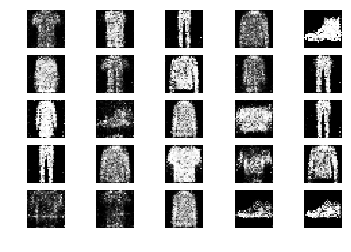

6101 [D loss: 0.639673, acc.: 60.94%] [G loss: 0.914176]
6102 [D loss: 0.601865, acc.: 64.06%] [G loss: 0.912542]
6103 [D loss: 0.609424, acc.: 64.06%] [G loss: 0.958475]
6104 [D loss: 0.713773, acc.: 51.56%] [G loss: 0.875366]
6105 [D loss: 0.587081, acc.: 64.06%] [G loss: 0.929304]
6106 [D loss: 0.691609, acc.: 56.25%] [G loss: 0.928742]
6107 [D loss: 0.670075, acc.: 54.69%] [G loss: 1.011690]
6108 [D loss: 0.610380, acc.: 64.06%] [G loss: 0.947704]
6109 [D loss: 0.630751, acc.: 65.62%] [G loss: 0.959683]
6110 [D loss: 0.620267, acc.: 73.44%] [G loss: 0.919508]
6111 [D loss: 0.722458, acc.: 57.81%] [G loss: 0.887084]
6112 [D loss: 0.599314, acc.: 73.44%] [G loss: 0.847477]
6113 [D loss: 0.675727, acc.: 64.06%] [G loss: 0.892712]
6114 [D loss: 0.635540, acc.: 62.50%] [G loss: 0.888864]
6115 [D loss: 0.678905, acc.: 53.12%] [G loss: 0.873452]
6116 [D loss: 0.662794, acc.: 59.38%] [G loss: 0.921638]
6117 [D loss: 0.610412, acc.: 68.75%] [G loss: 0.871660]
6118 [D loss: 0.681491, acc.: 5

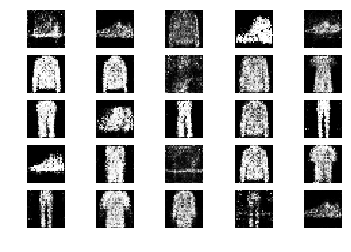

6151 [D loss: 0.651918, acc.: 65.62%] [G loss: 1.030931]
6152 [D loss: 0.612446, acc.: 60.94%] [G loss: 0.978913]
6153 [D loss: 0.564745, acc.: 71.88%] [G loss: 0.945637]
6154 [D loss: 0.576406, acc.: 79.69%] [G loss: 0.898511]
6155 [D loss: 0.751815, acc.: 51.56%] [G loss: 0.954313]
6156 [D loss: 0.670479, acc.: 64.06%] [G loss: 1.003578]
6157 [D loss: 0.687683, acc.: 62.50%] [G loss: 0.911719]
6158 [D loss: 0.653207, acc.: 59.38%] [G loss: 0.943210]
6159 [D loss: 0.662738, acc.: 51.56%] [G loss: 0.978721]
6160 [D loss: 0.534104, acc.: 78.12%] [G loss: 0.937886]
6161 [D loss: 0.653530, acc.: 64.06%] [G loss: 0.944102]
6162 [D loss: 0.621025, acc.: 70.31%] [G loss: 0.858498]
6163 [D loss: 0.705854, acc.: 45.31%] [G loss: 0.877274]
6164 [D loss: 0.619726, acc.: 67.19%] [G loss: 0.897217]
6165 [D loss: 0.678092, acc.: 56.25%] [G loss: 1.033062]
6166 [D loss: 0.670203, acc.: 56.25%] [G loss: 0.927809]
6167 [D loss: 0.657870, acc.: 59.38%] [G loss: 0.885020]
6168 [D loss: 0.630609, acc.: 6

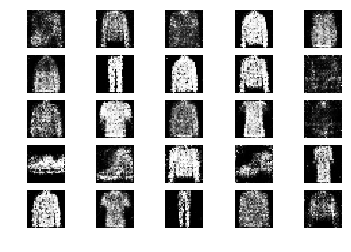

6201 [D loss: 0.645315, acc.: 64.06%] [G loss: 1.037880]
6202 [D loss: 0.625597, acc.: 59.38%] [G loss: 1.040483]
6203 [D loss: 0.727744, acc.: 51.56%] [G loss: 0.969867]
6204 [D loss: 0.604023, acc.: 75.00%] [G loss: 1.005129]
6205 [D loss: 0.586298, acc.: 73.44%] [G loss: 0.931141]
6206 [D loss: 0.659881, acc.: 62.50%] [G loss: 0.966201]
6207 [D loss: 0.680269, acc.: 56.25%] [G loss: 0.956466]
6208 [D loss: 0.619948, acc.: 70.31%] [G loss: 0.961629]
6209 [D loss: 0.644751, acc.: 71.88%] [G loss: 0.876785]
6210 [D loss: 0.597916, acc.: 67.19%] [G loss: 0.969225]
6211 [D loss: 0.607864, acc.: 68.75%] [G loss: 0.972134]
6212 [D loss: 0.611592, acc.: 71.88%] [G loss: 0.919555]
6213 [D loss: 0.679296, acc.: 54.69%] [G loss: 1.051509]
6214 [D loss: 0.660698, acc.: 59.38%] [G loss: 0.950596]
6215 [D loss: 0.614353, acc.: 65.62%] [G loss: 0.896904]
6216 [D loss: 0.625326, acc.: 64.06%] [G loss: 0.977281]
6217 [D loss: 0.698674, acc.: 50.00%] [G loss: 0.941256]
6218 [D loss: 0.647907, acc.: 6

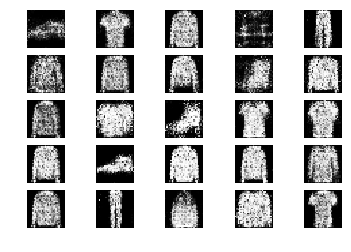

6251 [D loss: 0.603214, acc.: 65.62%] [G loss: 0.901645]
6252 [D loss: 0.717707, acc.: 54.69%] [G loss: 0.882412]
6253 [D loss: 0.607054, acc.: 64.06%] [G loss: 0.901456]
6254 [D loss: 0.672085, acc.: 60.94%] [G loss: 0.769466]
6255 [D loss: 0.656746, acc.: 60.94%] [G loss: 0.956166]
6256 [D loss: 0.682070, acc.: 64.06%] [G loss: 0.958541]
6257 [D loss: 0.665094, acc.: 60.94%] [G loss: 0.932742]
6258 [D loss: 0.617959, acc.: 64.06%] [G loss: 0.978056]
6259 [D loss: 0.652737, acc.: 62.50%] [G loss: 0.979847]
6260 [D loss: 0.629326, acc.: 67.19%] [G loss: 0.874283]
6261 [D loss: 0.608267, acc.: 64.06%] [G loss: 0.916960]
6262 [D loss: 0.527323, acc.: 78.12%] [G loss: 0.909668]
6263 [D loss: 0.671026, acc.: 60.94%] [G loss: 0.871762]
6264 [D loss: 0.747137, acc.: 54.69%] [G loss: 0.936684]
6265 [D loss: 0.628983, acc.: 67.19%] [G loss: 0.986721]
6266 [D loss: 0.618387, acc.: 64.06%] [G loss: 0.868962]
6267 [D loss: 0.734949, acc.: 53.12%] [G loss: 0.932682]
6268 [D loss: 0.660770, acc.: 6

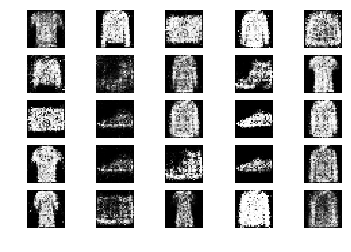

6301 [D loss: 0.625090, acc.: 64.06%] [G loss: 1.011158]
6302 [D loss: 0.559858, acc.: 78.12%] [G loss: 0.960773]
6303 [D loss: 0.591407, acc.: 70.31%] [G loss: 0.930906]
6304 [D loss: 0.641719, acc.: 67.19%] [G loss: 0.908834]
6305 [D loss: 0.632813, acc.: 59.38%] [G loss: 0.918014]
6306 [D loss: 0.640692, acc.: 57.81%] [G loss: 0.930029]
6307 [D loss: 0.710456, acc.: 53.12%] [G loss: 0.946633]
6308 [D loss: 0.624079, acc.: 64.06%] [G loss: 1.044538]
6309 [D loss: 0.655145, acc.: 62.50%] [G loss: 1.008892]
6310 [D loss: 0.612519, acc.: 70.31%] [G loss: 0.936007]
6311 [D loss: 0.557300, acc.: 73.44%] [G loss: 0.975558]
6312 [D loss: 0.674909, acc.: 56.25%] [G loss: 0.971347]
6313 [D loss: 0.653357, acc.: 59.38%] [G loss: 0.967448]
6314 [D loss: 0.600387, acc.: 70.31%] [G loss: 0.896672]
6315 [D loss: 0.635685, acc.: 62.50%] [G loss: 0.990416]
6316 [D loss: 0.693450, acc.: 53.12%] [G loss: 0.925124]
6317 [D loss: 0.674804, acc.: 62.50%] [G loss: 0.869953]
6318 [D loss: 0.676727, acc.: 5

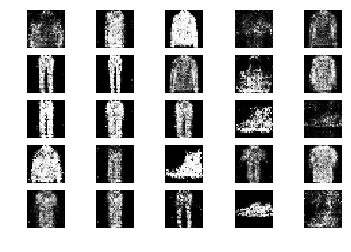

6351 [D loss: 0.607988, acc.: 67.19%] [G loss: 0.915234]
6352 [D loss: 0.621915, acc.: 70.31%] [G loss: 0.911287]
6353 [D loss: 0.611502, acc.: 56.25%] [G loss: 0.966696]
6354 [D loss: 0.636050, acc.: 59.38%] [G loss: 0.926749]
6355 [D loss: 0.659861, acc.: 65.62%] [G loss: 0.872228]
6356 [D loss: 0.641030, acc.: 64.06%] [G loss: 0.918352]
6357 [D loss: 0.596145, acc.: 70.31%] [G loss: 0.916983]
6358 [D loss: 0.650725, acc.: 59.38%] [G loss: 0.939443]
6359 [D loss: 0.632290, acc.: 65.62%] [G loss: 0.972228]
6360 [D loss: 0.617465, acc.: 65.62%] [G loss: 0.935095]
6361 [D loss: 0.574530, acc.: 73.44%] [G loss: 0.846265]
6362 [D loss: 0.592480, acc.: 68.75%] [G loss: 0.919291]
6363 [D loss: 0.609813, acc.: 65.62%] [G loss: 0.894290]
6364 [D loss: 0.642513, acc.: 68.75%] [G loss: 0.919352]
6365 [D loss: 0.614805, acc.: 65.62%] [G loss: 0.941148]
6366 [D loss: 0.688924, acc.: 51.56%] [G loss: 0.891145]
6367 [D loss: 0.632966, acc.: 62.50%] [G loss: 1.008786]
6368 [D loss: 0.581891, acc.: 7

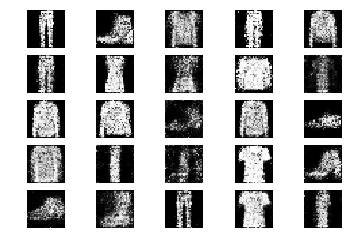

6401 [D loss: 0.650222, acc.: 62.50%] [G loss: 1.069654]
6402 [D loss: 0.637064, acc.: 70.31%] [G loss: 0.886342]
6403 [D loss: 0.591673, acc.: 73.44%] [G loss: 0.928250]
6404 [D loss: 0.639044, acc.: 64.06%] [G loss: 0.945360]
6405 [D loss: 0.694625, acc.: 59.38%] [G loss: 0.904982]
6406 [D loss: 0.586346, acc.: 71.88%] [G loss: 1.007202]
6407 [D loss: 0.652015, acc.: 56.25%] [G loss: 0.840131]
6408 [D loss: 0.679421, acc.: 57.81%] [G loss: 0.927076]
6409 [D loss: 0.561738, acc.: 68.75%] [G loss: 0.917935]
6410 [D loss: 0.680956, acc.: 51.56%] [G loss: 0.953282]
6411 [D loss: 0.625143, acc.: 64.06%] [G loss: 0.955196]
6412 [D loss: 0.654006, acc.: 65.62%] [G loss: 0.908118]
6413 [D loss: 0.629433, acc.: 60.94%] [G loss: 0.916429]
6414 [D loss: 0.679978, acc.: 60.94%] [G loss: 0.848479]
6415 [D loss: 0.604481, acc.: 71.88%] [G loss: 0.820337]
6416 [D loss: 0.704901, acc.: 54.69%] [G loss: 0.835964]
6417 [D loss: 0.726556, acc.: 50.00%] [G loss: 0.969276]
6418 [D loss: 0.634635, acc.: 6

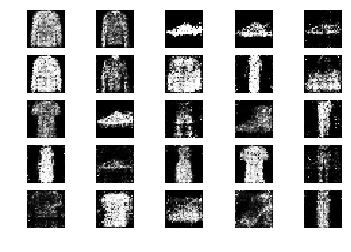

6451 [D loss: 0.651175, acc.: 59.38%] [G loss: 1.066319]
6452 [D loss: 0.715767, acc.: 46.88%] [G loss: 0.936853]
6453 [D loss: 0.667972, acc.: 57.81%] [G loss: 0.865577]
6454 [D loss: 0.685637, acc.: 51.56%] [G loss: 0.874536]
6455 [D loss: 0.667381, acc.: 56.25%] [G loss: 0.937521]
6456 [D loss: 0.662439, acc.: 67.19%] [G loss: 1.016324]
6457 [D loss: 0.665472, acc.: 56.25%] [G loss: 0.901561]
6458 [D loss: 0.619707, acc.: 62.50%] [G loss: 0.911047]
6459 [D loss: 0.624007, acc.: 68.75%] [G loss: 0.895432]
6460 [D loss: 0.641912, acc.: 64.06%] [G loss: 1.020571]
6461 [D loss: 0.678728, acc.: 57.81%] [G loss: 0.803098]
6462 [D loss: 0.612134, acc.: 68.75%] [G loss: 0.907350]
6463 [D loss: 0.692245, acc.: 51.56%] [G loss: 0.841450]
6464 [D loss: 0.612961, acc.: 65.62%] [G loss: 0.890379]
6465 [D loss: 0.642912, acc.: 65.62%] [G loss: 0.908938]
6466 [D loss: 0.644641, acc.: 67.19%] [G loss: 1.099311]
6467 [D loss: 0.649380, acc.: 65.62%] [G loss: 0.948402]
6468 [D loss: 0.639695, acc.: 7

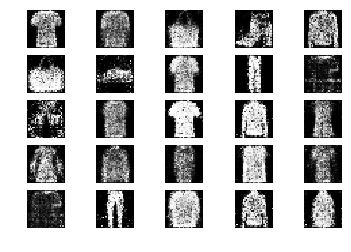

6501 [D loss: 0.678659, acc.: 56.25%] [G loss: 0.950920]
6502 [D loss: 0.630324, acc.: 65.62%] [G loss: 0.863787]
6503 [D loss: 0.647407, acc.: 60.94%] [G loss: 0.907501]
6504 [D loss: 0.611691, acc.: 71.88%] [G loss: 0.900106]
6505 [D loss: 0.662067, acc.: 57.81%] [G loss: 0.951313]
6506 [D loss: 0.765157, acc.: 48.44%] [G loss: 1.145196]
6507 [D loss: 0.648201, acc.: 60.94%] [G loss: 1.044124]
6508 [D loss: 0.599698, acc.: 68.75%] [G loss: 0.987265]
6509 [D loss: 0.678442, acc.: 56.25%] [G loss: 0.941990]
6510 [D loss: 0.624252, acc.: 64.06%] [G loss: 0.954597]
6511 [D loss: 0.581978, acc.: 70.31%] [G loss: 0.998841]
6512 [D loss: 0.675468, acc.: 53.12%] [G loss: 0.904315]
6513 [D loss: 0.584952, acc.: 68.75%] [G loss: 0.890037]
6514 [D loss: 0.801089, acc.: 42.19%] [G loss: 0.828066]
6515 [D loss: 0.592676, acc.: 62.50%] [G loss: 0.823241]
6516 [D loss: 0.743121, acc.: 48.44%] [G loss: 0.813769]
6517 [D loss: 0.639990, acc.: 57.81%] [G loss: 0.991611]
6518 [D loss: 0.668108, acc.: 6

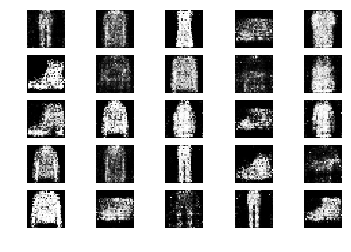

6551 [D loss: 0.602962, acc.: 71.88%] [G loss: 0.927793]
6552 [D loss: 0.687932, acc.: 56.25%] [G loss: 0.818025]
6553 [D loss: 0.595743, acc.: 75.00%] [G loss: 0.892007]
6554 [D loss: 0.656029, acc.: 60.94%] [G loss: 0.863228]
6555 [D loss: 0.695660, acc.: 54.69%] [G loss: 0.879171]
6556 [D loss: 0.572745, acc.: 75.00%] [G loss: 0.942301]
6557 [D loss: 0.655015, acc.: 64.06%] [G loss: 0.975150]
6558 [D loss: 0.644591, acc.: 59.38%] [G loss: 0.995412]
6559 [D loss: 0.634191, acc.: 67.19%] [G loss: 0.973396]
6560 [D loss: 0.615902, acc.: 71.88%] [G loss: 0.870442]
6561 [D loss: 0.672715, acc.: 53.12%] [G loss: 0.943891]
6562 [D loss: 0.694841, acc.: 60.94%] [G loss: 0.933084]
6563 [D loss: 0.623626, acc.: 67.19%] [G loss: 0.937835]
6564 [D loss: 0.616525, acc.: 64.06%] [G loss: 0.937585]
6565 [D loss: 0.644035, acc.: 60.94%] [G loss: 0.816926]
6566 [D loss: 0.696828, acc.: 56.25%] [G loss: 0.941227]
6567 [D loss: 0.637203, acc.: 59.38%] [G loss: 0.920562]
6568 [D loss: 0.664174, acc.: 6

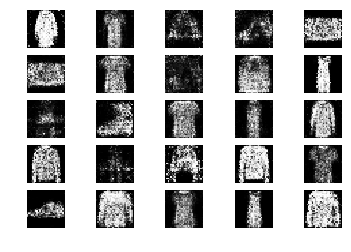

6601 [D loss: 0.627036, acc.: 59.38%] [G loss: 0.980007]
6602 [D loss: 0.608351, acc.: 59.38%] [G loss: 0.975248]
6603 [D loss: 0.633175, acc.: 60.94%] [G loss: 0.884409]
6604 [D loss: 0.698274, acc.: 59.38%] [G loss: 0.903013]
6605 [D loss: 0.570999, acc.: 71.88%] [G loss: 0.916341]
6606 [D loss: 0.719272, acc.: 56.25%] [G loss: 0.950347]
6607 [D loss: 0.621489, acc.: 60.94%] [G loss: 0.926727]
6608 [D loss: 0.713217, acc.: 50.00%] [G loss: 1.002418]
6609 [D loss: 0.651332, acc.: 57.81%] [G loss: 1.057047]
6610 [D loss: 0.667429, acc.: 62.50%] [G loss: 1.009281]
6611 [D loss: 0.643162, acc.: 67.19%] [G loss: 0.911289]
6612 [D loss: 0.640835, acc.: 62.50%] [G loss: 0.848924]
6613 [D loss: 0.611694, acc.: 62.50%] [G loss: 0.885853]
6614 [D loss: 0.578130, acc.: 67.19%] [G loss: 0.884900]
6615 [D loss: 0.659552, acc.: 59.38%] [G loss: 0.953030]
6616 [D loss: 0.697639, acc.: 57.81%] [G loss: 0.957557]
6617 [D loss: 0.645568, acc.: 62.50%] [G loss: 1.111010]
6618 [D loss: 0.679036, acc.: 5

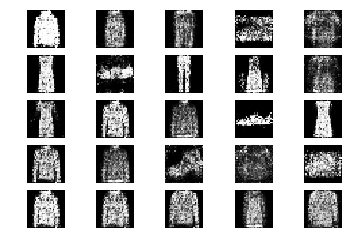

6651 [D loss: 0.647038, acc.: 65.62%] [G loss: 0.934411]
6652 [D loss: 0.601403, acc.: 70.31%] [G loss: 0.925295]
6653 [D loss: 0.578255, acc.: 70.31%] [G loss: 1.021534]
6654 [D loss: 0.604209, acc.: 62.50%] [G loss: 0.973303]
6655 [D loss: 0.585342, acc.: 75.00%] [G loss: 0.999757]
6656 [D loss: 0.681600, acc.: 60.94%] [G loss: 0.942535]
6657 [D loss: 0.613881, acc.: 68.75%] [G loss: 1.048948]
6658 [D loss: 0.683277, acc.: 60.94%] [G loss: 1.076741]
6659 [D loss: 0.681308, acc.: 53.12%] [G loss: 1.047071]
6660 [D loss: 0.643609, acc.: 62.50%] [G loss: 0.972173]
6661 [D loss: 0.701693, acc.: 53.12%] [G loss: 0.993919]
6662 [D loss: 0.697261, acc.: 51.56%] [G loss: 1.002121]
6663 [D loss: 0.574938, acc.: 71.88%] [G loss: 1.032811]
6664 [D loss: 0.635622, acc.: 59.38%] [G loss: 0.942413]
6665 [D loss: 0.667744, acc.: 57.81%] [G loss: 0.853487]
6666 [D loss: 0.727782, acc.: 57.81%] [G loss: 0.912849]
6667 [D loss: 0.679606, acc.: 59.38%] [G loss: 0.917101]
6668 [D loss: 0.686367, acc.: 6

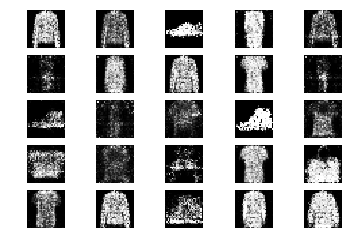

6701 [D loss: 0.636709, acc.: 64.06%] [G loss: 1.010551]
6702 [D loss: 0.587311, acc.: 75.00%] [G loss: 0.985366]
6703 [D loss: 0.714456, acc.: 56.25%] [G loss: 0.937777]
6704 [D loss: 0.635719, acc.: 67.19%] [G loss: 0.843346]
6705 [D loss: 0.688663, acc.: 54.69%] [G loss: 0.847161]
6706 [D loss: 0.585489, acc.: 70.31%] [G loss: 0.916804]
6707 [D loss: 0.608078, acc.: 65.62%] [G loss: 0.936717]
6708 [D loss: 0.592892, acc.: 68.75%] [G loss: 0.972599]
6709 [D loss: 0.662408, acc.: 62.50%] [G loss: 0.914089]
6710 [D loss: 0.606513, acc.: 67.19%] [G loss: 0.847230]
6711 [D loss: 0.689492, acc.: 56.25%] [G loss: 0.898032]
6712 [D loss: 0.709179, acc.: 53.12%] [G loss: 0.946901]
6713 [D loss: 0.653695, acc.: 62.50%] [G loss: 0.944317]
6714 [D loss: 0.618622, acc.: 67.19%] [G loss: 0.909400]
6715 [D loss: 0.644538, acc.: 60.94%] [G loss: 0.972752]
6716 [D loss: 0.702780, acc.: 54.69%] [G loss: 0.946112]
6717 [D loss: 0.653564, acc.: 57.81%] [G loss: 1.061381]
6718 [D loss: 0.604473, acc.: 7

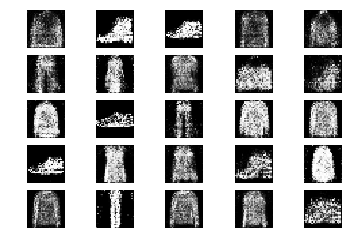

6751 [D loss: 0.697165, acc.: 53.12%] [G loss: 0.880941]
6752 [D loss: 0.688347, acc.: 51.56%] [G loss: 0.960875]
6753 [D loss: 0.610320, acc.: 68.75%] [G loss: 1.000967]
6754 [D loss: 0.629637, acc.: 57.81%] [G loss: 0.957555]
6755 [D loss: 0.593660, acc.: 68.75%] [G loss: 0.963900]
6756 [D loss: 0.649302, acc.: 62.50%] [G loss: 0.964456]
6757 [D loss: 0.639298, acc.: 65.62%] [G loss: 1.022181]
6758 [D loss: 0.649945, acc.: 59.38%] [G loss: 0.984914]
6759 [D loss: 0.697927, acc.: 56.25%] [G loss: 0.959608]
6760 [D loss: 0.713773, acc.: 53.12%] [G loss: 0.942768]
6761 [D loss: 0.635121, acc.: 60.94%] [G loss: 0.987666]
6762 [D loss: 0.617069, acc.: 68.75%] [G loss: 1.001888]
6763 [D loss: 0.671298, acc.: 56.25%] [G loss: 0.932341]
6764 [D loss: 0.665367, acc.: 57.81%] [G loss: 1.031464]
6765 [D loss: 0.650280, acc.: 62.50%] [G loss: 0.864504]
6766 [D loss: 0.639270, acc.: 70.31%] [G loss: 0.934553]
6767 [D loss: 0.599915, acc.: 67.19%] [G loss: 0.941313]
6768 [D loss: 0.625552, acc.: 6

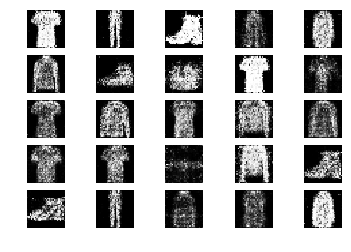

6801 [D loss: 0.643679, acc.: 60.94%] [G loss: 0.894058]
6802 [D loss: 0.664685, acc.: 56.25%] [G loss: 0.926517]
6803 [D loss: 0.696184, acc.: 59.38%] [G loss: 0.914492]
6804 [D loss: 0.664482, acc.: 65.62%] [G loss: 0.904316]
6805 [D loss: 0.642439, acc.: 57.81%] [G loss: 0.876117]
6806 [D loss: 0.626652, acc.: 60.94%] [G loss: 0.872366]
6807 [D loss: 0.636379, acc.: 65.62%] [G loss: 0.811451]
6808 [D loss: 0.599783, acc.: 67.19%] [G loss: 0.987904]
6809 [D loss: 0.715189, acc.: 46.88%] [G loss: 0.994230]
6810 [D loss: 0.655612, acc.: 60.94%] [G loss: 1.029991]
6811 [D loss: 0.633731, acc.: 62.50%] [G loss: 0.957909]
6812 [D loss: 0.679024, acc.: 48.44%] [G loss: 0.996505]
6813 [D loss: 0.673333, acc.: 54.69%] [G loss: 1.024873]
6814 [D loss: 0.703794, acc.: 56.25%] [G loss: 1.018904]
6815 [D loss: 0.606617, acc.: 64.06%] [G loss: 0.947114]
6816 [D loss: 0.593792, acc.: 65.62%] [G loss: 0.937089]
6817 [D loss: 0.636618, acc.: 67.19%] [G loss: 0.908765]
6818 [D loss: 0.688297, acc.: 5

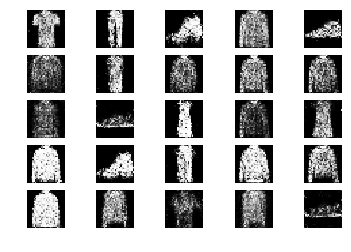

6851 [D loss: 0.661928, acc.: 56.25%] [G loss: 1.034082]
6852 [D loss: 0.647601, acc.: 65.62%] [G loss: 0.979972]
6853 [D loss: 0.666142, acc.: 60.94%] [G loss: 0.960711]
6854 [D loss: 0.666998, acc.: 59.38%] [G loss: 0.881724]
6855 [D loss: 0.617518, acc.: 70.31%] [G loss: 0.965650]
6856 [D loss: 0.639041, acc.: 62.50%] [G loss: 0.938787]
6857 [D loss: 0.647330, acc.: 57.81%] [G loss: 0.915976]
6858 [D loss: 0.608855, acc.: 70.31%] [G loss: 0.874651]
6859 [D loss: 0.650213, acc.: 62.50%] [G loss: 0.925185]
6860 [D loss: 0.662882, acc.: 59.38%] [G loss: 0.870905]
6861 [D loss: 0.642073, acc.: 56.25%] [G loss: 0.992793]
6862 [D loss: 0.638451, acc.: 57.81%] [G loss: 0.949325]
6863 [D loss: 0.657588, acc.: 62.50%] [G loss: 1.004139]
6864 [D loss: 0.648798, acc.: 67.19%] [G loss: 0.899820]
6865 [D loss: 0.747213, acc.: 54.69%] [G loss: 0.873575]
6866 [D loss: 0.687955, acc.: 54.69%] [G loss: 0.874850]
6867 [D loss: 0.654581, acc.: 65.62%] [G loss: 0.936576]
6868 [D loss: 0.568250, acc.: 7

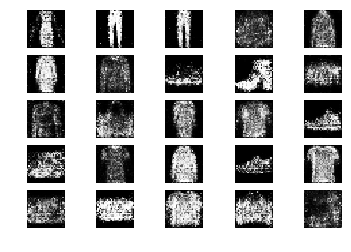

6901 [D loss: 0.698787, acc.: 48.44%] [G loss: 1.043430]
6902 [D loss: 0.665043, acc.: 54.69%] [G loss: 1.016504]
6903 [D loss: 0.613924, acc.: 64.06%] [G loss: 0.929788]
6904 [D loss: 0.578874, acc.: 73.44%] [G loss: 0.993427]
6905 [D loss: 0.649768, acc.: 59.38%] [G loss: 0.924393]
6906 [D loss: 0.690332, acc.: 51.56%] [G loss: 1.011274]
6907 [D loss: 0.695723, acc.: 59.38%] [G loss: 1.037889]
6908 [D loss: 0.734845, acc.: 53.12%] [G loss: 0.916306]
6909 [D loss: 0.677822, acc.: 51.56%] [G loss: 0.950425]
6910 [D loss: 0.651081, acc.: 60.94%] [G loss: 0.869640]
6911 [D loss: 0.657633, acc.: 65.62%] [G loss: 0.929605]
6912 [D loss: 0.629499, acc.: 67.19%] [G loss: 0.947762]
6913 [D loss: 0.648112, acc.: 65.62%] [G loss: 0.899162]
6914 [D loss: 0.592044, acc.: 65.62%] [G loss: 1.025799]
6915 [D loss: 0.654217, acc.: 64.06%] [G loss: 0.897076]
6916 [D loss: 0.669174, acc.: 57.81%] [G loss: 0.915312]
6917 [D loss: 0.697439, acc.: 59.38%] [G loss: 0.931012]
6918 [D loss: 0.622216, acc.: 6

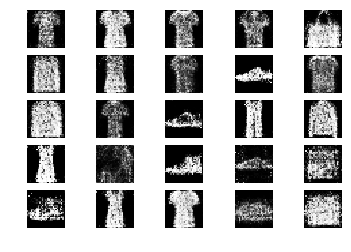

6951 [D loss: 0.578429, acc.: 71.88%] [G loss: 0.943429]
6952 [D loss: 0.667021, acc.: 60.94%] [G loss: 0.805931]
6953 [D loss: 0.617458, acc.: 67.19%] [G loss: 0.865697]
6954 [D loss: 0.655766, acc.: 57.81%] [G loss: 0.889379]
6955 [D loss: 0.581622, acc.: 78.12%] [G loss: 0.826138]
6956 [D loss: 0.713802, acc.: 54.69%] [G loss: 0.926923]
6957 [D loss: 0.648910, acc.: 64.06%] [G loss: 0.877732]
6958 [D loss: 0.659142, acc.: 60.94%] [G loss: 0.928171]
6959 [D loss: 0.614036, acc.: 65.62%] [G loss: 0.891160]
6960 [D loss: 0.570356, acc.: 76.56%] [G loss: 0.946670]
6961 [D loss: 0.662460, acc.: 62.50%] [G loss: 0.982079]
6962 [D loss: 0.648367, acc.: 56.25%] [G loss: 1.076492]
6963 [D loss: 0.621410, acc.: 70.31%] [G loss: 1.010423]
6964 [D loss: 0.628760, acc.: 67.19%] [G loss: 1.027353]
6965 [D loss: 0.663739, acc.: 53.12%] [G loss: 1.031195]
6966 [D loss: 0.658549, acc.: 53.12%] [G loss: 1.080220]
6967 [D loss: 0.592533, acc.: 75.00%] [G loss: 0.972145]
6968 [D loss: 0.640000, acc.: 5

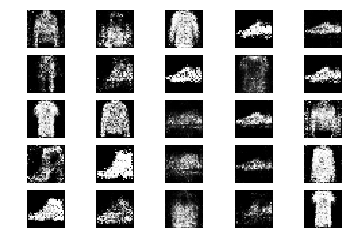

7001 [D loss: 0.676926, acc.: 51.56%] [G loss: 0.979617]
7002 [D loss: 0.676964, acc.: 54.69%] [G loss: 0.948898]
7003 [D loss: 0.656537, acc.: 54.69%] [G loss: 0.889958]
7004 [D loss: 0.652559, acc.: 67.19%] [G loss: 0.926655]
7005 [D loss: 0.678924, acc.: 59.38%] [G loss: 0.896620]
7006 [D loss: 0.641083, acc.: 59.38%] [G loss: 0.853631]
7007 [D loss: 0.592562, acc.: 67.19%] [G loss: 0.926674]
7008 [D loss: 0.676661, acc.: 57.81%] [G loss: 0.913470]
7009 [D loss: 0.606343, acc.: 73.44%] [G loss: 0.848335]
7010 [D loss: 0.695177, acc.: 54.69%] [G loss: 0.852340]
7011 [D loss: 0.675057, acc.: 56.25%] [G loss: 1.014878]
7012 [D loss: 0.693662, acc.: 60.94%] [G loss: 0.952890]
7013 [D loss: 0.612317, acc.: 68.75%] [G loss: 0.826706]
7014 [D loss: 0.675914, acc.: 60.94%] [G loss: 0.917263]
7015 [D loss: 0.670212, acc.: 65.62%] [G loss: 0.987197]
7016 [D loss: 0.538265, acc.: 84.38%] [G loss: 1.062034]
7017 [D loss: 0.692883, acc.: 53.12%] [G loss: 0.955161]
7018 [D loss: 0.749936, acc.: 5

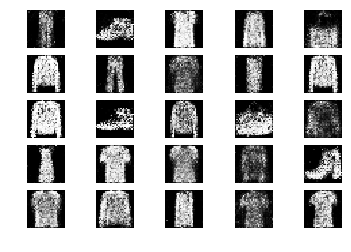

7051 [D loss: 0.625225, acc.: 67.19%] [G loss: 0.990965]
7052 [D loss: 0.662391, acc.: 60.94%] [G loss: 0.917819]
7053 [D loss: 0.669320, acc.: 59.38%] [G loss: 0.830935]
7054 [D loss: 0.660935, acc.: 62.50%] [G loss: 0.919860]
7055 [D loss: 0.692125, acc.: 50.00%] [G loss: 0.873778]
7056 [D loss: 0.585659, acc.: 84.38%] [G loss: 0.880032]
7057 [D loss: 0.628179, acc.: 70.31%] [G loss: 0.931772]
7058 [D loss: 0.612217, acc.: 67.19%] [G loss: 0.828908]
7059 [D loss: 0.597760, acc.: 67.19%] [G loss: 0.964505]
7060 [D loss: 0.650800, acc.: 64.06%] [G loss: 0.839596]
7061 [D loss: 0.578269, acc.: 68.75%] [G loss: 0.956264]
7062 [D loss: 0.624235, acc.: 64.06%] [G loss: 0.881470]
7063 [D loss: 0.616037, acc.: 68.75%] [G loss: 0.796789]
7064 [D loss: 0.730907, acc.: 59.38%] [G loss: 0.843757]
7065 [D loss: 0.681871, acc.: 59.38%] [G loss: 0.811621]
7066 [D loss: 0.655031, acc.: 64.06%] [G loss: 0.900104]
7067 [D loss: 0.611437, acc.: 65.62%] [G loss: 0.919147]
7068 [D loss: 0.639234, acc.: 6

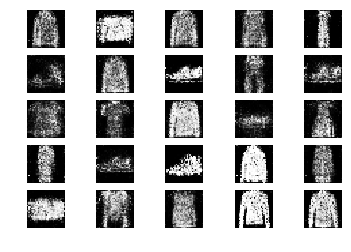

7101 [D loss: 0.677123, acc.: 59.38%] [G loss: 0.964806]
7102 [D loss: 0.706561, acc.: 48.44%] [G loss: 0.947920]
7103 [D loss: 0.588055, acc.: 75.00%] [G loss: 0.939501]
7104 [D loss: 0.687214, acc.: 57.81%] [G loss: 0.927631]
7105 [D loss: 0.610123, acc.: 70.31%] [G loss: 0.879827]
7106 [D loss: 0.671966, acc.: 56.25%] [G loss: 0.992160]
7107 [D loss: 0.623187, acc.: 65.62%] [G loss: 0.995521]
7108 [D loss: 0.604725, acc.: 71.88%] [G loss: 0.906962]
7109 [D loss: 0.678709, acc.: 59.38%] [G loss: 1.041558]
7110 [D loss: 0.592810, acc.: 70.31%] [G loss: 0.953867]
7111 [D loss: 0.652200, acc.: 59.38%] [G loss: 0.994354]
7112 [D loss: 0.653428, acc.: 70.31%] [G loss: 0.970600]
7113 [D loss: 0.658160, acc.: 53.12%] [G loss: 0.973215]
7114 [D loss: 0.595712, acc.: 67.19%] [G loss: 1.042520]
7115 [D loss: 0.697209, acc.: 54.69%] [G loss: 0.894105]
7116 [D loss: 0.658114, acc.: 57.81%] [G loss: 0.984940]
7117 [D loss: 0.633928, acc.: 59.38%] [G loss: 0.963162]
7118 [D loss: 0.655668, acc.: 6

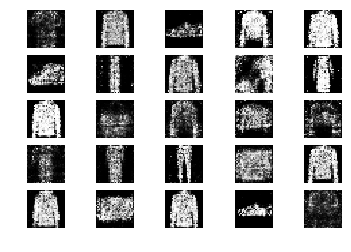

7151 [D loss: 0.654146, acc.: 62.50%] [G loss: 0.880806]
7152 [D loss: 0.649947, acc.: 62.50%] [G loss: 1.036436]
7153 [D loss: 0.710870, acc.: 46.88%] [G loss: 0.982956]
7154 [D loss: 0.703879, acc.: 54.69%] [G loss: 0.954587]
7155 [D loss: 0.664823, acc.: 62.50%] [G loss: 0.984059]
7156 [D loss: 0.670301, acc.: 53.12%] [G loss: 0.969315]
7157 [D loss: 0.675105, acc.: 51.56%] [G loss: 0.919572]
7158 [D loss: 0.590189, acc.: 75.00%] [G loss: 0.983170]
7159 [D loss: 0.632722, acc.: 57.81%] [G loss: 0.966263]
7160 [D loss: 0.655942, acc.: 62.50%] [G loss: 0.903223]
7161 [D loss: 0.672593, acc.: 56.25%] [G loss: 0.920996]
7162 [D loss: 0.660875, acc.: 60.94%] [G loss: 0.851743]
7163 [D loss: 0.599696, acc.: 71.88%] [G loss: 1.000190]
7164 [D loss: 0.621425, acc.: 64.06%] [G loss: 0.932854]
7165 [D loss: 0.695987, acc.: 56.25%] [G loss: 1.003823]
7166 [D loss: 0.628292, acc.: 60.94%] [G loss: 0.944801]
7167 [D loss: 0.592375, acc.: 70.31%] [G loss: 0.868388]
7168 [D loss: 0.618933, acc.: 6

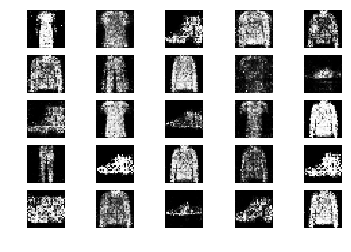

7201 [D loss: 0.666885, acc.: 51.56%] [G loss: 0.969993]
7202 [D loss: 0.678954, acc.: 57.81%] [G loss: 0.937902]
7203 [D loss: 0.613042, acc.: 65.62%] [G loss: 1.003401]
7204 [D loss: 0.598723, acc.: 68.75%] [G loss: 0.919818]
7205 [D loss: 0.672757, acc.: 60.94%] [G loss: 0.996604]
7206 [D loss: 0.666668, acc.: 59.38%] [G loss: 0.909521]
7207 [D loss: 0.613620, acc.: 64.06%] [G loss: 1.001175]
7208 [D loss: 0.635371, acc.: 56.25%] [G loss: 1.009620]
7209 [D loss: 0.641449, acc.: 60.94%] [G loss: 0.951250]
7210 [D loss: 0.652722, acc.: 67.19%] [G loss: 0.994072]
7211 [D loss: 0.654032, acc.: 57.81%] [G loss: 0.982996]
7212 [D loss: 0.661327, acc.: 65.62%] [G loss: 0.929387]
7213 [D loss: 0.625398, acc.: 67.19%] [G loss: 0.944494]
7214 [D loss: 0.620091, acc.: 68.75%] [G loss: 0.909721]
7215 [D loss: 0.635452, acc.: 62.50%] [G loss: 0.912294]
7216 [D loss: 0.628877, acc.: 71.88%] [G loss: 1.012137]
7217 [D loss: 0.620548, acc.: 60.94%] [G loss: 1.098609]
7218 [D loss: 0.657149, acc.: 6

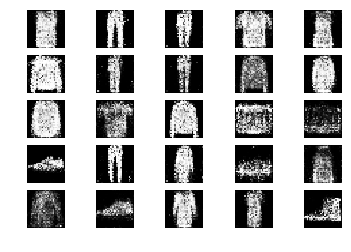

7251 [D loss: 0.625801, acc.: 65.62%] [G loss: 1.013078]
7252 [D loss: 0.690958, acc.: 60.94%] [G loss: 0.934476]
7253 [D loss: 0.700945, acc.: 46.88%] [G loss: 0.925240]
7254 [D loss: 0.626132, acc.: 62.50%] [G loss: 0.998242]
7255 [D loss: 0.617117, acc.: 71.88%] [G loss: 1.002201]
7256 [D loss: 0.655853, acc.: 64.06%] [G loss: 0.916066]
7257 [D loss: 0.588325, acc.: 65.62%] [G loss: 1.025896]
7258 [D loss: 0.654677, acc.: 59.38%] [G loss: 0.909125]
7259 [D loss: 0.611493, acc.: 64.06%] [G loss: 0.957308]
7260 [D loss: 0.650514, acc.: 60.94%] [G loss: 0.926920]
7261 [D loss: 0.611621, acc.: 76.56%] [G loss: 0.935618]
7262 [D loss: 0.706116, acc.: 54.69%] [G loss: 0.868801]
7263 [D loss: 0.706860, acc.: 57.81%] [G loss: 0.952774]
7264 [D loss: 0.640545, acc.: 64.06%] [G loss: 1.009163]
7265 [D loss: 0.573703, acc.: 73.44%] [G loss: 0.914089]
7266 [D loss: 0.656614, acc.: 62.50%] [G loss: 0.915448]
7267 [D loss: 0.707149, acc.: 59.38%] [G loss: 0.952495]
7268 [D loss: 0.646424, acc.: 6

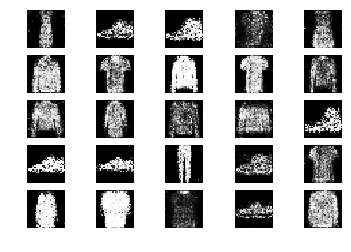

7301 [D loss: 0.668276, acc.: 56.25%] [G loss: 0.997151]
7302 [D loss: 0.681443, acc.: 56.25%] [G loss: 1.040556]
7303 [D loss: 0.635661, acc.: 65.62%] [G loss: 0.930126]
7304 [D loss: 0.651359, acc.: 65.62%] [G loss: 0.926132]
7305 [D loss: 0.584529, acc.: 68.75%] [G loss: 0.877983]
7306 [D loss: 0.590646, acc.: 68.75%] [G loss: 0.890414]
7307 [D loss: 0.713754, acc.: 64.06%] [G loss: 0.824867]
7308 [D loss: 0.686685, acc.: 53.12%] [G loss: 0.994976]
7309 [D loss: 0.580425, acc.: 71.88%] [G loss: 0.954434]
7310 [D loss: 0.694347, acc.: 57.81%] [G loss: 0.925586]
7311 [D loss: 0.616854, acc.: 68.75%] [G loss: 0.959283]
7312 [D loss: 0.647184, acc.: 53.12%] [G loss: 0.986267]
7313 [D loss: 0.712204, acc.: 54.69%] [G loss: 0.977589]
7314 [D loss: 0.744117, acc.: 56.25%] [G loss: 0.956082]
7315 [D loss: 0.687511, acc.: 57.81%] [G loss: 0.993324]
7316 [D loss: 0.645902, acc.: 56.25%] [G loss: 0.969511]
7317 [D loss: 0.626372, acc.: 64.06%] [G loss: 0.967230]
7318 [D loss: 0.663903, acc.: 5

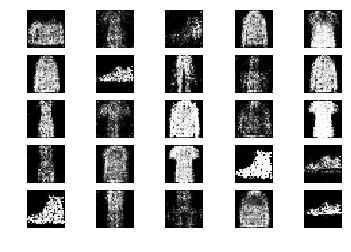

7351 [D loss: 0.595692, acc.: 67.19%] [G loss: 1.028892]
7352 [D loss: 0.656517, acc.: 59.38%] [G loss: 0.928008]
7353 [D loss: 0.597434, acc.: 71.88%] [G loss: 1.028428]
7354 [D loss: 0.623510, acc.: 68.75%] [G loss: 1.032977]
7355 [D loss: 0.613193, acc.: 62.50%] [G loss: 0.946460]
7356 [D loss: 0.635266, acc.: 67.19%] [G loss: 0.908814]
7357 [D loss: 0.672444, acc.: 62.50%] [G loss: 0.896548]
7358 [D loss: 0.683822, acc.: 54.69%] [G loss: 0.914103]
7359 [D loss: 0.588210, acc.: 70.31%] [G loss: 0.890675]
7360 [D loss: 0.621501, acc.: 67.19%] [G loss: 0.862694]
7361 [D loss: 0.762327, acc.: 42.19%] [G loss: 0.863190]
7362 [D loss: 0.680488, acc.: 53.12%] [G loss: 0.959298]
7363 [D loss: 0.652070, acc.: 59.38%] [G loss: 1.084293]
7364 [D loss: 0.603038, acc.: 65.62%] [G loss: 1.000588]
7365 [D loss: 0.641974, acc.: 60.94%] [G loss: 0.994578]
7366 [D loss: 0.597769, acc.: 75.00%] [G loss: 1.028508]
7367 [D loss: 0.578140, acc.: 68.75%] [G loss: 0.997593]
7368 [D loss: 0.614947, acc.: 6

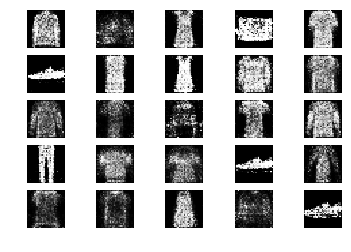

7401 [D loss: 0.615106, acc.: 68.75%] [G loss: 0.855492]
7402 [D loss: 0.645210, acc.: 67.19%] [G loss: 0.945346]
7403 [D loss: 0.688192, acc.: 59.38%] [G loss: 0.885369]
7404 [D loss: 0.636179, acc.: 62.50%] [G loss: 0.839545]
7405 [D loss: 0.659953, acc.: 51.56%] [G loss: 0.850183]
7406 [D loss: 0.652496, acc.: 57.81%] [G loss: 0.861597]
7407 [D loss: 0.571445, acc.: 75.00%] [G loss: 0.893874]
7408 [D loss: 0.622022, acc.: 59.38%] [G loss: 0.955278]
7409 [D loss: 0.574900, acc.: 71.88%] [G loss: 0.961151]
7410 [D loss: 0.587830, acc.: 71.88%] [G loss: 1.008379]
7411 [D loss: 0.684000, acc.: 59.38%] [G loss: 0.960106]
7412 [D loss: 0.663774, acc.: 56.25%] [G loss: 1.150995]
7413 [D loss: 0.684044, acc.: 62.50%] [G loss: 1.043060]
7414 [D loss: 0.618857, acc.: 60.94%] [G loss: 1.037261]
7415 [D loss: 0.623357, acc.: 64.06%] [G loss: 0.998015]
7416 [D loss: 0.586436, acc.: 75.00%] [G loss: 0.943813]
7417 [D loss: 0.686328, acc.: 56.25%] [G loss: 0.874679]
7418 [D loss: 0.645484, acc.: 5

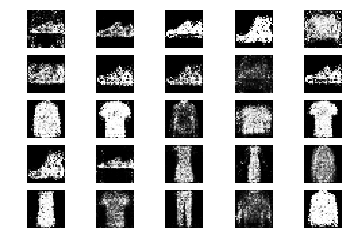

7451 [D loss: 0.656465, acc.: 64.06%] [G loss: 1.038193]
7452 [D loss: 0.613581, acc.: 68.75%] [G loss: 0.968406]
7453 [D loss: 0.604248, acc.: 68.75%] [G loss: 0.991645]
7454 [D loss: 0.636104, acc.: 64.06%] [G loss: 0.958105]
7455 [D loss: 0.708876, acc.: 54.69%] [G loss: 0.907591]
7456 [D loss: 0.631308, acc.: 62.50%] [G loss: 0.890631]
7457 [D loss: 0.687928, acc.: 60.94%] [G loss: 0.793900]
7458 [D loss: 0.666305, acc.: 59.38%] [G loss: 0.849589]
7459 [D loss: 0.572938, acc.: 70.31%] [G loss: 0.927184]
7460 [D loss: 0.716363, acc.: 54.69%] [G loss: 0.855061]
7461 [D loss: 0.649670, acc.: 59.38%] [G loss: 0.956744]
7462 [D loss: 0.635004, acc.: 65.62%] [G loss: 0.970223]
7463 [D loss: 0.697121, acc.: 51.56%] [G loss: 1.033337]
7464 [D loss: 0.641842, acc.: 62.50%] [G loss: 0.920922]
7465 [D loss: 0.626482, acc.: 60.94%] [G loss: 1.092973]
7466 [D loss: 0.733417, acc.: 46.88%] [G loss: 0.882541]
7467 [D loss: 0.617436, acc.: 71.88%] [G loss: 0.931527]
7468 [D loss: 0.602656, acc.: 7

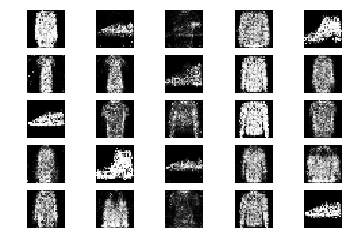

7501 [D loss: 0.563874, acc.: 70.31%] [G loss: 0.958280]
7502 [D loss: 0.634139, acc.: 60.94%] [G loss: 0.952773]
7503 [D loss: 0.639694, acc.: 53.12%] [G loss: 1.016316]
7504 [D loss: 0.555701, acc.: 75.00%] [G loss: 0.929119]
7505 [D loss: 0.622563, acc.: 70.31%] [G loss: 1.010887]
7506 [D loss: 0.605428, acc.: 73.44%] [G loss: 0.979649]
7507 [D loss: 0.581277, acc.: 68.75%] [G loss: 0.845670]
7508 [D loss: 0.598269, acc.: 64.06%] [G loss: 0.971355]
7509 [D loss: 0.641848, acc.: 68.75%] [G loss: 0.965210]
7510 [D loss: 0.633025, acc.: 68.75%] [G loss: 1.014210]
7511 [D loss: 0.594537, acc.: 70.31%] [G loss: 0.938644]
7512 [D loss: 0.630056, acc.: 67.19%] [G loss: 0.921639]
7513 [D loss: 0.639168, acc.: 60.94%] [G loss: 0.898351]
7514 [D loss: 0.711998, acc.: 54.69%] [G loss: 0.892684]
7515 [D loss: 0.634280, acc.: 59.38%] [G loss: 0.883257]
7516 [D loss: 0.636717, acc.: 64.06%] [G loss: 0.950310]
7517 [D loss: 0.630042, acc.: 62.50%] [G loss: 0.837310]
7518 [D loss: 0.623095, acc.: 6

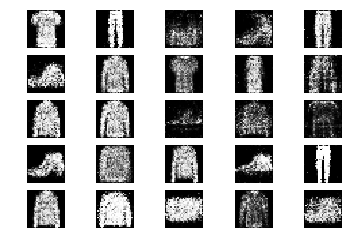

7551 [D loss: 0.613957, acc.: 70.31%] [G loss: 0.890383]
7552 [D loss: 0.661130, acc.: 62.50%] [G loss: 0.866579]
7553 [D loss: 0.543414, acc.: 76.56%] [G loss: 0.985270]
7554 [D loss: 0.689844, acc.: 60.94%] [G loss: 0.950517]
7555 [D loss: 0.685601, acc.: 57.81%] [G loss: 0.957163]
7556 [D loss: 0.642575, acc.: 57.81%] [G loss: 0.961181]
7557 [D loss: 0.639647, acc.: 62.50%] [G loss: 0.898728]
7558 [D loss: 0.634356, acc.: 60.94%] [G loss: 1.058425]
7559 [D loss: 0.584509, acc.: 73.44%] [G loss: 0.970168]
7560 [D loss: 0.604088, acc.: 67.19%] [G loss: 1.002345]
7561 [D loss: 0.704943, acc.: 50.00%] [G loss: 0.894412]
7562 [D loss: 0.650128, acc.: 60.94%] [G loss: 0.884045]
7563 [D loss: 0.661870, acc.: 59.38%] [G loss: 0.847506]
7564 [D loss: 0.643750, acc.: 71.88%] [G loss: 0.968822]
7565 [D loss: 0.573318, acc.: 71.88%] [G loss: 0.893268]
7566 [D loss: 0.589470, acc.: 70.31%] [G loss: 1.003123]
7567 [D loss: 0.680303, acc.: 57.81%] [G loss: 0.940386]
7568 [D loss: 0.648331, acc.: 6

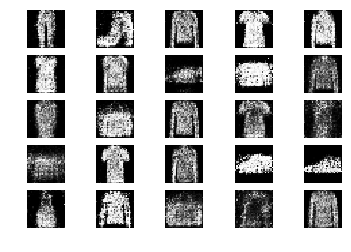

7601 [D loss: 0.635733, acc.: 53.12%] [G loss: 0.997858]
7602 [D loss: 0.623806, acc.: 67.19%] [G loss: 0.977965]
7603 [D loss: 0.590546, acc.: 71.88%] [G loss: 0.923930]
7604 [D loss: 0.690757, acc.: 57.81%] [G loss: 0.901864]
7605 [D loss: 0.611516, acc.: 70.31%] [G loss: 0.967523]
7606 [D loss: 0.606558, acc.: 65.62%] [G loss: 0.945834]
7607 [D loss: 0.651411, acc.: 62.50%] [G loss: 0.895804]
7608 [D loss: 0.667504, acc.: 62.50%] [G loss: 0.867946]
7609 [D loss: 0.604675, acc.: 64.06%] [G loss: 0.947862]
7610 [D loss: 0.576087, acc.: 70.31%] [G loss: 0.957152]
7611 [D loss: 0.530962, acc.: 82.81%] [G loss: 0.937768]
7612 [D loss: 0.616451, acc.: 59.38%] [G loss: 0.917157]
7613 [D loss: 0.694326, acc.: 67.19%] [G loss: 1.004905]
7614 [D loss: 0.601670, acc.: 68.75%] [G loss: 0.990113]
7615 [D loss: 0.603686, acc.: 71.88%] [G loss: 0.933313]
7616 [D loss: 0.651965, acc.: 67.19%] [G loss: 0.917339]
7617 [D loss: 0.651874, acc.: 62.50%] [G loss: 0.966438]
7618 [D loss: 0.626449, acc.: 6

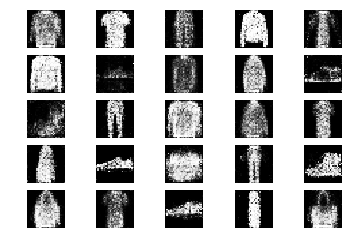

7651 [D loss: 0.595345, acc.: 71.88%] [G loss: 0.912137]
7652 [D loss: 0.649617, acc.: 60.94%] [G loss: 0.967570]
7653 [D loss: 0.656047, acc.: 60.94%] [G loss: 1.005191]
7654 [D loss: 0.606330, acc.: 64.06%] [G loss: 1.024426]
7655 [D loss: 0.658835, acc.: 57.81%] [G loss: 1.054425]
7656 [D loss: 0.642694, acc.: 73.44%] [G loss: 0.988827]
7657 [D loss: 0.727846, acc.: 56.25%] [G loss: 0.973196]
7658 [D loss: 0.693776, acc.: 53.12%] [G loss: 0.911360]
7659 [D loss: 0.636325, acc.: 56.25%] [G loss: 0.906369]
7660 [D loss: 0.621441, acc.: 62.50%] [G loss: 0.966706]
7661 [D loss: 0.598149, acc.: 65.62%] [G loss: 0.835005]
7662 [D loss: 0.613699, acc.: 62.50%] [G loss: 0.939447]
7663 [D loss: 0.670627, acc.: 54.69%] [G loss: 0.896404]
7664 [D loss: 0.671241, acc.: 54.69%] [G loss: 1.103046]
7665 [D loss: 0.612221, acc.: 60.94%] [G loss: 0.944430]
7666 [D loss: 0.684072, acc.: 56.25%] [G loss: 0.847079]
7667 [D loss: 0.621695, acc.: 59.38%] [G loss: 0.887680]
7668 [D loss: 0.661857, acc.: 6

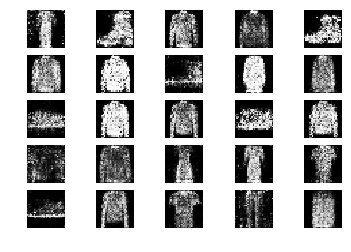

7701 [D loss: 0.577672, acc.: 71.88%] [G loss: 0.957649]
7702 [D loss: 0.680781, acc.: 57.81%] [G loss: 0.961208]
7703 [D loss: 0.661362, acc.: 56.25%] [G loss: 0.909178]
7704 [D loss: 0.638668, acc.: 67.19%] [G loss: 0.890374]
7705 [D loss: 0.582200, acc.: 71.88%] [G loss: 0.950536]
7706 [D loss: 0.618148, acc.: 68.75%] [G loss: 0.897352]
7707 [D loss: 0.634204, acc.: 62.50%] [G loss: 0.915486]
7708 [D loss: 0.607271, acc.: 62.50%] [G loss: 0.976784]
7709 [D loss: 0.623355, acc.: 62.50%] [G loss: 0.920437]
7710 [D loss: 0.631621, acc.: 59.38%] [G loss: 0.947922]
7711 [D loss: 0.618038, acc.: 65.62%] [G loss: 0.933622]
7712 [D loss: 0.666726, acc.: 57.81%] [G loss: 0.936752]
7713 [D loss: 0.627208, acc.: 65.62%] [G loss: 0.951720]
7714 [D loss: 0.668832, acc.: 51.56%] [G loss: 1.023553]
7715 [D loss: 0.670778, acc.: 59.38%] [G loss: 0.881778]
7716 [D loss: 0.646442, acc.: 64.06%] [G loss: 0.925778]
7717 [D loss: 0.610797, acc.: 57.81%] [G loss: 0.949341]
7718 [D loss: 0.538063, acc.: 7

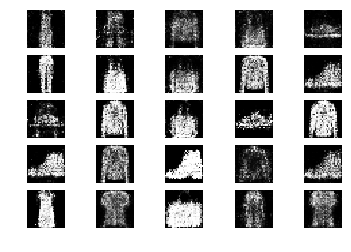

7751 [D loss: 0.634741, acc.: 65.62%] [G loss: 0.871376]
7752 [D loss: 0.709284, acc.: 57.81%] [G loss: 0.865515]
7753 [D loss: 0.680457, acc.: 51.56%] [G loss: 0.915951]
7754 [D loss: 0.669719, acc.: 59.38%] [G loss: 0.947558]
7755 [D loss: 0.614504, acc.: 65.62%] [G loss: 0.821115]
7756 [D loss: 0.723581, acc.: 53.12%] [G loss: 0.900126]
7757 [D loss: 0.659173, acc.: 64.06%] [G loss: 0.798066]
7758 [D loss: 0.693796, acc.: 54.69%] [G loss: 0.861623]
7759 [D loss: 0.718103, acc.: 48.44%] [G loss: 1.009465]
7760 [D loss: 0.633022, acc.: 62.50%] [G loss: 0.987761]
7761 [D loss: 0.623109, acc.: 59.38%] [G loss: 0.941034]
7762 [D loss: 0.700707, acc.: 59.38%] [G loss: 0.974324]
7763 [D loss: 0.594890, acc.: 65.62%] [G loss: 0.958861]
7764 [D loss: 0.693597, acc.: 56.25%] [G loss: 0.935135]
7765 [D loss: 0.659252, acc.: 56.25%] [G loss: 0.980564]
7766 [D loss: 0.611441, acc.: 62.50%] [G loss: 0.947627]
7767 [D loss: 0.712327, acc.: 57.81%] [G loss: 0.914461]
7768 [D loss: 0.646004, acc.: 6

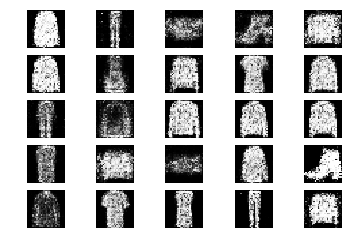

7801 [D loss: 0.717936, acc.: 54.69%] [G loss: 0.847765]
7802 [D loss: 0.604123, acc.: 75.00%] [G loss: 0.908357]
7803 [D loss: 0.663960, acc.: 57.81%] [G loss: 0.828071]
7804 [D loss: 0.623058, acc.: 64.06%] [G loss: 0.946511]
7805 [D loss: 0.633111, acc.: 64.06%] [G loss: 0.811033]
7806 [D loss: 0.614517, acc.: 65.62%] [G loss: 0.838497]
7807 [D loss: 0.686644, acc.: 56.25%] [G loss: 0.808506]
7808 [D loss: 0.672547, acc.: 59.38%] [G loss: 0.959522]
7809 [D loss: 0.662142, acc.: 67.19%] [G loss: 0.964975]
7810 [D loss: 0.629335, acc.: 65.62%] [G loss: 0.942041]
7811 [D loss: 0.630705, acc.: 68.75%] [G loss: 0.934142]
7812 [D loss: 0.581403, acc.: 71.88%] [G loss: 0.983895]
7813 [D loss: 0.637373, acc.: 64.06%] [G loss: 0.971466]
7814 [D loss: 0.638480, acc.: 59.38%] [G loss: 0.878478]
7815 [D loss: 0.580486, acc.: 75.00%] [G loss: 0.941452]
7816 [D loss: 0.595555, acc.: 67.19%] [G loss: 0.860713]
7817 [D loss: 0.680601, acc.: 62.50%] [G loss: 0.935435]
7818 [D loss: 0.656714, acc.: 5

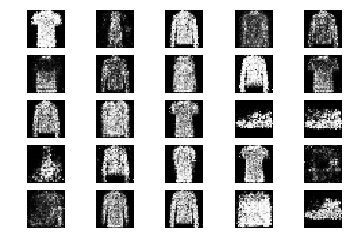

7851 [D loss: 0.615888, acc.: 73.44%] [G loss: 1.033233]
7852 [D loss: 0.665449, acc.: 62.50%] [G loss: 1.011003]
7853 [D loss: 0.603516, acc.: 70.31%] [G loss: 1.013596]
7854 [D loss: 0.692776, acc.: 54.69%] [G loss: 0.857370]
7855 [D loss: 0.625126, acc.: 67.19%] [G loss: 0.987766]
7856 [D loss: 0.647344, acc.: 68.75%] [G loss: 0.950520]
7857 [D loss: 0.650031, acc.: 59.38%] [G loss: 0.934938]
7858 [D loss: 0.632932, acc.: 67.19%] [G loss: 1.005479]
7859 [D loss: 0.599934, acc.: 71.88%] [G loss: 0.936104]
7860 [D loss: 0.614508, acc.: 75.00%] [G loss: 0.897717]
7861 [D loss: 0.636130, acc.: 65.62%] [G loss: 0.873902]
7862 [D loss: 0.647066, acc.: 62.50%] [G loss: 0.952237]
7863 [D loss: 0.598191, acc.: 70.31%] [G loss: 0.954523]
7864 [D loss: 0.624509, acc.: 67.19%] [G loss: 0.916131]
7865 [D loss: 0.651779, acc.: 65.62%] [G loss: 0.932956]
7866 [D loss: 0.655769, acc.: 62.50%] [G loss: 1.073889]
7867 [D loss: 0.638723, acc.: 64.06%] [G loss: 1.068895]
7868 [D loss: 0.628550, acc.: 7

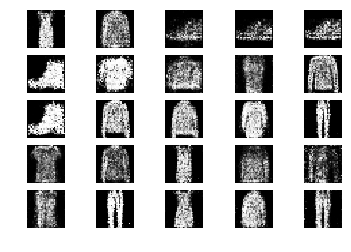

7901 [D loss: 0.729163, acc.: 50.00%] [G loss: 0.923737]
7902 [D loss: 0.664137, acc.: 57.81%] [G loss: 0.939980]
7903 [D loss: 0.698675, acc.: 54.69%] [G loss: 0.876682]
7904 [D loss: 0.623788, acc.: 64.06%] [G loss: 0.868412]
7905 [D loss: 0.674047, acc.: 54.69%] [G loss: 0.956739]
7906 [D loss: 0.724964, acc.: 56.25%] [G loss: 0.962154]
7907 [D loss: 0.646084, acc.: 60.94%] [G loss: 1.007783]
7908 [D loss: 0.640476, acc.: 54.69%] [G loss: 0.964823]
7909 [D loss: 0.650987, acc.: 57.81%] [G loss: 0.962983]
7910 [D loss: 0.695639, acc.: 51.56%] [G loss: 0.883973]
7911 [D loss: 0.642585, acc.: 59.38%] [G loss: 0.928661]
7912 [D loss: 0.656982, acc.: 64.06%] [G loss: 0.915199]
7913 [D loss: 0.641924, acc.: 60.94%] [G loss: 0.951503]
7914 [D loss: 0.631961, acc.: 67.19%] [G loss: 0.942993]
7915 [D loss: 0.553766, acc.: 76.56%] [G loss: 0.997982]
7916 [D loss: 0.658534, acc.: 62.50%] [G loss: 0.898502]
7917 [D loss: 0.625752, acc.: 59.38%] [G loss: 0.945876]
7918 [D loss: 0.613372, acc.: 6

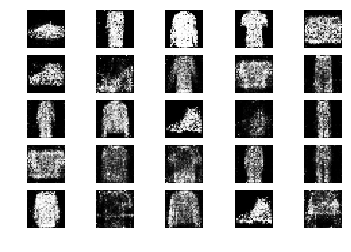

7951 [D loss: 0.642880, acc.: 65.62%] [G loss: 0.978767]
7952 [D loss: 0.657137, acc.: 64.06%] [G loss: 0.886904]
7953 [D loss: 0.596839, acc.: 70.31%] [G loss: 0.932828]
7954 [D loss: 0.606196, acc.: 65.62%] [G loss: 1.022900]
7955 [D loss: 0.660590, acc.: 62.50%] [G loss: 0.926727]
7956 [D loss: 0.634530, acc.: 60.94%] [G loss: 0.989070]
7957 [D loss: 0.622386, acc.: 62.50%] [G loss: 0.967365]
7958 [D loss: 0.670493, acc.: 56.25%] [G loss: 0.899483]
7959 [D loss: 0.643361, acc.: 64.06%] [G loss: 0.843874]
7960 [D loss: 0.681332, acc.: 64.06%] [G loss: 0.930654]
7961 [D loss: 0.671291, acc.: 56.25%] [G loss: 0.869662]
7962 [D loss: 0.594795, acc.: 71.88%] [G loss: 0.818475]
7963 [D loss: 0.602907, acc.: 68.75%] [G loss: 0.865474]
7964 [D loss: 0.585191, acc.: 73.44%] [G loss: 0.923026]
7965 [D loss: 0.658386, acc.: 56.25%] [G loss: 0.962916]
7966 [D loss: 0.690253, acc.: 53.12%] [G loss: 1.045102]
7967 [D loss: 0.605283, acc.: 70.31%] [G loss: 0.950345]
7968 [D loss: 0.597015, acc.: 7

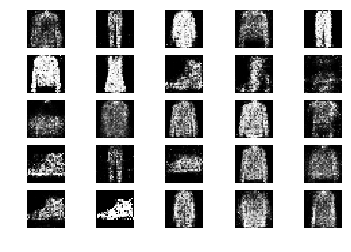

8001 [D loss: 0.584453, acc.: 68.75%] [G loss: 1.009019]
8002 [D loss: 0.686916, acc.: 53.12%] [G loss: 0.992480]
8003 [D loss: 0.646944, acc.: 59.38%] [G loss: 0.898679]
8004 [D loss: 0.642989, acc.: 59.38%] [G loss: 0.984663]
8005 [D loss: 0.601442, acc.: 68.75%] [G loss: 1.008525]
8006 [D loss: 0.700913, acc.: 54.69%] [G loss: 0.956818]
8007 [D loss: 0.683580, acc.: 56.25%] [G loss: 0.927975]
8008 [D loss: 0.608633, acc.: 67.19%] [G loss: 0.961897]
8009 [D loss: 0.648489, acc.: 64.06%] [G loss: 0.927432]
8010 [D loss: 0.658127, acc.: 67.19%] [G loss: 0.965328]
8011 [D loss: 0.640753, acc.: 60.94%] [G loss: 0.886289]
8012 [D loss: 0.653784, acc.: 65.62%] [G loss: 1.059184]
8013 [D loss: 0.621466, acc.: 64.06%] [G loss: 0.910684]
8014 [D loss: 0.587502, acc.: 70.31%] [G loss: 0.997573]
8015 [D loss: 0.622088, acc.: 68.75%] [G loss: 1.000323]
8016 [D loss: 0.577460, acc.: 70.31%] [G loss: 0.925149]
8017 [D loss: 0.681244, acc.: 54.69%] [G loss: 0.942852]
8018 [D loss: 0.612203, acc.: 6

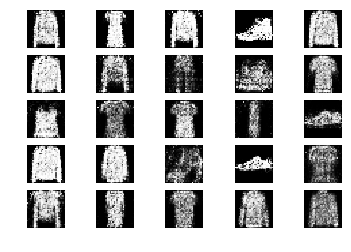

8051 [D loss: 0.612023, acc.: 62.50%] [G loss: 1.079283]
8052 [D loss: 0.662736, acc.: 59.38%] [G loss: 0.898262]
8053 [D loss: 0.590203, acc.: 68.75%] [G loss: 0.997375]
8054 [D loss: 0.747849, acc.: 43.75%] [G loss: 0.892405]
8055 [D loss: 0.658426, acc.: 57.81%] [G loss: 0.998428]
8056 [D loss: 0.660511, acc.: 62.50%] [G loss: 0.891082]
8057 [D loss: 0.713725, acc.: 53.12%] [G loss: 0.888936]
8058 [D loss: 0.622959, acc.: 62.50%] [G loss: 0.993893]
8059 [D loss: 0.694476, acc.: 54.69%] [G loss: 1.002453]
8060 [D loss: 0.637502, acc.: 65.62%] [G loss: 0.971329]
8061 [D loss: 0.695305, acc.: 54.69%] [G loss: 0.941777]
8062 [D loss: 0.653980, acc.: 68.75%] [G loss: 0.876842]
8063 [D loss: 0.688815, acc.: 56.25%] [G loss: 0.932113]
8064 [D loss: 0.668356, acc.: 57.81%] [G loss: 0.940721]
8065 [D loss: 0.636185, acc.: 67.19%] [G loss: 0.880498]
8066 [D loss: 0.579663, acc.: 79.69%] [G loss: 0.892644]
8067 [D loss: 0.684908, acc.: 48.44%] [G loss: 0.934203]
8068 [D loss: 0.680303, acc.: 5

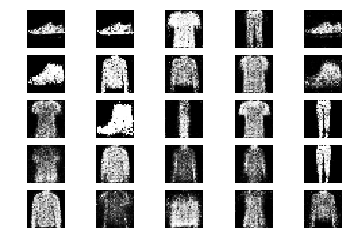

8101 [D loss: 0.619192, acc.: 65.62%] [G loss: 0.851126]
8102 [D loss: 0.626662, acc.: 71.88%] [G loss: 0.936852]
8103 [D loss: 0.645390, acc.: 60.94%] [G loss: 0.958518]
8104 [D loss: 0.638708, acc.: 60.94%] [G loss: 0.863236]
8105 [D loss: 0.609190, acc.: 68.75%] [G loss: 0.841235]
8106 [D loss: 0.756504, acc.: 51.56%] [G loss: 0.940904]
8107 [D loss: 0.664914, acc.: 54.69%] [G loss: 0.893465]
8108 [D loss: 0.624177, acc.: 64.06%] [G loss: 0.970070]
8109 [D loss: 0.705267, acc.: 53.12%] [G loss: 0.954167]
8110 [D loss: 0.586527, acc.: 68.75%] [G loss: 0.845836]
8111 [D loss: 0.637594, acc.: 60.94%] [G loss: 0.896599]
8112 [D loss: 0.600878, acc.: 64.06%] [G loss: 0.933363]
8113 [D loss: 0.677757, acc.: 57.81%] [G loss: 1.027825]
8114 [D loss: 0.662274, acc.: 57.81%] [G loss: 0.868693]
8115 [D loss: 0.615498, acc.: 64.06%] [G loss: 1.038409]
8116 [D loss: 0.655988, acc.: 57.81%] [G loss: 0.852393]
8117 [D loss: 0.624285, acc.: 57.81%] [G loss: 0.886136]
8118 [D loss: 0.708880, acc.: 5

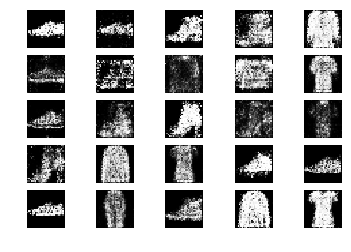

8151 [D loss: 0.686677, acc.: 53.12%] [G loss: 0.908242]
8152 [D loss: 0.611265, acc.: 68.75%] [G loss: 0.953922]
8153 [D loss: 0.720491, acc.: 54.69%] [G loss: 1.051444]
8154 [D loss: 0.613772, acc.: 70.31%] [G loss: 0.960820]
8155 [D loss: 0.638409, acc.: 64.06%] [G loss: 0.998349]
8156 [D loss: 0.613498, acc.: 67.19%] [G loss: 0.944368]
8157 [D loss: 0.681383, acc.: 62.50%] [G loss: 1.006167]
8158 [D loss: 0.559429, acc.: 73.44%] [G loss: 0.977875]
8159 [D loss: 0.633325, acc.: 68.75%] [G loss: 1.016417]
8160 [D loss: 0.635416, acc.: 62.50%] [G loss: 1.084920]
8161 [D loss: 0.603043, acc.: 65.62%] [G loss: 0.994212]
8162 [D loss: 0.645823, acc.: 67.19%] [G loss: 1.071970]
8163 [D loss: 0.573643, acc.: 73.44%] [G loss: 0.999679]
8164 [D loss: 0.697093, acc.: 51.56%] [G loss: 1.030319]
8165 [D loss: 0.657984, acc.: 56.25%] [G loss: 0.929983]
8166 [D loss: 0.616805, acc.: 71.88%] [G loss: 0.865503]
8167 [D loss: 0.681311, acc.: 56.25%] [G loss: 0.843782]
8168 [D loss: 0.630534, acc.: 6

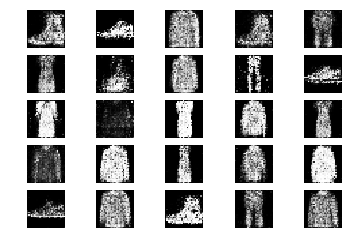

8201 [D loss: 0.564822, acc.: 75.00%] [G loss: 0.866858]
8202 [D loss: 0.674191, acc.: 60.94%] [G loss: 0.968492]
8203 [D loss: 0.674581, acc.: 56.25%] [G loss: 0.897854]
8204 [D loss: 0.682616, acc.: 59.38%] [G loss: 0.847624]
8205 [D loss: 0.747438, acc.: 48.44%] [G loss: 0.969635]
8206 [D loss: 0.665204, acc.: 60.94%] [G loss: 0.929028]
8207 [D loss: 0.639725, acc.: 64.06%] [G loss: 0.937765]
8208 [D loss: 0.651944, acc.: 70.31%] [G loss: 0.981741]
8209 [D loss: 0.689802, acc.: 51.56%] [G loss: 0.906429]
8210 [D loss: 0.661724, acc.: 60.94%] [G loss: 0.936693]
8211 [D loss: 0.628282, acc.: 64.06%] [G loss: 0.901870]
8212 [D loss: 0.619656, acc.: 68.75%] [G loss: 0.967246]
8213 [D loss: 0.591740, acc.: 70.31%] [G loss: 0.975561]
8214 [D loss: 0.638273, acc.: 62.50%] [G loss: 0.876064]
8215 [D loss: 0.651606, acc.: 60.94%] [G loss: 0.919629]
8216 [D loss: 0.646353, acc.: 59.38%] [G loss: 0.899674]
8217 [D loss: 0.611971, acc.: 70.31%] [G loss: 0.826557]
8218 [D loss: 0.684595, acc.: 5

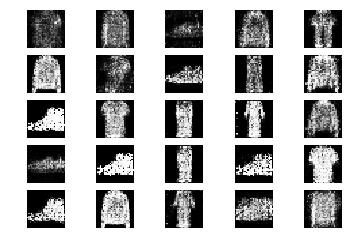

8251 [D loss: 0.678227, acc.: 59.38%] [G loss: 0.942628]
8252 [D loss: 0.604619, acc.: 71.88%] [G loss: 0.908243]
8253 [D loss: 0.626481, acc.: 65.62%] [G loss: 0.877545]
8254 [D loss: 0.662408, acc.: 68.75%] [G loss: 0.866020]
8255 [D loss: 0.673891, acc.: 53.12%] [G loss: 0.907548]
8256 [D loss: 0.660892, acc.: 56.25%] [G loss: 1.018730]
8257 [D loss: 0.659017, acc.: 64.06%] [G loss: 0.955090]
8258 [D loss: 0.652031, acc.: 64.06%] [G loss: 0.855159]
8259 [D loss: 0.571000, acc.: 73.44%] [G loss: 0.897376]
8260 [D loss: 0.639202, acc.: 60.94%] [G loss: 0.958680]
8261 [D loss: 0.580128, acc.: 71.88%] [G loss: 0.904230]
8262 [D loss: 0.636333, acc.: 67.19%] [G loss: 0.821769]
8263 [D loss: 0.601561, acc.: 62.50%] [G loss: 0.920231]
8264 [D loss: 0.596726, acc.: 70.31%] [G loss: 0.863973]
8265 [D loss: 0.611160, acc.: 68.75%] [G loss: 0.837168]
8266 [D loss: 0.590221, acc.: 76.56%] [G loss: 0.971600]
8267 [D loss: 0.689773, acc.: 56.25%] [G loss: 0.945605]
8268 [D loss: 0.715509, acc.: 5

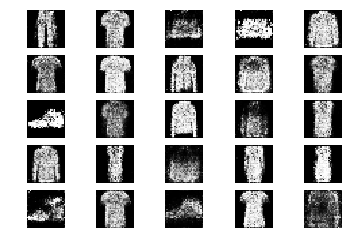

8301 [D loss: 0.683641, acc.: 64.06%] [G loss: 0.818577]
8302 [D loss: 0.663247, acc.: 64.06%] [G loss: 0.883349]
8303 [D loss: 0.621658, acc.: 62.50%] [G loss: 0.905498]
8304 [D loss: 0.683164, acc.: 50.00%] [G loss: 0.850989]
8305 [D loss: 0.668855, acc.: 56.25%] [G loss: 0.887885]
8306 [D loss: 0.658759, acc.: 59.38%] [G loss: 0.908681]
8307 [D loss: 0.704765, acc.: 51.56%] [G loss: 0.825461]
8308 [D loss: 0.673397, acc.: 60.94%] [G loss: 0.949361]
8309 [D loss: 0.647167, acc.: 65.62%] [G loss: 0.978041]
8310 [D loss: 0.626602, acc.: 64.06%] [G loss: 0.936927]
8311 [D loss: 0.622882, acc.: 70.31%] [G loss: 0.870092]
8312 [D loss: 0.723360, acc.: 51.56%] [G loss: 0.888744]
8313 [D loss: 0.546375, acc.: 79.69%] [G loss: 0.901291]
8314 [D loss: 0.724072, acc.: 50.00%] [G loss: 0.905883]
8315 [D loss: 0.625469, acc.: 62.50%] [G loss: 0.880510]
8316 [D loss: 0.700701, acc.: 60.94%] [G loss: 0.922347]
8317 [D loss: 0.661077, acc.: 60.94%] [G loss: 0.922931]
8318 [D loss: 0.669238, acc.: 5

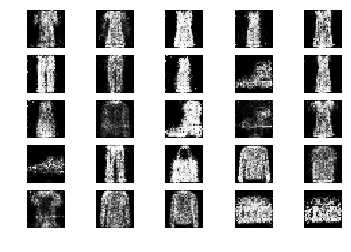

8351 [D loss: 0.666729, acc.: 60.94%] [G loss: 0.883719]
8352 [D loss: 0.719327, acc.: 54.69%] [G loss: 0.912540]
8353 [D loss: 0.669882, acc.: 56.25%] [G loss: 0.980128]
8354 [D loss: 0.655988, acc.: 57.81%] [G loss: 0.964794]
8355 [D loss: 0.598909, acc.: 67.19%] [G loss: 0.970122]
8356 [D loss: 0.707335, acc.: 51.56%] [G loss: 0.987213]
8357 [D loss: 0.699123, acc.: 56.25%] [G loss: 0.896530]
8358 [D loss: 0.705647, acc.: 54.69%] [G loss: 0.921608]
8359 [D loss: 0.677723, acc.: 57.81%] [G loss: 0.910142]
8360 [D loss: 0.646038, acc.: 67.19%] [G loss: 0.959583]
8361 [D loss: 0.595488, acc.: 71.88%] [G loss: 0.823230]
8362 [D loss: 0.628991, acc.: 62.50%] [G loss: 0.869335]
8363 [D loss: 0.637144, acc.: 60.94%] [G loss: 0.871113]
8364 [D loss: 0.605644, acc.: 60.94%] [G loss: 0.909114]
8365 [D loss: 0.638544, acc.: 57.81%] [G loss: 0.888395]
8366 [D loss: 0.627689, acc.: 62.50%] [G loss: 0.968952]
8367 [D loss: 0.680329, acc.: 53.12%] [G loss: 0.947511]
8368 [D loss: 0.652871, acc.: 6

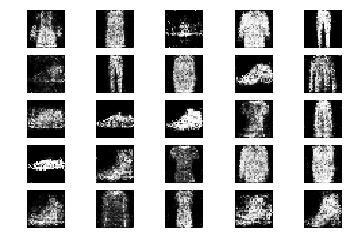

8401 [D loss: 0.627709, acc.: 64.06%] [G loss: 0.964701]
8402 [D loss: 0.671673, acc.: 56.25%] [G loss: 0.971499]
8403 [D loss: 0.681916, acc.: 62.50%] [G loss: 0.930968]
8404 [D loss: 0.616808, acc.: 68.75%] [G loss: 0.891662]
8405 [D loss: 0.639831, acc.: 64.06%] [G loss: 0.858214]
8406 [D loss: 0.618122, acc.: 67.19%] [G loss: 1.009272]
8407 [D loss: 0.658279, acc.: 60.94%] [G loss: 0.824158]
8408 [D loss: 0.682620, acc.: 62.50%] [G loss: 0.849367]
8409 [D loss: 0.741085, acc.: 54.69%] [G loss: 0.894222]
8410 [D loss: 0.579693, acc.: 75.00%] [G loss: 0.933000]
8411 [D loss: 0.707683, acc.: 53.12%] [G loss: 0.833373]
8412 [D loss: 0.625391, acc.: 65.62%] [G loss: 0.866701]
8413 [D loss: 0.674175, acc.: 57.81%] [G loss: 0.884876]
8414 [D loss: 0.614715, acc.: 64.06%] [G loss: 0.920802]
8415 [D loss: 0.674096, acc.: 51.56%] [G loss: 0.857223]
8416 [D loss: 0.595568, acc.: 71.88%] [G loss: 1.005637]
8417 [D loss: 0.719674, acc.: 51.56%] [G loss: 1.045161]
8418 [D loss: 0.605211, acc.: 6

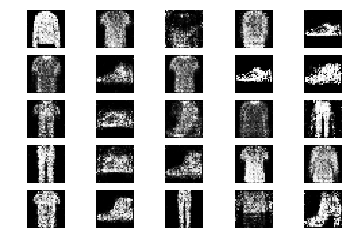

8451 [D loss: 0.618292, acc.: 65.62%] [G loss: 0.926448]
8452 [D loss: 0.650295, acc.: 67.19%] [G loss: 0.880717]
8453 [D loss: 0.711727, acc.: 53.12%] [G loss: 0.858470]
8454 [D loss: 0.678396, acc.: 59.38%] [G loss: 0.941128]
8455 [D loss: 0.618107, acc.: 67.19%] [G loss: 0.982695]
8456 [D loss: 0.579937, acc.: 71.88%] [G loss: 0.913372]
8457 [D loss: 0.587740, acc.: 71.88%] [G loss: 0.913896]
8458 [D loss: 0.641992, acc.: 67.19%] [G loss: 0.910369]
8459 [D loss: 0.641330, acc.: 59.38%] [G loss: 0.950210]
8460 [D loss: 0.623445, acc.: 62.50%] [G loss: 0.974366]
8461 [D loss: 0.760712, acc.: 54.69%] [G loss: 0.855204]
8462 [D loss: 0.638207, acc.: 56.25%] [G loss: 0.898315]
8463 [D loss: 0.664506, acc.: 62.50%] [G loss: 0.941912]
8464 [D loss: 0.685295, acc.: 59.38%] [G loss: 0.896262]
8465 [D loss: 0.624981, acc.: 60.94%] [G loss: 1.000892]
8466 [D loss: 0.616792, acc.: 68.75%] [G loss: 0.959572]
8467 [D loss: 0.617874, acc.: 67.19%] [G loss: 0.926029]
8468 [D loss: 0.653661, acc.: 5

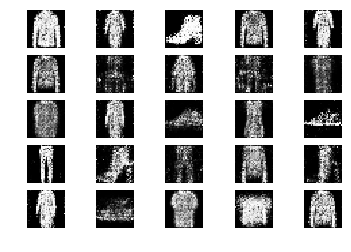

8501 [D loss: 0.579152, acc.: 71.88%] [G loss: 0.809885]
8502 [D loss: 0.621645, acc.: 62.50%] [G loss: 0.857680]
8503 [D loss: 0.668034, acc.: 64.06%] [G loss: 0.969556]
8504 [D loss: 0.665852, acc.: 59.38%] [G loss: 0.975950]
8505 [D loss: 0.657401, acc.: 65.62%] [G loss: 0.868204]
8506 [D loss: 0.621320, acc.: 68.75%] [G loss: 0.921586]
8507 [D loss: 0.669245, acc.: 64.06%] [G loss: 0.927028]
8508 [D loss: 0.688613, acc.: 57.81%] [G loss: 0.914507]
8509 [D loss: 0.795495, acc.: 48.44%] [G loss: 0.903688]
8510 [D loss: 0.708804, acc.: 51.56%] [G loss: 0.933127]
8511 [D loss: 0.635811, acc.: 59.38%] [G loss: 0.850401]
8512 [D loss: 0.665213, acc.: 53.12%] [G loss: 0.858920]
8513 [D loss: 0.717690, acc.: 56.25%] [G loss: 0.898290]
8514 [D loss: 0.611929, acc.: 64.06%] [G loss: 0.927726]
8515 [D loss: 0.703003, acc.: 54.69%] [G loss: 0.869569]
8516 [D loss: 0.546906, acc.: 76.56%] [G loss: 0.906558]
8517 [D loss: 0.719636, acc.: 51.56%] [G loss: 0.921964]
8518 [D loss: 0.689147, acc.: 5

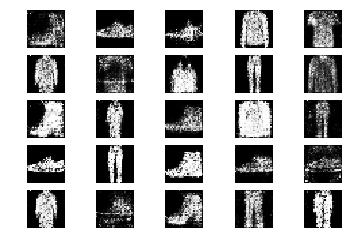

8551 [D loss: 0.610105, acc.: 67.19%] [G loss: 0.917951]
8552 [D loss: 0.647903, acc.: 59.38%] [G loss: 0.938378]
8553 [D loss: 0.666908, acc.: 59.38%] [G loss: 1.036561]
8554 [D loss: 0.625406, acc.: 64.06%] [G loss: 0.960805]
8555 [D loss: 0.719644, acc.: 64.06%] [G loss: 0.838781]
8556 [D loss: 0.634254, acc.: 60.94%] [G loss: 0.827813]
8557 [D loss: 0.607790, acc.: 67.19%] [G loss: 0.881552]
8558 [D loss: 0.659923, acc.: 60.94%] [G loss: 0.957757]
8559 [D loss: 0.625917, acc.: 65.62%] [G loss: 0.987195]
8560 [D loss: 0.598204, acc.: 71.88%] [G loss: 0.940734]
8561 [D loss: 0.621644, acc.: 67.19%] [G loss: 0.930214]
8562 [D loss: 0.633706, acc.: 59.38%] [G loss: 0.897975]
8563 [D loss: 0.675417, acc.: 60.94%] [G loss: 0.870319]
8564 [D loss: 0.678686, acc.: 60.94%] [G loss: 0.952227]
8565 [D loss: 0.691490, acc.: 56.25%] [G loss: 0.995761]
8566 [D loss: 0.559728, acc.: 70.31%] [G loss: 1.069973]
8567 [D loss: 0.717657, acc.: 48.44%] [G loss: 0.988471]
8568 [D loss: 0.661769, acc.: 6

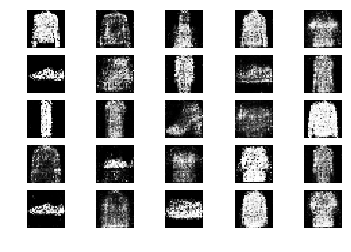

8601 [D loss: 0.586509, acc.: 67.19%] [G loss: 0.894834]
8602 [D loss: 0.683649, acc.: 56.25%] [G loss: 0.915627]
8603 [D loss: 0.670169, acc.: 54.69%] [G loss: 0.841913]
8604 [D loss: 0.618804, acc.: 67.19%] [G loss: 0.909482]
8605 [D loss: 0.594089, acc.: 71.88%] [G loss: 0.822905]
8606 [D loss: 0.662638, acc.: 62.50%] [G loss: 0.984653]
8607 [D loss: 0.645931, acc.: 60.94%] [G loss: 1.016163]
8608 [D loss: 0.697590, acc.: 53.12%] [G loss: 1.095206]
8609 [D loss: 0.662309, acc.: 64.06%] [G loss: 0.985876]
8610 [D loss: 0.697284, acc.: 54.69%] [G loss: 0.895432]
8611 [D loss: 0.638337, acc.: 64.06%] [G loss: 0.901443]
8612 [D loss: 0.638393, acc.: 62.50%] [G loss: 0.883477]
8613 [D loss: 0.595585, acc.: 71.88%] [G loss: 0.903915]
8614 [D loss: 0.617970, acc.: 65.62%] [G loss: 0.876383]
8615 [D loss: 0.631697, acc.: 65.62%] [G loss: 0.931613]
8616 [D loss: 0.651770, acc.: 62.50%] [G loss: 0.947410]
8617 [D loss: 0.578268, acc.: 71.88%] [G loss: 0.967898]
8618 [D loss: 0.573150, acc.: 7

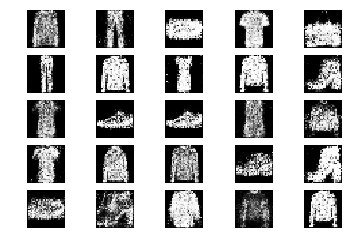

8651 [D loss: 0.598422, acc.: 67.19%] [G loss: 0.858323]
8652 [D loss: 0.673128, acc.: 53.12%] [G loss: 0.844157]
8653 [D loss: 0.652273, acc.: 50.00%] [G loss: 0.864301]
8654 [D loss: 0.651470, acc.: 60.94%] [G loss: 0.916633]
8655 [D loss: 0.643198, acc.: 62.50%] [G loss: 0.873936]
8656 [D loss: 0.640196, acc.: 62.50%] [G loss: 0.981500]
8657 [D loss: 0.622629, acc.: 65.62%] [G loss: 0.977617]
8658 [D loss: 0.646707, acc.: 67.19%] [G loss: 0.997722]
8659 [D loss: 0.677050, acc.: 50.00%] [G loss: 0.960243]
8660 [D loss: 0.661869, acc.: 59.38%] [G loss: 0.896143]
8661 [D loss: 0.619333, acc.: 60.94%] [G loss: 0.838864]
8662 [D loss: 0.712976, acc.: 51.56%] [G loss: 0.931688]
8663 [D loss: 0.557887, acc.: 67.19%] [G loss: 1.027506]
8664 [D loss: 0.654011, acc.: 56.25%] [G loss: 0.942796]
8665 [D loss: 0.662858, acc.: 64.06%] [G loss: 0.981189]
8666 [D loss: 0.648794, acc.: 67.19%] [G loss: 0.910407]
8667 [D loss: 0.692105, acc.: 57.81%] [G loss: 0.986536]
8668 [D loss: 0.708351, acc.: 5

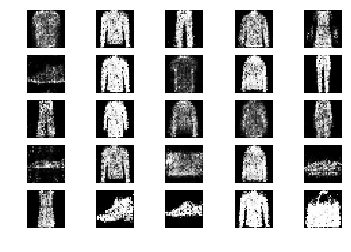

8701 [D loss: 0.596952, acc.: 75.00%] [G loss: 0.939410]
8702 [D loss: 0.601299, acc.: 73.44%] [G loss: 0.941369]
8703 [D loss: 0.652309, acc.: 60.94%] [G loss: 1.014732]
8704 [D loss: 0.667669, acc.: 64.06%] [G loss: 0.872771]
8705 [D loss: 0.584318, acc.: 64.06%] [G loss: 0.922548]
8706 [D loss: 0.679162, acc.: 59.38%] [G loss: 0.935560]
8707 [D loss: 0.705060, acc.: 53.12%] [G loss: 0.881540]
8708 [D loss: 0.632367, acc.: 67.19%] [G loss: 0.882237]
8709 [D loss: 0.633961, acc.: 62.50%] [G loss: 0.935055]
8710 [D loss: 0.630649, acc.: 62.50%] [G loss: 0.979912]
8711 [D loss: 0.623053, acc.: 67.19%] [G loss: 0.964182]
8712 [D loss: 0.636524, acc.: 65.62%] [G loss: 1.001197]
8713 [D loss: 0.667649, acc.: 60.94%] [G loss: 0.955019]
8714 [D loss: 0.607611, acc.: 67.19%] [G loss: 0.970224]
8715 [D loss: 0.598862, acc.: 73.44%] [G loss: 1.030431]
8716 [D loss: 0.630189, acc.: 65.62%] [G loss: 1.007326]
8717 [D loss: 0.731441, acc.: 48.44%] [G loss: 0.917133]
8718 [D loss: 0.721141, acc.: 4

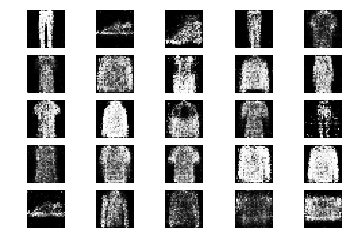

8751 [D loss: 0.569037, acc.: 76.56%] [G loss: 0.940827]
8752 [D loss: 0.667274, acc.: 59.38%] [G loss: 0.873556]
8753 [D loss: 0.764523, acc.: 50.00%] [G loss: 1.021868]
8754 [D loss: 0.673985, acc.: 54.69%] [G loss: 1.024696]
8755 [D loss: 0.669212, acc.: 57.81%] [G loss: 0.972403]
8756 [D loss: 0.668873, acc.: 64.06%] [G loss: 1.071371]
8757 [D loss: 0.656778, acc.: 57.81%] [G loss: 1.003209]
8758 [D loss: 0.643792, acc.: 60.94%] [G loss: 0.899442]
8759 [D loss: 0.548124, acc.: 68.75%] [G loss: 0.960675]
8760 [D loss: 0.624506, acc.: 65.62%] [G loss: 0.954583]
8761 [D loss: 0.723637, acc.: 53.12%] [G loss: 1.041647]
8762 [D loss: 0.687467, acc.: 56.25%] [G loss: 0.890883]
8763 [D loss: 0.676318, acc.: 65.62%] [G loss: 0.966206]
8764 [D loss: 0.659572, acc.: 59.38%] [G loss: 0.846968]
8765 [D loss: 0.655894, acc.: 56.25%] [G loss: 0.892021]
8766 [D loss: 0.672286, acc.: 67.19%] [G loss: 0.994161]
8767 [D loss: 0.638013, acc.: 62.50%] [G loss: 0.974192]
8768 [D loss: 0.660815, acc.: 6

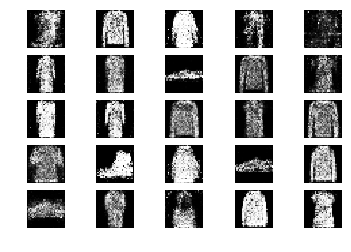

8801 [D loss: 0.669881, acc.: 56.25%] [G loss: 0.887583]
8802 [D loss: 0.673862, acc.: 60.94%] [G loss: 0.957270]
8803 [D loss: 0.662146, acc.: 56.25%] [G loss: 0.972888]
8804 [D loss: 0.651482, acc.: 57.81%] [G loss: 0.993246]
8805 [D loss: 0.610568, acc.: 65.62%] [G loss: 0.977583]
8806 [D loss: 0.623907, acc.: 67.19%] [G loss: 0.889726]
8807 [D loss: 0.628348, acc.: 64.06%] [G loss: 0.867356]
8808 [D loss: 0.667740, acc.: 65.62%] [G loss: 0.840819]
8809 [D loss: 0.664057, acc.: 57.81%] [G loss: 0.923736]
8810 [D loss: 0.633336, acc.: 67.19%] [G loss: 0.911728]
8811 [D loss: 0.589735, acc.: 71.88%] [G loss: 0.863794]
8812 [D loss: 0.717960, acc.: 50.00%] [G loss: 0.814766]
8813 [D loss: 0.674305, acc.: 56.25%] [G loss: 0.967071]
8814 [D loss: 0.686360, acc.: 54.69%] [G loss: 0.902693]
8815 [D loss: 0.591019, acc.: 70.31%] [G loss: 0.861486]
8816 [D loss: 0.642178, acc.: 60.94%] [G loss: 0.908818]
8817 [D loss: 0.666076, acc.: 60.94%] [G loss: 0.993503]
8818 [D loss: 0.621979, acc.: 6

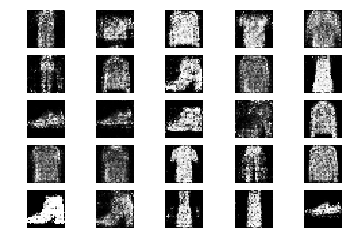

8851 [D loss: 0.668747, acc.: 59.38%] [G loss: 0.896733]
8852 [D loss: 0.622734, acc.: 62.50%] [G loss: 0.929777]
8853 [D loss: 0.598733, acc.: 78.12%] [G loss: 1.037639]
8854 [D loss: 0.631817, acc.: 67.19%] [G loss: 1.015533]
8855 [D loss: 0.591547, acc.: 64.06%] [G loss: 1.009725]
8856 [D loss: 0.654719, acc.: 68.75%] [G loss: 0.963432]
8857 [D loss: 0.676243, acc.: 59.38%] [G loss: 0.894884]
8858 [D loss: 0.633297, acc.: 56.25%] [G loss: 0.968833]
8859 [D loss: 0.602777, acc.: 71.88%] [G loss: 0.884848]
8860 [D loss: 0.676000, acc.: 53.12%] [G loss: 0.850823]
8861 [D loss: 0.679582, acc.: 64.06%] [G loss: 0.920589]
8862 [D loss: 0.691091, acc.: 57.81%] [G loss: 0.929047]
8863 [D loss: 0.625298, acc.: 68.75%] [G loss: 0.868263]
8864 [D loss: 0.706883, acc.: 57.81%] [G loss: 0.962400]
8865 [D loss: 0.635071, acc.: 59.38%] [G loss: 0.902915]
8866 [D loss: 0.600715, acc.: 70.31%] [G loss: 0.866101]
8867 [D loss: 0.703307, acc.: 57.81%] [G loss: 0.895036]
8868 [D loss: 0.668550, acc.: 5

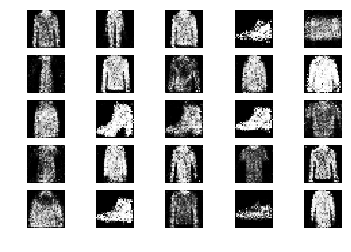

8901 [D loss: 0.595747, acc.: 70.31%] [G loss: 1.039294]
8902 [D loss: 0.679023, acc.: 57.81%] [G loss: 1.077849]
8903 [D loss: 0.578405, acc.: 75.00%] [G loss: 0.974248]
8904 [D loss: 0.705854, acc.: 56.25%] [G loss: 0.903489]
8905 [D loss: 0.677388, acc.: 57.81%] [G loss: 1.014128]
8906 [D loss: 0.617790, acc.: 70.31%] [G loss: 1.024686]
8907 [D loss: 0.603154, acc.: 65.62%] [G loss: 0.981896]
8908 [D loss: 0.679593, acc.: 54.69%] [G loss: 0.873032]
8909 [D loss: 0.628781, acc.: 67.19%] [G loss: 0.836579]
8910 [D loss: 0.677726, acc.: 59.38%] [G loss: 0.835664]
8911 [D loss: 0.665290, acc.: 59.38%] [G loss: 0.867379]
8912 [D loss: 0.590498, acc.: 67.19%] [G loss: 0.865856]
8913 [D loss: 0.710956, acc.: 51.56%] [G loss: 0.826212]
8914 [D loss: 0.660253, acc.: 62.50%] [G loss: 0.990702]
8915 [D loss: 0.646026, acc.: 64.06%] [G loss: 0.879337]
8916 [D loss: 0.636751, acc.: 70.31%] [G loss: 0.967485]
8917 [D loss: 0.716313, acc.: 51.56%] [G loss: 0.833580]
8918 [D loss: 0.630967, acc.: 7

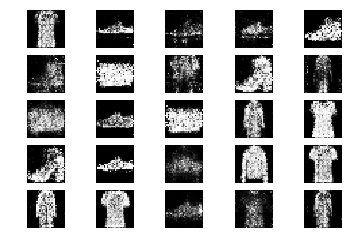

8951 [D loss: 0.598076, acc.: 65.62%] [G loss: 0.948706]
8952 [D loss: 0.689718, acc.: 57.81%] [G loss: 0.869645]
8953 [D loss: 0.677802, acc.: 56.25%] [G loss: 0.915956]
8954 [D loss: 0.691973, acc.: 59.38%] [G loss: 0.874877]
8955 [D loss: 0.596707, acc.: 64.06%] [G loss: 1.011896]
8956 [D loss: 0.612910, acc.: 71.88%] [G loss: 0.912662]
8957 [D loss: 0.652592, acc.: 64.06%] [G loss: 0.933974]
8958 [D loss: 0.686270, acc.: 60.94%] [G loss: 0.944541]
8959 [D loss: 0.615033, acc.: 67.19%] [G loss: 0.965161]
8960 [D loss: 0.635561, acc.: 64.06%] [G loss: 1.034051]
8961 [D loss: 0.653007, acc.: 64.06%] [G loss: 0.914144]
8962 [D loss: 0.633012, acc.: 70.31%] [G loss: 0.828503]
8963 [D loss: 0.630025, acc.: 60.94%] [G loss: 0.963939]
8964 [D loss: 0.627034, acc.: 59.38%] [G loss: 0.829272]
8965 [D loss: 0.669756, acc.: 57.81%] [G loss: 0.931000]
8966 [D loss: 0.660503, acc.: 64.06%] [G loss: 0.937294]
8967 [D loss: 0.699689, acc.: 56.25%] [G loss: 0.874112]
8968 [D loss: 0.627434, acc.: 6

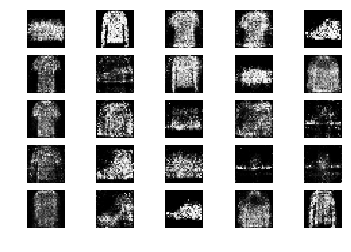

9001 [D loss: 0.734086, acc.: 45.31%] [G loss: 1.000266]
9002 [D loss: 0.636345, acc.: 65.62%] [G loss: 1.017328]
9003 [D loss: 0.736257, acc.: 50.00%] [G loss: 0.874014]
9004 [D loss: 0.648920, acc.: 57.81%] [G loss: 0.953879]
9005 [D loss: 0.670098, acc.: 59.38%] [G loss: 0.962586]
9006 [D loss: 0.621578, acc.: 70.31%] [G loss: 0.952149]
9007 [D loss: 0.634735, acc.: 68.75%] [G loss: 0.834421]
9008 [D loss: 0.681365, acc.: 57.81%] [G loss: 0.852764]
9009 [D loss: 0.643521, acc.: 62.50%] [G loss: 0.885136]
9010 [D loss: 0.693371, acc.: 60.94%] [G loss: 0.891976]
9011 [D loss: 0.628758, acc.: 56.25%] [G loss: 0.938011]
9012 [D loss: 0.589332, acc.: 71.88%] [G loss: 0.936830]
9013 [D loss: 0.697235, acc.: 57.81%] [G loss: 0.893173]
9014 [D loss: 0.633456, acc.: 64.06%] [G loss: 0.860635]
9015 [D loss: 0.608825, acc.: 62.50%] [G loss: 0.839160]
9016 [D loss: 0.617985, acc.: 59.38%] [G loss: 0.945711]
9017 [D loss: 0.649785, acc.: 59.38%] [G loss: 0.885427]
9018 [D loss: 0.570038, acc.: 7

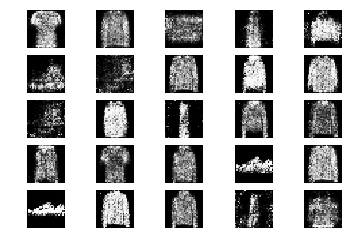

9051 [D loss: 0.641746, acc.: 64.06%] [G loss: 0.973110]
9052 [D loss: 0.596912, acc.: 67.19%] [G loss: 1.006948]
9053 [D loss: 0.715164, acc.: 54.69%] [G loss: 1.010891]
9054 [D loss: 0.621823, acc.: 70.31%] [G loss: 1.017346]
9055 [D loss: 0.589746, acc.: 70.31%] [G loss: 1.000306]
9056 [D loss: 0.626606, acc.: 60.94%] [G loss: 0.902377]
9057 [D loss: 0.578513, acc.: 70.31%] [G loss: 0.860715]
9058 [D loss: 0.562763, acc.: 73.44%] [G loss: 0.994548]
9059 [D loss: 0.679608, acc.: 59.38%] [G loss: 0.934800]
9060 [D loss: 0.664299, acc.: 59.38%] [G loss: 0.939825]
9061 [D loss: 0.655906, acc.: 54.69%] [G loss: 0.939696]
9062 [D loss: 0.582716, acc.: 70.31%] [G loss: 0.932014]
9063 [D loss: 0.649419, acc.: 60.94%] [G loss: 1.080634]
9064 [D loss: 0.663536, acc.: 64.06%] [G loss: 0.979013]
9065 [D loss: 0.677540, acc.: 60.94%] [G loss: 0.983850]
9066 [D loss: 0.665887, acc.: 56.25%] [G loss: 1.114694]
9067 [D loss: 0.708611, acc.: 51.56%] [G loss: 0.939476]
9068 [D loss: 0.668315, acc.: 6

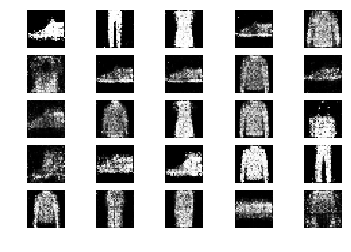

9101 [D loss: 0.648628, acc.: 65.62%] [G loss: 0.791025]
9102 [D loss: 0.667357, acc.: 51.56%] [G loss: 0.890926]
9103 [D loss: 0.684739, acc.: 51.56%] [G loss: 0.809839]
9104 [D loss: 0.676812, acc.: 62.50%] [G loss: 0.991583]
9105 [D loss: 0.620332, acc.: 67.19%] [G loss: 0.867770]
9106 [D loss: 0.704781, acc.: 54.69%] [G loss: 0.929096]
9107 [D loss: 0.586969, acc.: 70.31%] [G loss: 0.946739]
9108 [D loss: 0.665523, acc.: 57.81%] [G loss: 1.014087]
9109 [D loss: 0.632308, acc.: 65.62%] [G loss: 0.835913]
9110 [D loss: 0.661338, acc.: 54.69%] [G loss: 1.102399]
9111 [D loss: 0.600086, acc.: 65.62%] [G loss: 1.001798]
9112 [D loss: 0.663932, acc.: 62.50%] [G loss: 0.905520]
9113 [D loss: 0.679853, acc.: 51.56%] [G loss: 0.878828]
9114 [D loss: 0.648564, acc.: 65.62%] [G loss: 0.851801]
9115 [D loss: 0.672911, acc.: 67.19%] [G loss: 0.951129]
9116 [D loss: 0.658158, acc.: 60.94%] [G loss: 0.917308]
9117 [D loss: 0.659465, acc.: 54.69%] [G loss: 0.962341]
9118 [D loss: 0.625147, acc.: 6

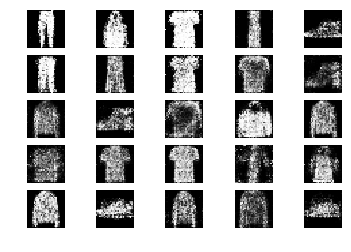

9151 [D loss: 0.649407, acc.: 57.81%] [G loss: 0.867646]
9152 [D loss: 0.639280, acc.: 60.94%] [G loss: 0.949445]
9153 [D loss: 0.643043, acc.: 65.62%] [G loss: 0.896543]
9154 [D loss: 0.633752, acc.: 59.38%] [G loss: 0.940197]
9155 [D loss: 0.653575, acc.: 64.06%] [G loss: 0.952378]
9156 [D loss: 0.631922, acc.: 62.50%] [G loss: 0.963970]
9157 [D loss: 0.630952, acc.: 68.75%] [G loss: 0.943039]
9158 [D loss: 0.590273, acc.: 67.19%] [G loss: 0.946104]
9159 [D loss: 0.610842, acc.: 67.19%] [G loss: 0.874746]
9160 [D loss: 0.663797, acc.: 64.06%] [G loss: 0.962439]
9161 [D loss: 0.649237, acc.: 67.19%] [G loss: 0.952986]
9162 [D loss: 0.683537, acc.: 54.69%] [G loss: 0.919414]
9163 [D loss: 0.673988, acc.: 50.00%] [G loss: 0.972347]
9164 [D loss: 0.618668, acc.: 71.88%] [G loss: 0.911833]
9165 [D loss: 0.675718, acc.: 59.38%] [G loss: 0.947172]
9166 [D loss: 0.686934, acc.: 57.81%] [G loss: 0.941751]
9167 [D loss: 0.686735, acc.: 56.25%] [G loss: 0.941511]
9168 [D loss: 0.606323, acc.: 6

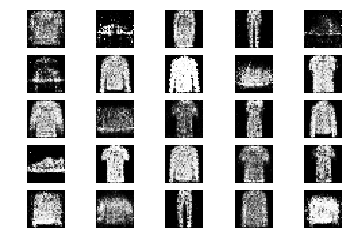

9201 [D loss: 0.648941, acc.: 64.06%] [G loss: 0.887338]
9202 [D loss: 0.621875, acc.: 60.94%] [G loss: 0.967942]
9203 [D loss: 0.674775, acc.: 57.81%] [G loss: 0.914589]
9204 [D loss: 0.667941, acc.: 57.81%] [G loss: 0.909135]
9205 [D loss: 0.649313, acc.: 59.38%] [G loss: 0.893858]
9206 [D loss: 0.588973, acc.: 75.00%] [G loss: 0.973972]
9207 [D loss: 0.633083, acc.: 60.94%] [G loss: 0.929317]
9208 [D loss: 0.648876, acc.: 62.50%] [G loss: 1.048204]
9209 [D loss: 0.639358, acc.: 65.62%] [G loss: 1.098515]
9210 [D loss: 0.640812, acc.: 67.19%] [G loss: 0.977896]
9211 [D loss: 0.572181, acc.: 75.00%] [G loss: 0.982182]
9212 [D loss: 0.689012, acc.: 60.94%] [G loss: 0.895227]
9213 [D loss: 0.674044, acc.: 59.38%] [G loss: 0.901246]
9214 [D loss: 0.719763, acc.: 54.69%] [G loss: 0.874213]
9215 [D loss: 0.642670, acc.: 57.81%] [G loss: 0.901782]
9216 [D loss: 0.593584, acc.: 70.31%] [G loss: 0.858713]
9217 [D loss: 0.672308, acc.: 70.31%] [G loss: 0.869841]
9218 [D loss: 0.659971, acc.: 6

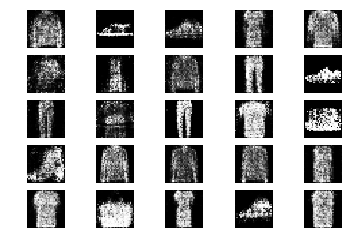

9251 [D loss: 0.627264, acc.: 70.31%] [G loss: 0.936118]
9252 [D loss: 0.624120, acc.: 64.06%] [G loss: 0.862037]
9253 [D loss: 0.627876, acc.: 70.31%] [G loss: 0.969332]
9254 [D loss: 0.708984, acc.: 57.81%] [G loss: 0.937988]
9255 [D loss: 0.655723, acc.: 62.50%] [G loss: 0.929047]
9256 [D loss: 0.601218, acc.: 67.19%] [G loss: 0.925087]
9257 [D loss: 0.635623, acc.: 64.06%] [G loss: 0.922285]
9258 [D loss: 0.631432, acc.: 67.19%] [G loss: 0.889827]
9259 [D loss: 0.585051, acc.: 71.88%] [G loss: 0.933184]
9260 [D loss: 0.653624, acc.: 60.94%] [G loss: 1.041494]
9261 [D loss: 0.599475, acc.: 67.19%] [G loss: 1.029760]
9262 [D loss: 0.674697, acc.: 56.25%] [G loss: 0.997917]
9263 [D loss: 0.594162, acc.: 67.19%] [G loss: 0.934446]
9264 [D loss: 0.660073, acc.: 59.38%] [G loss: 0.932922]
9265 [D loss: 0.663351, acc.: 59.38%] [G loss: 0.928149]
9266 [D loss: 0.622008, acc.: 62.50%] [G loss: 1.039279]
9267 [D loss: 0.700837, acc.: 56.25%] [G loss: 0.986218]
9268 [D loss: 0.693718, acc.: 5

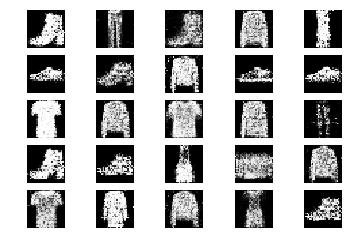

9301 [D loss: 0.651015, acc.: 62.50%] [G loss: 0.960660]
9302 [D loss: 0.643185, acc.: 67.19%] [G loss: 1.040470]
9303 [D loss: 0.605393, acc.: 70.31%] [G loss: 1.091627]
9304 [D loss: 0.607777, acc.: 71.88%] [G loss: 0.980584]
9305 [D loss: 0.667083, acc.: 54.69%] [G loss: 0.907292]
9306 [D loss: 0.614977, acc.: 68.75%] [G loss: 0.926994]
9307 [D loss: 0.690715, acc.: 48.44%] [G loss: 0.899390]
9308 [D loss: 0.604938, acc.: 73.44%] [G loss: 0.916514]
9309 [D loss: 0.657936, acc.: 62.50%] [G loss: 0.924338]
9310 [D loss: 0.605097, acc.: 67.19%] [G loss: 0.944484]
9311 [D loss: 0.666905, acc.: 59.38%] [G loss: 0.914032]
9312 [D loss: 0.662408, acc.: 64.06%] [G loss: 0.994402]
9313 [D loss: 0.631631, acc.: 70.31%] [G loss: 0.982135]
9314 [D loss: 0.697713, acc.: 54.69%] [G loss: 0.951408]
9315 [D loss: 0.622804, acc.: 59.38%] [G loss: 0.974733]
9316 [D loss: 0.647144, acc.: 59.38%] [G loss: 0.931448]
9317 [D loss: 0.652129, acc.: 64.06%] [G loss: 0.901915]
9318 [D loss: 0.654450, acc.: 5

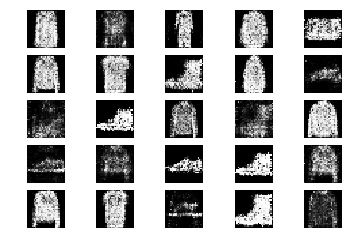

9351 [D loss: 0.642582, acc.: 60.94%] [G loss: 0.929101]
9352 [D loss: 0.646718, acc.: 62.50%] [G loss: 0.981030]
9353 [D loss: 0.619172, acc.: 62.50%] [G loss: 0.959269]
9354 [D loss: 0.703437, acc.: 56.25%] [G loss: 1.017936]
9355 [D loss: 0.555787, acc.: 75.00%] [G loss: 0.991442]
9356 [D loss: 0.532229, acc.: 76.56%] [G loss: 1.017370]
9357 [D loss: 0.662464, acc.: 60.94%] [G loss: 0.805435]
9358 [D loss: 0.641721, acc.: 60.94%] [G loss: 0.807375]
9359 [D loss: 0.607703, acc.: 70.31%] [G loss: 0.758600]
9360 [D loss: 0.665000, acc.: 57.81%] [G loss: 0.869615]
9361 [D loss: 0.588706, acc.: 60.94%] [G loss: 0.932712]
9362 [D loss: 0.692948, acc.: 60.94%] [G loss: 0.924886]
9363 [D loss: 0.703922, acc.: 57.81%] [G loss: 0.911419]
9364 [D loss: 0.645326, acc.: 60.94%] [G loss: 0.967199]
9365 [D loss: 0.634031, acc.: 60.94%] [G loss: 0.841342]
9366 [D loss: 0.615345, acc.: 64.06%] [G loss: 0.873340]
9367 [D loss: 0.716187, acc.: 53.12%] [G loss: 0.897912]
9368 [D loss: 0.603028, acc.: 6

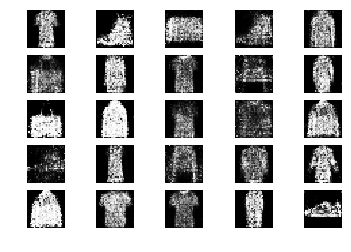

9401 [D loss: 0.599980, acc.: 67.19%] [G loss: 0.858877]
9402 [D loss: 0.721209, acc.: 59.38%] [G loss: 0.884899]
9403 [D loss: 0.607721, acc.: 65.62%] [G loss: 0.886800]
9404 [D loss: 0.642533, acc.: 67.19%] [G loss: 0.880183]
9405 [D loss: 0.687699, acc.: 51.56%] [G loss: 0.916914]
9406 [D loss: 0.679836, acc.: 56.25%] [G loss: 0.977101]
9407 [D loss: 0.653554, acc.: 65.62%] [G loss: 0.877801]
9408 [D loss: 0.735549, acc.: 57.81%] [G loss: 0.884125]
9409 [D loss: 0.592074, acc.: 67.19%] [G loss: 0.898055]
9410 [D loss: 0.598515, acc.: 62.50%] [G loss: 0.893049]
9411 [D loss: 0.717594, acc.: 51.56%] [G loss: 0.816111]
9412 [D loss: 0.666477, acc.: 60.94%] [G loss: 0.871382]
9413 [D loss: 0.629901, acc.: 62.50%] [G loss: 0.844172]
9414 [D loss: 0.640178, acc.: 62.50%] [G loss: 0.834166]
9415 [D loss: 0.663620, acc.: 57.81%] [G loss: 0.942863]
9416 [D loss: 0.585991, acc.: 73.44%] [G loss: 0.997930]
9417 [D loss: 0.630880, acc.: 59.38%] [G loss: 0.916830]
9418 [D loss: 0.656096, acc.: 6

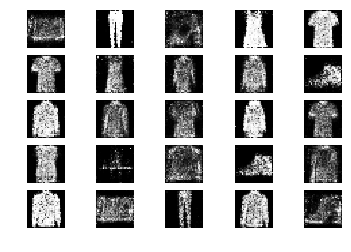

9451 [D loss: 0.694494, acc.: 60.94%] [G loss: 0.926307]
9452 [D loss: 0.614093, acc.: 68.75%] [G loss: 0.891103]
9453 [D loss: 0.638121, acc.: 60.94%] [G loss: 0.901343]
9454 [D loss: 0.622939, acc.: 65.62%] [G loss: 0.853969]
9455 [D loss: 0.674790, acc.: 56.25%] [G loss: 0.964966]
9456 [D loss: 0.631573, acc.: 59.38%] [G loss: 0.828883]
9457 [D loss: 0.684139, acc.: 56.25%] [G loss: 0.819517]
9458 [D loss: 0.673118, acc.: 57.81%] [G loss: 1.016339]
9459 [D loss: 0.602476, acc.: 75.00%] [G loss: 0.924302]
9460 [D loss: 0.656057, acc.: 65.62%] [G loss: 1.006677]
9461 [D loss: 0.639971, acc.: 59.38%] [G loss: 1.073410]
9462 [D loss: 0.688470, acc.: 70.31%] [G loss: 0.864264]
9463 [D loss: 0.688174, acc.: 54.69%] [G loss: 0.888902]
9464 [D loss: 0.736187, acc.: 51.56%] [G loss: 0.805526]
9465 [D loss: 0.683588, acc.: 59.38%] [G loss: 0.901003]
9466 [D loss: 0.687520, acc.: 60.94%] [G loss: 0.891621]
9467 [D loss: 0.593993, acc.: 70.31%] [G loss: 0.971524]
9468 [D loss: 0.690421, acc.: 5

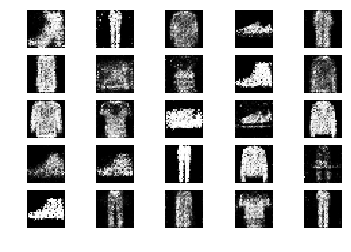

9501 [D loss: 0.668643, acc.: 60.94%] [G loss: 0.977550]
9502 [D loss: 0.656246, acc.: 62.50%] [G loss: 0.860385]
9503 [D loss: 0.641185, acc.: 60.94%] [G loss: 0.832580]
9504 [D loss: 0.728386, acc.: 56.25%] [G loss: 0.901290]
9505 [D loss: 0.593270, acc.: 65.62%] [G loss: 0.906280]
9506 [D loss: 0.631642, acc.: 60.94%] [G loss: 1.022252]
9507 [D loss: 0.704434, acc.: 53.12%] [G loss: 0.927638]
9508 [D loss: 0.576842, acc.: 75.00%] [G loss: 0.991778]
9509 [D loss: 0.613181, acc.: 67.19%] [G loss: 0.868828]
9510 [D loss: 0.670824, acc.: 59.38%] [G loss: 0.874591]
9511 [D loss: 0.644519, acc.: 62.50%] [G loss: 0.803833]
9512 [D loss: 0.607851, acc.: 67.19%] [G loss: 0.951070]
9513 [D loss: 0.681364, acc.: 53.12%] [G loss: 0.936780]
9514 [D loss: 0.647180, acc.: 67.19%] [G loss: 0.916597]
9515 [D loss: 0.615859, acc.: 65.62%] [G loss: 0.996054]
9516 [D loss: 0.599137, acc.: 64.06%] [G loss: 0.924753]
9517 [D loss: 0.617889, acc.: 62.50%] [G loss: 0.876186]
9518 [D loss: 0.729449, acc.: 4

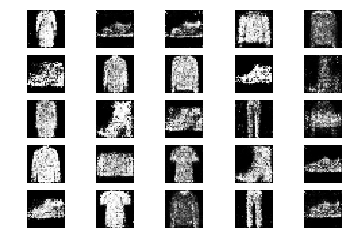

9551 [D loss: 0.681186, acc.: 56.25%] [G loss: 0.868975]
9552 [D loss: 0.627853, acc.: 60.94%] [G loss: 0.920598]
9553 [D loss: 0.628119, acc.: 68.75%] [G loss: 0.846394]
9554 [D loss: 0.681858, acc.: 56.25%] [G loss: 0.898006]
9555 [D loss: 0.661178, acc.: 51.56%] [G loss: 0.895786]
9556 [D loss: 0.672601, acc.: 53.12%] [G loss: 0.998342]
9557 [D loss: 0.629672, acc.: 67.19%] [G loss: 0.926918]
9558 [D loss: 0.695442, acc.: 60.94%] [G loss: 0.913030]
9559 [D loss: 0.751420, acc.: 54.69%] [G loss: 0.951173]
9560 [D loss: 0.611885, acc.: 67.19%] [G loss: 0.894769]
9561 [D loss: 0.681490, acc.: 53.12%] [G loss: 0.783581]
9562 [D loss: 0.676141, acc.: 51.56%] [G loss: 0.827409]
9563 [D loss: 0.683408, acc.: 59.38%] [G loss: 0.923888]
9564 [D loss: 0.662237, acc.: 57.81%] [G loss: 0.899526]
9565 [D loss: 0.652859, acc.: 56.25%] [G loss: 0.912386]
9566 [D loss: 0.645400, acc.: 62.50%] [G loss: 0.892234]
9567 [D loss: 0.641733, acc.: 68.75%] [G loss: 0.889513]
9568 [D loss: 0.677706, acc.: 5

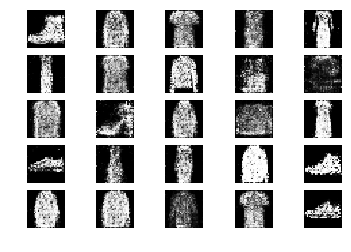

9601 [D loss: 0.597903, acc.: 73.44%] [G loss: 0.918578]
9602 [D loss: 0.633713, acc.: 64.06%] [G loss: 1.007383]
9603 [D loss: 0.544079, acc.: 78.12%] [G loss: 1.034987]
9604 [D loss: 0.637910, acc.: 67.19%] [G loss: 0.874038]
9605 [D loss: 0.630445, acc.: 64.06%] [G loss: 0.874960]
9606 [D loss: 0.658671, acc.: 65.62%] [G loss: 0.985420]
9607 [D loss: 0.641314, acc.: 60.94%] [G loss: 0.977232]
9608 [D loss: 0.642675, acc.: 60.94%] [G loss: 1.005085]
9609 [D loss: 0.643525, acc.: 62.50%] [G loss: 0.935952]
9610 [D loss: 0.686473, acc.: 56.25%] [G loss: 0.844213]
9611 [D loss: 0.713104, acc.: 64.06%] [G loss: 1.029820]
9612 [D loss: 0.627106, acc.: 57.81%] [G loss: 1.001624]
9613 [D loss: 0.647785, acc.: 60.94%] [G loss: 1.063331]
9614 [D loss: 0.651687, acc.: 60.94%] [G loss: 1.090956]
9615 [D loss: 0.693206, acc.: 60.94%] [G loss: 0.967681]
9616 [D loss: 0.684428, acc.: 54.69%] [G loss: 0.814459]
9617 [D loss: 0.709947, acc.: 45.31%] [G loss: 0.871816]
9618 [D loss: 0.723844, acc.: 5

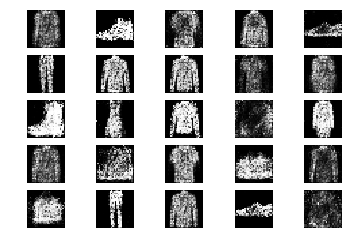

9651 [D loss: 0.715575, acc.: 54.69%] [G loss: 0.995072]
9652 [D loss: 0.607060, acc.: 65.62%] [G loss: 0.974495]
9653 [D loss: 0.608297, acc.: 67.19%] [G loss: 1.028759]
9654 [D loss: 0.626652, acc.: 64.06%] [G loss: 0.827949]
9655 [D loss: 0.625417, acc.: 54.69%] [G loss: 0.849085]
9656 [D loss: 0.667255, acc.: 54.69%] [G loss: 0.899633]
9657 [D loss: 0.737297, acc.: 59.38%] [G loss: 0.798565]
9658 [D loss: 0.673059, acc.: 60.94%] [G loss: 0.917982]
9659 [D loss: 0.658628, acc.: 65.62%] [G loss: 0.964199]
9660 [D loss: 0.614314, acc.: 67.19%] [G loss: 1.077037]
9661 [D loss: 0.632338, acc.: 67.19%] [G loss: 1.057666]
9662 [D loss: 0.629506, acc.: 64.06%] [G loss: 1.024389]
9663 [D loss: 0.636791, acc.: 64.06%] [G loss: 0.945010]
9664 [D loss: 0.683196, acc.: 54.69%] [G loss: 0.935413]
9665 [D loss: 0.585251, acc.: 65.62%] [G loss: 0.944623]
9666 [D loss: 0.636729, acc.: 68.75%] [G loss: 0.974030]
9667 [D loss: 0.664608, acc.: 56.25%] [G loss: 0.958768]
9668 [D loss: 0.613692, acc.: 6

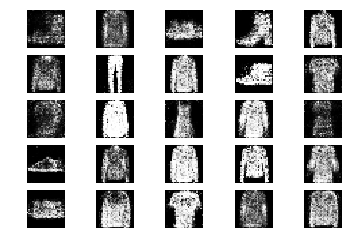

9701 [D loss: 0.643660, acc.: 57.81%] [G loss: 0.885067]
9702 [D loss: 0.601635, acc.: 73.44%] [G loss: 0.918975]
9703 [D loss: 0.685649, acc.: 62.50%] [G loss: 0.900895]
9704 [D loss: 0.650791, acc.: 60.94%] [G loss: 0.965138]
9705 [D loss: 0.594658, acc.: 71.88%] [G loss: 0.901630]
9706 [D loss: 0.646593, acc.: 68.75%] [G loss: 0.963330]
9707 [D loss: 0.639028, acc.: 60.94%] [G loss: 0.955804]
9708 [D loss: 0.600190, acc.: 67.19%] [G loss: 0.968725]
9709 [D loss: 0.652607, acc.: 60.94%] [G loss: 0.833590]
9710 [D loss: 0.606242, acc.: 65.62%] [G loss: 0.979643]
9711 [D loss: 0.705576, acc.: 57.81%] [G loss: 0.930581]
9712 [D loss: 0.729671, acc.: 51.56%] [G loss: 0.915056]
9713 [D loss: 0.648755, acc.: 57.81%] [G loss: 0.868546]
9714 [D loss: 0.660970, acc.: 59.38%] [G loss: 0.840679]
9715 [D loss: 0.692341, acc.: 56.25%] [G loss: 0.910666]
9716 [D loss: 0.724823, acc.: 48.44%] [G loss: 0.866456]
9717 [D loss: 0.661445, acc.: 56.25%] [G loss: 0.946522]
9718 [D loss: 0.570018, acc.: 7

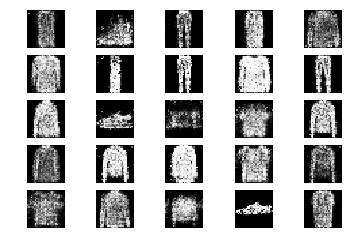

9751 [D loss: 0.685294, acc.: 53.12%] [G loss: 0.862150]
9752 [D loss: 0.619440, acc.: 59.38%] [G loss: 1.016623]
9753 [D loss: 0.633409, acc.: 68.75%] [G loss: 0.964649]
9754 [D loss: 0.560651, acc.: 73.44%] [G loss: 0.991642]
9755 [D loss: 0.703127, acc.: 48.44%] [G loss: 0.983716]
9756 [D loss: 0.711792, acc.: 59.38%] [G loss: 0.816249]
9757 [D loss: 0.673277, acc.: 56.25%] [G loss: 0.923071]
9758 [D loss: 0.622790, acc.: 67.19%] [G loss: 1.041133]
9759 [D loss: 0.640460, acc.: 65.62%] [G loss: 0.888404]
9760 [D loss: 0.682467, acc.: 59.38%] [G loss: 0.923979]
9761 [D loss: 0.665708, acc.: 65.62%] [G loss: 0.834664]
9762 [D loss: 0.674586, acc.: 64.06%] [G loss: 0.945527]
9763 [D loss: 0.641305, acc.: 60.94%] [G loss: 0.909062]
9764 [D loss: 0.593731, acc.: 71.88%] [G loss: 0.979992]
9765 [D loss: 0.608485, acc.: 67.19%] [G loss: 0.917650]
9766 [D loss: 0.666166, acc.: 59.38%] [G loss: 0.935046]
9767 [D loss: 0.689360, acc.: 60.94%] [G loss: 0.960006]
9768 [D loss: 0.721267, acc.: 5

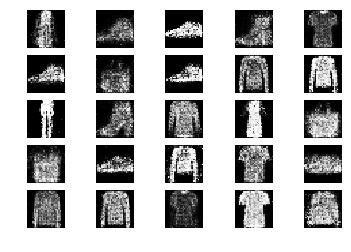

9801 [D loss: 0.630792, acc.: 70.31%] [G loss: 0.989096]
9802 [D loss: 0.670420, acc.: 57.81%] [G loss: 0.949428]
9803 [D loss: 0.685766, acc.: 53.12%] [G loss: 0.955257]
9804 [D loss: 0.730486, acc.: 60.94%] [G loss: 0.957885]
9805 [D loss: 0.610736, acc.: 68.75%] [G loss: 0.976425]
9806 [D loss: 0.701076, acc.: 57.81%] [G loss: 0.854844]
9807 [D loss: 0.622341, acc.: 68.75%] [G loss: 0.939606]
9808 [D loss: 0.657172, acc.: 60.94%] [G loss: 0.832395]
9809 [D loss: 0.610744, acc.: 70.31%] [G loss: 0.863047]
9810 [D loss: 0.662218, acc.: 60.94%] [G loss: 0.910060]
9811 [D loss: 0.700476, acc.: 56.25%] [G loss: 0.792829]
9812 [D loss: 0.650073, acc.: 62.50%] [G loss: 0.819790]
9813 [D loss: 0.602823, acc.: 67.19%] [G loss: 0.845045]
9814 [D loss: 0.708208, acc.: 54.69%] [G loss: 0.890623]
9815 [D loss: 0.653160, acc.: 50.00%] [G loss: 0.939591]
9816 [D loss: 0.635584, acc.: 59.38%] [G loss: 0.905931]
9817 [D loss: 0.680229, acc.: 57.81%] [G loss: 0.932659]
9818 [D loss: 0.691459, acc.: 5

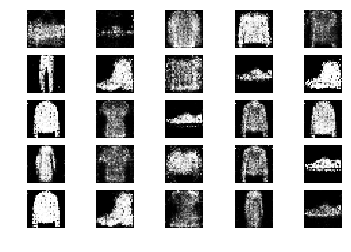

9851 [D loss: 0.649397, acc.: 60.94%] [G loss: 0.960941]
9852 [D loss: 0.611247, acc.: 57.81%] [G loss: 0.993776]
9853 [D loss: 0.593427, acc.: 64.06%] [G loss: 1.004876]
9854 [D loss: 0.710180, acc.: 50.00%] [G loss: 0.843937]
9855 [D loss: 0.641232, acc.: 60.94%] [G loss: 0.951882]
9856 [D loss: 0.663145, acc.: 53.12%] [G loss: 0.833930]
9857 [D loss: 0.621776, acc.: 64.06%] [G loss: 0.926035]
9858 [D loss: 0.652094, acc.: 64.06%] [G loss: 0.864945]
9859 [D loss: 0.681533, acc.: 64.06%] [G loss: 0.863448]
9860 [D loss: 0.731443, acc.: 51.56%] [G loss: 0.803312]
9861 [D loss: 0.600526, acc.: 68.75%] [G loss: 0.815131]
9862 [D loss: 0.579708, acc.: 73.44%] [G loss: 0.832205]
9863 [D loss: 0.745407, acc.: 53.12%] [G loss: 1.017135]
9864 [D loss: 0.653128, acc.: 51.56%] [G loss: 1.036830]
9865 [D loss: 0.664804, acc.: 57.81%] [G loss: 0.967910]
9866 [D loss: 0.615589, acc.: 59.38%] [G loss: 0.983279]
9867 [D loss: 0.660584, acc.: 64.06%] [G loss: 0.921256]
9868 [D loss: 0.649636, acc.: 5

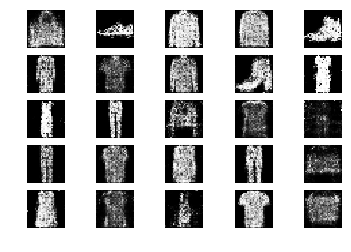

9901 [D loss: 0.661947, acc.: 67.19%] [G loss: 0.972505]
9902 [D loss: 0.689916, acc.: 57.81%] [G loss: 1.050317]
9903 [D loss: 0.637284, acc.: 65.62%] [G loss: 0.884882]
9904 [D loss: 0.644059, acc.: 62.50%] [G loss: 0.903509]
9905 [D loss: 0.630447, acc.: 70.31%] [G loss: 0.882747]
9906 [D loss: 0.714960, acc.: 50.00%] [G loss: 0.959650]
9907 [D loss: 0.604218, acc.: 67.19%] [G loss: 0.923207]
9908 [D loss: 0.684748, acc.: 56.25%] [G loss: 0.937760]
9909 [D loss: 0.615821, acc.: 71.88%] [G loss: 0.959571]
9910 [D loss: 0.679207, acc.: 56.25%] [G loss: 0.864807]
9911 [D loss: 0.656330, acc.: 64.06%] [G loss: 0.861805]
9912 [D loss: 0.600920, acc.: 70.31%] [G loss: 0.887351]
9913 [D loss: 0.665876, acc.: 53.12%] [G loss: 0.903739]
9914 [D loss: 0.613486, acc.: 67.19%] [G loss: 0.990929]
9915 [D loss: 0.622343, acc.: 60.94%] [G loss: 0.881789]
9916 [D loss: 0.636282, acc.: 65.62%] [G loss: 0.896328]
9917 [D loss: 0.660704, acc.: 54.69%] [G loss: 0.918146]
9918 [D loss: 0.592478, acc.: 7

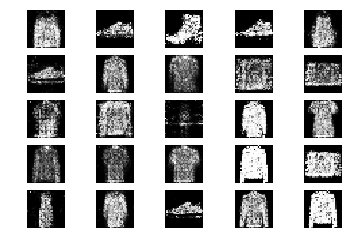

9951 [D loss: 0.623337, acc.: 64.06%] [G loss: 0.937039]
9952 [D loss: 0.684078, acc.: 67.19%] [G loss: 0.897830]
9953 [D loss: 0.629610, acc.: 64.06%] [G loss: 0.953264]
9954 [D loss: 0.590332, acc.: 67.19%] [G loss: 0.926753]
9955 [D loss: 0.660644, acc.: 65.62%] [G loss: 0.980401]
9956 [D loss: 0.665451, acc.: 54.69%] [G loss: 0.874442]
9957 [D loss: 0.662473, acc.: 56.25%] [G loss: 0.918000]
9958 [D loss: 0.670571, acc.: 59.38%] [G loss: 1.010204]
9959 [D loss: 0.620481, acc.: 64.06%] [G loss: 1.038627]
9960 [D loss: 0.615769, acc.: 67.19%] [G loss: 1.024695]
9961 [D loss: 0.666151, acc.: 54.69%] [G loss: 0.848777]
9962 [D loss: 0.688914, acc.: 57.81%] [G loss: 0.832484]
9963 [D loss: 0.655163, acc.: 57.81%] [G loss: 0.867972]
9964 [D loss: 0.604275, acc.: 59.38%] [G loss: 0.924492]
9965 [D loss: 0.656986, acc.: 62.50%] [G loss: 0.912115]
9966 [D loss: 0.708655, acc.: 51.56%] [G loss: 0.879505]
9967 [D loss: 0.628772, acc.: 59.38%] [G loss: 0.909615]
9968 [D loss: 0.659384, acc.: 6

In [13]:
epochs = 10000

batch_size = 32
valid = np.ones((batch_size, 1))
fake = np.zeros((batch_size, 1))

for epoch in range(epochs):
  # Train discriminator
  idx = np.random.randint(0, x_train.shape[0], batch_size)
  imgs = x_train[idx]

  noise = np.random.normal(0, 1, (batch_size, 100))

  gen_imgs = generator.predict(noise)

  d_loss_real = discriminator.train_on_batch(imgs, valid)
  d_loss_fake = discriminator.train_on_batch(gen_imgs, fake)
  d_loss = 0.5*np.add(d_loss_real, d_loss_fake)

  # Train generator
  noise = np.random.normal(0, 1, (batch_size, 100))

  g_loss = combined.train_on_batch(noise, valid)

  print("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))

  if epoch % 50 == 0:
    sample_images(epoch)

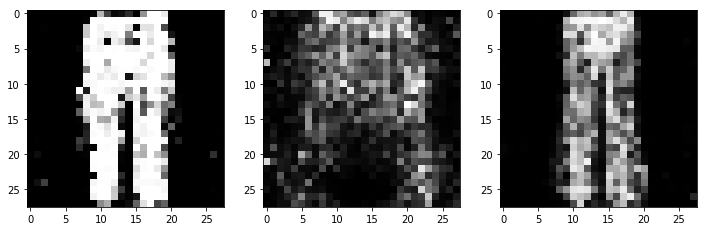

In [17]:
r, c = 5, 5
noise = np.random.normal(0, 1, (r*c, 100))
gen_imgs = generator.predict(noise)

gen_imgs = 0.5*gen_imgs+0.5

plt.figure(figsize=(12, 6))
plt.subplot(131)
plt.imshow(gen_imgs[0, :, :, 0], cmap='gray')
plt.subplot(132)
plt.imshow(gen_imgs[1, :, :, 0], cmap='gray')
plt.subplot(133)
plt.imshow(gen_imgs[2, :, :, 0], cmap='gray')
plt.show()
plt.close()